<a href="https://colab.research.google.com/github/anisantillans/system-for-detecting-anomalies-in-domestic-consumption/blob/main/TFM_Analisis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---
# Inicialización
---

In [1]:
!pip install kneebow

  Preparing metadata (setup.py) ... done
  Created wheel for kneebow: filename=kneebow-1.0.2-py3-none-any.whl size=4726 sha256=497abc997c8fab9dfeea09041717c93a6f4797907094d540fdde827b83b1622f
  Stored in directory: /root/.cache/pip/wheels/c1/84/6f/fd87e177a0ed8c5378a6f0fe56360759a24b331be0cce785c3
Successfully built kneebow


In [2]:
!pip install kneed

In [3]:
#Importar librerías
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import hist
from scipy.stats.mstats import winsorize
from numpy import corrcoef, transpose, arange
import seaborn as sns
import numpy as np
from sklearn import preprocessing
from sklearn.decomposition import PCA
import sklearn.metrics
from scipy import cluster
from pandas.plotting import scatter_matrix
from sklearn.linear_model import LinearRegression
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
from sklearn.preprocessing import MaxAbsScaler, MinMaxScaler, MinMaxScaler, StandardScaler
import time
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from kneebow.rotor import Rotor
from sklearn.metrics import silhouette_score
import itertools
import plotly.express as px
import plotly.graph_objs as go
from sklearn.metrics import silhouette_samples
from sklearn.neighbors import LocalOutlierFactor
from sklearn.cluster import KMeans
import kneed
from collections import Counter
from scipy import stats
from sklearn.ensemble import RandomForestClassifier

In [4]:
data = pd.read_csv('/content/drive/MyDrive/TFM Maestria/domotic1.txt', delimiter=' ')
data

,1:Date,2:Time,3:Temperature_Comedor_Sensor,4:Temperature_Habitacion_Sensor,5:Weather_Temperature,6:CO2_Comedor_Sensor,7:CO2_Habitacion_Sensor,8:Humedad_Comedor_Sensor,9:Humedad_Habitacion_Sensor,10:Lighting_Comedor_Sensor,...,15:Meteo_Exterior_Sol_Oest,16:Meteo_Exterior_Sol_Est,17:Meteo_Exterior_Sol_Sud,18:Meteo_Exterior_Piranometro,19:Exterior_Entalpic_1,20:Exterior_Entalpic_2,21:Exterior_Entalpic_turbo,22:Temperature_Exterior_Sensor,23:Humedad_Exterior_Sensor,24:Day_Of_Week
0,18/04/2012,00:00,20.2000,19.8000,13.0000,207.840,206.560,31.5800,30.1600,11.7200,...,0.00,0.0,0.00,-3.12000,0,0,0,16.0700,39.0800,3.0
1,18/04/2012,00:15,20.1593,19.7600,13.0000,207.499,206.101,31.6240,30.0613,11.5240,...,0.00,0.0,0.00,-2.80800,0,0,0,16.0400,38.9680,3.0
2,18/04/2012,00:30,20.0740,19.6580,13.0000,207.360,206.805,31.6507,30.1773,11.6220,...,0.00,0.0,0.00,-2.96400,0,0,0,16.0160,38.9467,3.0
3,18/04/2012,00:45,19.9773,19.5833,13.0000,207.445,206.325,31.6987,30.2560,11.7847,...,0.00,0.0,0.00,-3.02933,0,0,0,15.9427,39.0760,3.0
4,18/04/2012,01:00,19.8933,19.5000,13.0000,207.840,205.952,31.7707,30.3840,11.5887,...,0.00,0.0,0.00,-2.88600,0,0,0,15.8627,40.0413,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1368,02/05/2012,06:30,18.8000,18.2667,11.0000,199.424,201.963,43.0160,44.9813,21.8500,...,6636.54,35671.4,7454.38,124.49600,0,0,0,14.4833,58.9920,3.0
1369,02/05/2012,06:45,18.7713,18.2153,11.7333,199.200,202.091,43.1920,44.9413,21.1653,...,11818.30,71188.5,12526.90,256.59700,0,0,0,14.7540,58.6213,3.0
1370,02/05/2012,07:00,18.7860,18.2000,12.0000,199.435,201.739,43.3947,44.9333,21.2640,...,10836.30,69498.2,12597.90,281.56800,0,0,0,15.2020,57.6960,3.0
1371,02/05/2012,07:15,18.8133,18.2153,12.5333,200.107,200.597,43.3440,44.7013,28.1647,...,11722.10,79102.0,15796.90,354.64500,0,0,0,15.7260,56.8613,3.0


In [5]:
data.head()

,1:Date,2:Time,3:Temperature_Comedor_Sensor,4:Temperature_Habitacion_Sensor,5:Weather_Temperature,6:CO2_Comedor_Sensor,7:CO2_Habitacion_Sensor,8:Humedad_Comedor_Sensor,9:Humedad_Habitacion_Sensor,10:Lighting_Comedor_Sensor,...,15:Meteo_Exterior_Sol_Oest,16:Meteo_Exterior_Sol_Est,17:Meteo_Exterior_Sol_Sud,18:Meteo_Exterior_Piranometro,19:Exterior_Entalpic_1,20:Exterior_Entalpic_2,21:Exterior_Entalpic_turbo,22:Temperature_Exterior_Sensor,23:Humedad_Exterior_Sensor,24:Day_Of_Week
0,18/04/2012,00:00,20.2000,19.8000,13.0,207.840,206.560,31.5800,30.1600,11.7200,...,0.0,0.0,0.0,-3.12000,0,0,0,16.0700,39.0800,3.0
1,18/04/2012,00:15,20.1593,19.7600,13.0,207.499,206.101,31.6240,30.0613,11.5240,...,0.0,0.0,0.0,-2.80800,0,0,0,16.0400,38.9680,3.0
2,18/04/2012,00:30,20.0740,19.6580,13.0,207.360,206.805,31.6507,30.1773,11.6220,...,0.0,0.0,0.0,-2.96400,0,0,0,16.0160,38.9467,3.0
3,18/04/2012,00:45,19.9773,19.5833,13.0,207.445,206.325,31.6987,30.2560,11.7847,...,0.0,0.0,0.0,-3.02933,0,0,0,15.9427,39.0760,3.0
4,18/04/2012,01:00,19.8933,19.5000,13.0,207.840,205.952,31.7707,30.3840,11.5887,...,0.0,0.0,0.0,-2.88600,0,0,0,15.8627,40.0413,3.0


---
# Preprocesamiento
---

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1373 entries, 0 to 1372
Data columns (total 24 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   1:Date                           1373 non-null   object 
 1   2:Time                           1373 non-null   object 
 2   3:Temperature_Comedor_Sensor     1373 non-null   float64
 3   4:Temperature_Habitacion_Sensor  1373 non-null   float64
 4   5:Weather_Temperature            1373 non-null   float64
 5   6:CO2_Comedor_Sensor             1373 non-null   float64
 6   7:CO2_Habitacion_Sensor          1373 non-null   float64
 7   8:Humedad_Comedor_Sensor         1373 non-null   float64
 8   9:Humedad_Habitacion_Sensor      1373 non-null   float64
 9   10:Lighting_Comedor_Sensor       1373 non-null   float64
 10  11:Lighting_Habitacion_Sensor    1373 non-null   float64
 11  12:Precipitacion                 1373 non-null   float64
 12  13:Meteo_Exterior_Cr

In [7]:
data = data.rename(columns={"1:Date": "date",
                            "2:Time": "time",
                            "3:Temperature_Comedor_Sensor": "temperature_comedor_sensor",
                            "4:Temperature_Habitacion_Sensor": "temperature_habitacion_sensor",
                            "5:Weather_Temperature": "weather_temperature",
                            "6:CO2_Comedor_Sensor": "co2_comedor_sensor",
                            "7:CO2_Habitacion_Sensor": "co2_habitacion_sensor",
                            "8:Humedad_Comedor_Sensor": "humedad_comedor_sensor",
                            "9:Humedad_Habitacion_Sensor": "humedad_habitacion_sensor",
                            "10:Lighting_Comedor_Sensor": "lighting_comedor_sensor",
                            "11:Lighting_Habitacion_Sensor": "lighting_habitacion_sensor",
                            "12:Precipitacion": "precipitacion",
                            "13:Meteo_Exterior_Crepusculo": "meteo_exterior_crepusculo",
                            "14:Meteo_Exterior_Viento": "meteo_exterior_viento",
                            "15:Meteo_Exterior_Sol_Oest": "meteo_exterior_sol_oest",
                            "16:Meteo_Exterior_Sol_Est": "meteo_exterior_sol_est",
                            "17:Meteo_Exterior_Sol_Sud": "meteo_exterior_sol_sud",
                            "18:Meteo_Exterior_Piranometro": "meteo_exterior_piranometro",
                            "19:Exterior_Entalpic_1": "exterior_entalpic_1",
                            "20:Exterior_Entalpic_2": "exterior_entalpic_2",
                            "21:Exterior_Entalpic_turbo": "exterior_entalpic_turbo",
                            "22:Temperature_Exterior_Sensor": "temperature_exterior_sensor",
                            "23:Humedad_Exterior_Sensor": "humedad_exterior_sensor",
                            "24:Day_Of_Week": "day_of_week"
                            }
                   )

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1373 entries, 0 to 1372
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   date                           1373 non-null   object 
 1   time                           1373 non-null   object 
 2   temperature_comedor_sensor     1373 non-null   float64
 3   temperature_habitacion_sensor  1373 non-null   float64
 4   weather_temperature            1373 non-null   float64
 5   co2_comedor_sensor             1373 non-null   float64
 6   co2_habitacion_sensor          1373 non-null   float64
 7   humedad_comedor_sensor         1373 non-null   float64
 8   humedad_habitacion_sensor      1373 non-null   float64
 9   lighting_comedor_sensor        1373 non-null   float64
 10  lighting_habitacion_sensor     1373 non-null   float64
 11  precipitacion                  1373 non-null   float64
 12  meteo_exterior_crepusculo      1373 non-null   f

Observamos que tenemos las siguientes variables en el dataset:

1.   **Variables categóricas**
    *   date
    *   time
    *   day_of_week
2.   **Variables numéricas**
    *   temperature_comedor_sensor
    *   temperature_habitacion_sensor
    *   weather_temperature
    *   co2_comedor_sensor
    *   co2_habitacion_sensor
    *   humedad_comedor_sensor
    *   humedad_habitacion_sensor
    *   lighting_comedor_sensor
    *   lighting_habitacion_sensor
    *   precipitacion
    *   meteo_exterior_crepusculo
    *   meteo_exterior_viento
    *   meteo_exterior_sol_oest
    *   meteo_exterior_sol_est
    *   meteo_exterior_sol_sud
    *   meteo_exterior_piranometro
    *   exterior_entalpic_1
    *   exterior_entalpic_2
    *   exterior_entalpic_turbo
    *   temperature_exterior_sensor
    *   humedad_exterior_sensor

## Análisis de las variables categóricas

*   **Variable date**

In [9]:
data['date'].unique()

array(['18/04/2012', '19/04/2012', '20/04/2012', '21/04/2012',
       '22/04/2012', '23/04/2012', '24/04/2012', '25/04/2012',
       '26/04/2012', '27/04/2012', '28/04/2012', '29/04/2012',
       '30/04/2012', '01/05/2012', '02/05/2012'], dtype=object)

Observamos que contamos con 15 días de data, desde la fecha 18/04/2012 hasta el 02/05/2012.

Diagrama de barras de la variable date:


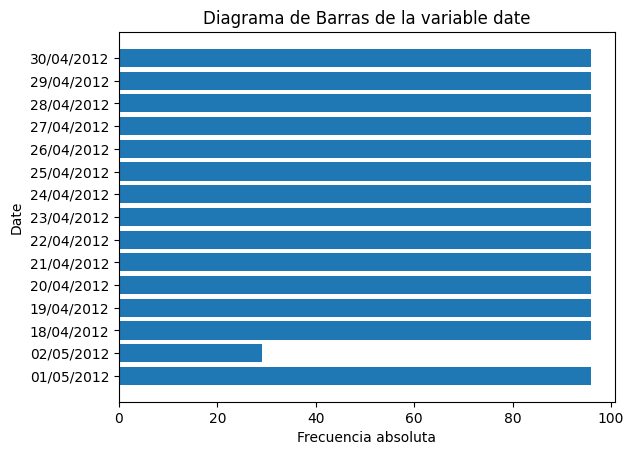

In [10]:
print("Diagrama de barras de la variable date:")
date_counts = data['date'].value_counts().sort_index()
plt.barh(date_counts.index, date_counts.values)
plt.xlabel('Frecuencia absoluta')
plt.ylabel('Date')
plt.title('Diagrama de Barras de la variable date')
plt.show()

Con el diagrama de barras de la variable "date", observamos que para día 02/05/2012 tenemos menos datos.

*   **Variable time**

In [11]:
data['time'].unique()

array(['00:00', '00:15', '00:30', '00:45', '01:00', '01:15', '01:30',
       '01:45', '02:00', '02:15', '02:30', '02:45', '03:00', '03:15',
       '03:30', '03:45', '04:00', '04:15', '04:30', '04:45', '05:00',
       '05:15', '05:30', '05:45', '06:00', '06:15', '06:30', '06:45',
       '07:00', '07:15', '07:30', '07:45', '08:00', '08:15', '08:30',
       '08:45', '09:00', '09:15', '09:30', '09:45', '10:00', '10:15',
       '10:30', '10:45', '11:00', '11:15', '11:30', '11:45', '12:00',
       '12:15', '12:30', '12:45', '13:00', '13:15', '13:30', '13:45',
       '14:00', '14:15', '14:30', '14:45', '15:00', '15:15', '15:30',
       '15:45', '16:00', '16:15', '16:30', '16:45', '17:00', '17:15',
       '17:30', '17:45', '18:00', '18:15', '18:30', '18:45', '19:00',
       '19:15', '19:30', '19:45', '20:00', '20:15', '20:30', '20:45',
       '21:00', '21:15', '21:30', '21:45', '22:00', '22:15', '22:30',
       '22:45', '23:00', '23:15', '23:30', '23:45'], dtype=object)

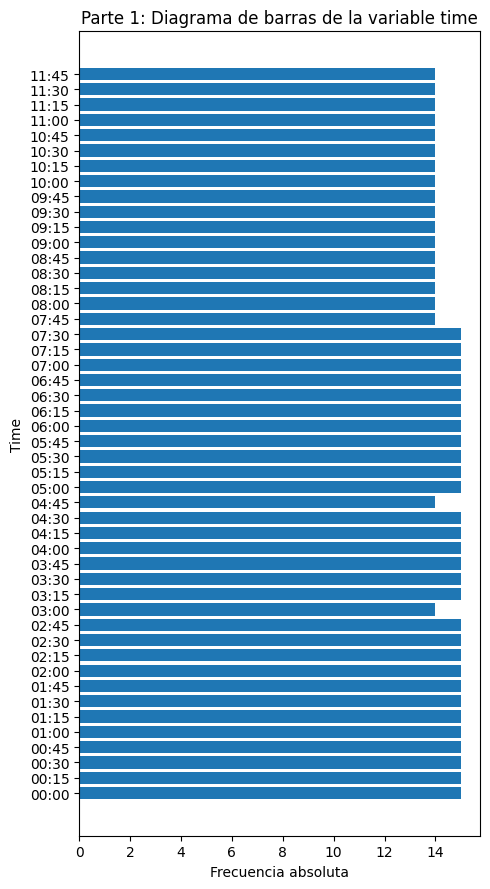

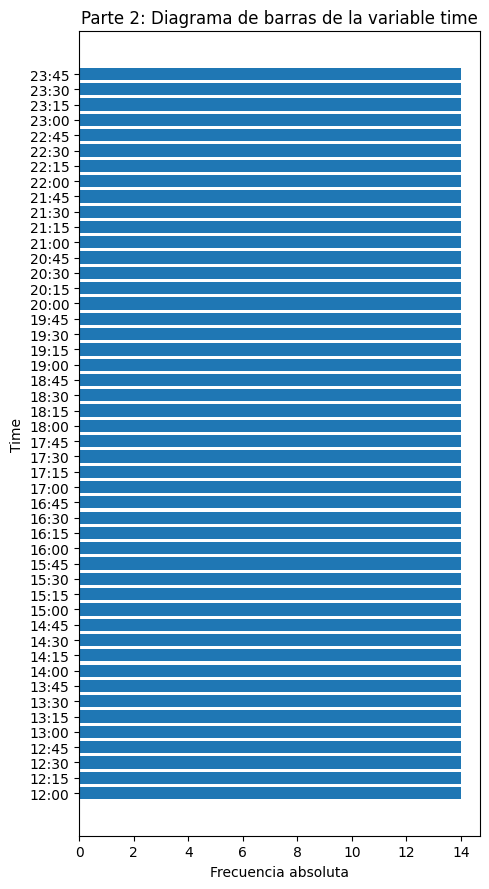

In [12]:
time_counts_ordenado = data['time'].value_counts().sort_index()

midpoint = len(time_counts_ordenado)// 2
time_counts_parte1 = time_counts_ordenado[:midpoint]
time_counts_parte2 = time_counts_ordenado[midpoint:]

plt.figure(figsize=(5, 9))
plt.barh(time_counts_parte1.index, time_counts_parte1.values)
plt.title('Parte 1: Diagrama de barras de la variable time')
plt.xlabel('Frecuencia absoluta')
plt.ylabel('Time')
plt.tight_layout()
plt.show()

plt.figure(figsize=(5, 9))
plt.barh(time_counts_parte2.index, time_counts_parte2.values)
plt.title('Parte 2: Diagrama de barras de la variable time')
plt.xlabel('Frecuencia absoluta')
plt.ylabel('Time')
plt.tight_layout()
plt.show()

Observamos que para el rango de horas 00:00 hasta las 07:30 tenemos más registros fluctuantes.

*   **Variable day_of_week**

In [13]:
data['day_of_week'].unique()

array([3.     , 3.06667, 4.     , 4.06667, 5.     , 5.06667, 6.     ,
       6.06667, 7.     , 6.6    , 1.     , 1.06667, 2.     , 2.06667])

Diagrama de barras de la variable 'day_of_week':


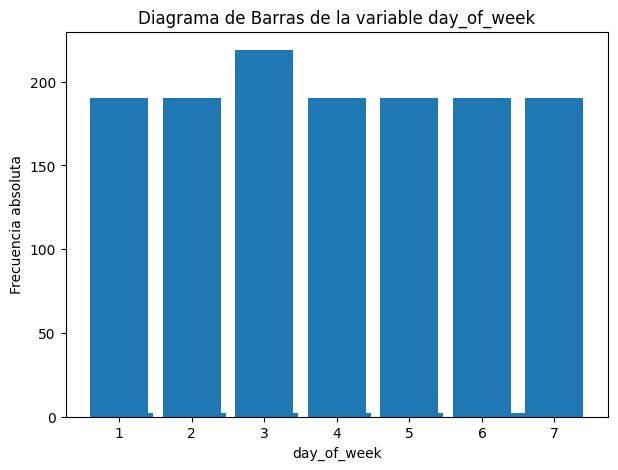

In [14]:
print("Diagrama de barras de la variable 'day_of_week':")
plt.figure(figsize=(7, 5))
day_of_week_counts = data['day_of_week'].value_counts().sort_index()
plt.bar(day_of_week_counts.index, day_of_week_counts.values)
plt.xlabel('day_of_week')
plt.ylabel('Frecuencia absoluta')
plt.title('Diagrama de Barras de la variable day_of_week')
plt.show()

Considerando:
*   1 : Lunes
*   2 : Martes
*   3 : Miércoles
*   4 : Jueves
*   5 : Viernes
*   6 : Sábado
*   7 : Domingo

Observamos que, para el día miércoles tenemos más información que a diferencia de los demás días.






## Análisis de las variables numéricas

In [15]:
#Listamos las variables numéricas
numerical_variables = [
    'temperature_comedor_sensor',
    'temperature_habitacion_sensor',
    'weather_temperature',
    'co2_comedor_sensor',
    'co2_habitacion_sensor',
    'humedad_comedor_sensor',
    'humedad_habitacion_sensor',
    'lighting_comedor_sensor',
    'lighting_habitacion_sensor',
    'precipitacion',
    'meteo_exterior_crepusculo',
    'meteo_exterior_viento',
    'meteo_exterior_sol_oest',
    'meteo_exterior_sol_est',
    'meteo_exterior_sol_sud',
    'meteo_exterior_piranometro',
    'exterior_entalpic_1',
    'exterior_entalpic_2',
    'exterior_entalpic_turbo',
    'temperature_exterior_sensor',
    'humedad_exterior_sensor'
]

Partimos los atributos numéricos en dos grupos, para un mejor análisis:

In [16]:
first_attributes = [
    'temperature_comedor_sensor',
    'temperature_habitacion_sensor',
    'weather_temperature',
    'co2_comedor_sensor',
    'co2_habitacion_sensor'
]
data[first_attributes].describe()

,temperature_comedor_sensor,temperature_habitacion_sensor,weather_temperature,co2_comedor_sensor,co2_habitacion_sensor
count,1373.000000,1373.000000,1373.000000,1373.000000,1373.000000
mean,23.098108,22.805766,17.498908,202.816621,206.684117
std,2.552107,2.534529,3.739828,8.303086,10.862867
min,16.983300,16.797300,9.000000,189.195000,192.107000
25%,21.182700,20.925300,15.000000,197.867000,199.541000
50%,23.192000,22.852000,17.000000,203.115000,207.925000
75%,24.964000,24.664000,20.000000,206.219000,210.731000
max,28.924000,28.548000,29.000000,278.645000,313.216000


Revisamos las variables del primer grupo:
*   **temperature_comedor_sensor**: la desviación estándar es baja, lo que significa que los datos se tienden a estar cerca de la media. Los valores de los percentiles pertenecen en un buen rango.
*   **temperature_habitacion_sensor**: la desviación estándar no está elevada. La media y mediana tienen valores muy parecidos.
*   **weather_temperature**: la desviación estándar no está elevada. Los percentiles están en un rango moderado con respecto a sus valores mínimos y máximos.
*   **co2_comedor_sensor**: la desviación estándar está elevada, los datos en esta variable están dispersos en el rango de los valores mínimos y máximos. La mediana posee un mayor valor que la media.
*  **co2_habitacion_sensor**: la desviación estándar tiene un valor alto. La mediana es ligeramente superior que la media.






In [17]:
second_attributes = [
    'humedad_comedor_sensor',
    'humedad_habitacion_sensor',
    'lighting_comedor_sensor',
    'lighting_habitacion_sensor',
    'precipitacion'
]
data[second_attributes].describe()

,humedad_comedor_sensor,humedad_habitacion_sensor,lighting_comedor_sensor,lighting_habitacion_sensor,precipitacion
count,1373.000000,1373.000000,1373.000000,1373.000000,1373.000000
mean,37.380174,38.959385,33.449148,45.562360,0.022093
std,5.653677,6.765015,29.418966,42.988297,0.138203
min,26.173300,27.256000,10.838000,13.509300,0.000000
25%,32.484000,32.569300,11.540700,14.906700,0.000000
50%,35.841300,38.812000,20.823300,24.416000,0.000000
75%,42.925300,44.701300,51.573300,67.520000,0.000000
max,52.589300,52.624000,111.797000,157.157000,1.000000


Revisamos las variables del segundo grupo:
*   **humedad_comedor_sensor**: la desviación estándar está un poco elevada. La media es superior que la mediana.
*   **humedad_habitacion_sensor**: la desviación estándar está levemente alta. Su media y mediana tienen valores muy similares.
*   **lighting_comedor_sensor**: la desviación estándar es alta, es decir, los datos están bien dispersos en el rango de sus valores mínimos y máximos. La media es superior que la mediana. Analizando el percentil 75 con el valor máximo, es muy probable que la variable tenga datos atípicos.
*   **lighting_habitacion_sensor**: la desviación estándar es alta. La media es casi el doble que el valor de la mediana.
*   **precipitacion**: la desviación estándar es muy baja. La mediana y media poseen valores muy cercanos. El valor mínimo, perentil 25, mediana y 75 tienen el mismo valor, que es 0.

In [18]:
third_attributes = [
    'meteo_exterior_crepusculo',
    'meteo_exterior_viento',
    'meteo_exterior_sol_oest',
    'meteo_exterior_sol_est',
    'meteo_exterior_sol_sud'
]
data[third_attributes].describe()

,meteo_exterior_crepusculo,meteo_exterior_viento,meteo_exterior_sol_oest,meteo_exterior_sol_est,meteo_exterior_sol_sud
count,1373.000000,1373.000000,1373.000000,1373.000000,1373.000000
mean,354.671855,1.699378,14371.755460,16220.137264,15447.785256
std,302.567396,1.251345,23932.658023,25966.803138,20945.850541
min,0.606667,0.000000,0.000000,0.000000,0.000000
25%,0.650000,0.614667,0.000000,0.000000,0.000000
50%,615.360000,1.572670,2802.690000,3024.900000,2609.150000
75%,620.437000,2.716000,13545.500000,17013.400000,26637.700000
max,625.003000,5.354000,93121.200000,92367.500000,77359.800000


Revisemos las variables del segundo grupo:
*   **meteo_exterior_crepusculo**: la desviación estándar está muy elevada, es decir, los datos de la variable están muy dispersos a lo largo de los rangos mínimos y máximos, es muy probable que posea valos atípicos. El valor de la mediana es superior que la media.
*   **meteo_exterior_viento**: la desviación estándar es baja. La media y mediana poseen valores muy similares.
*   **meteo_exterior_sol_oest**: la desviación estándar es muy elevada. La media es superior que la mediana. El valor máximo a diferencia con el mínimo, está prominente.
*   **meteo_exterior_sol_est**: la desviación estándar está muy alta, posee datos muy dispersos. La media es superior que la mediana. El valor máximo a diferencia con el mínimo, está prominente.
*   **meteo_exterior_sol_sud**: la desviación estándar está muy alta. El valor de la media es superior que la mediana.








In [19]:
fourth_attributes = [
    'meteo_exterior_piranometro',
    'exterior_entalpic_1',
    'exterior_entalpic_2',
    'exterior_entalpic_turbo',
    'temperature_exterior_sensor',
    'humedad_exterior_sensor'
]
data[fourth_attributes].describe()

,meteo_exterior_piranometro,exterior_entalpic_1,exterior_entalpic_2,exterior_entalpic_turbo,temperature_exterior_sensor,humedad_exterior_sensor
count,1373.000000,1373.0,1373.0,1373.0,1373.000000,1373.000000
mean,266.816322,0.0,0.0,0.0,20.558838,47.755124
std,338.532417,0.0,0.0,0.0,3.910093,12.794045
min,-3.708000,0.0,0.0,0.0,11.933300,22.246700
25%,-3.042000,0.0,0.0,0.0,17.600700,37.338700
50%,35.816000,0.0,0.0,0.0,20.264700,46.845300
75%,566.293000,0.0,0.0,0.0,23.465300,57.872000
max,1094.660000,0.0,0.0,0.0,29.870700,75.890700


*   **meteo_exterior_piranometro**: la desviación estándar es alta. La media es superior que la mediana.
*   **exterior_entalpic_1**, **exterior_entalpic_2** y **exterior_entalpic_turbo**: poseen solo el valor de 0 en sus datos.
*   **temperature_exterior_sensor**: la desviación estándar es baja. La media y mediana son muy similares.
*   **humedad_exterior_sensor**: la desviación estándar es alta. La media es ligeramente superior que la mediana.

In [20]:
# Realizamos una función que nos permita diagramar los histogramas
# y diagrama de cajas para cada una de las variables numéricas

def histograma_y_boxplot(df, variable):

  print(" "*30,"Histograma"," "*30)
  hist(df[variable], bins = 'auto')
  title = 'Histograma de la variable ' + variable
  plt.title(title, fontdict = {'fontsize':14})
  plt.show()

  print("\n")
  print(" "*25,"Diagrama de cajas"," "*25)
  df[variable].plot.box(figsize = (6,4))
  plt.show()

------------------------------ Variable temperature_comedor_sensor ------------------------------
                               Histograma                               


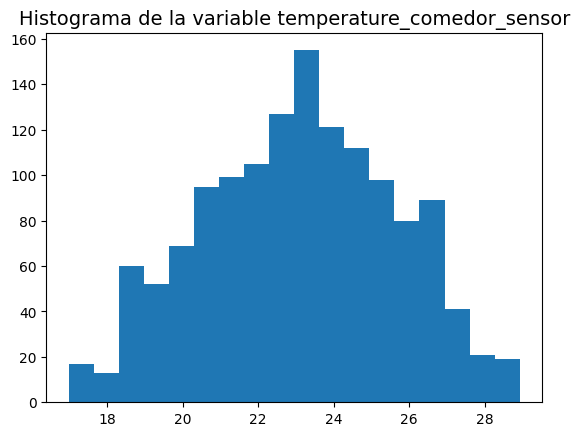



                          Diagrama de cajas                          


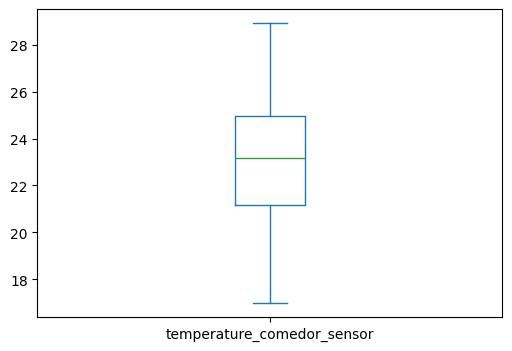

------------------------------ Variable temperature_habitacion_sensor ------------------------------
                               Histograma                               


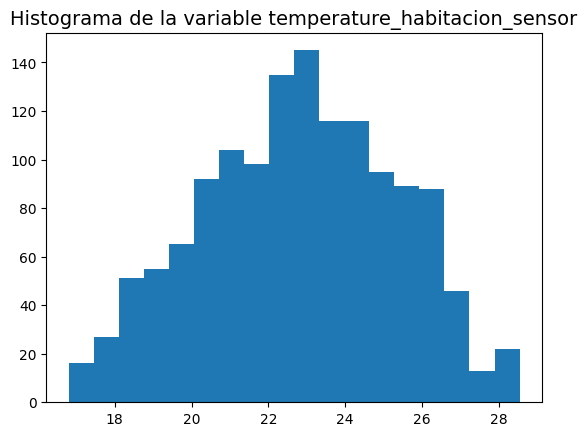



                          Diagrama de cajas                          


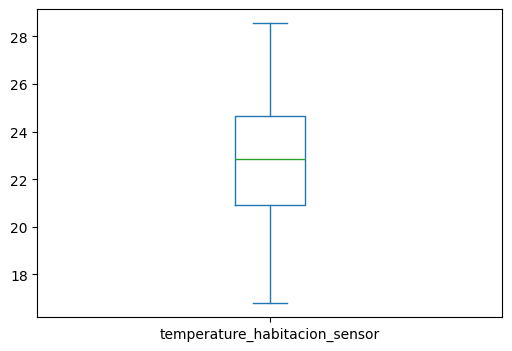

------------------------------ Variable weather_temperature ------------------------------
                               Histograma                               


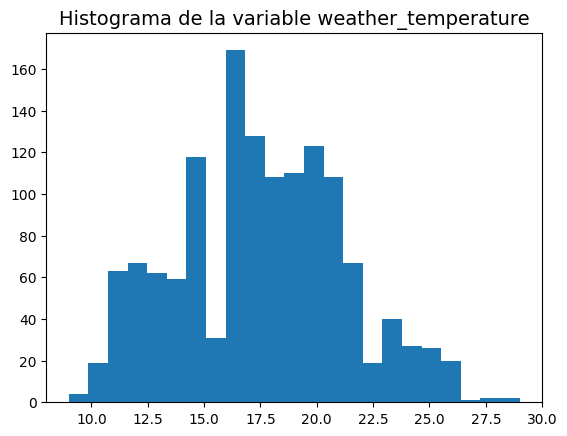



                          Diagrama de cajas                          


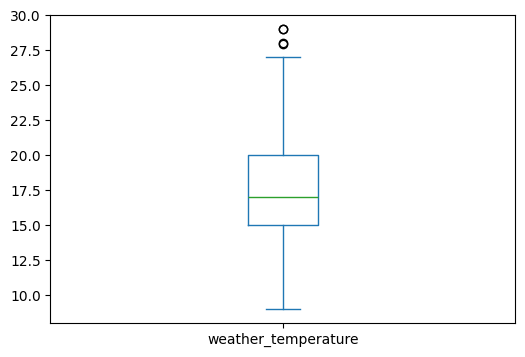

------------------------------ Variable co2_comedor_sensor ------------------------------
                               Histograma                               


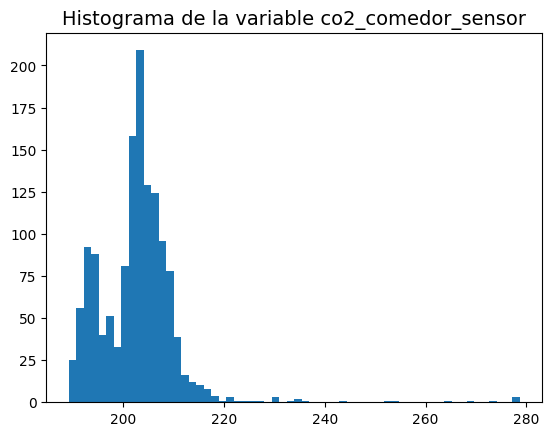



                          Diagrama de cajas                          


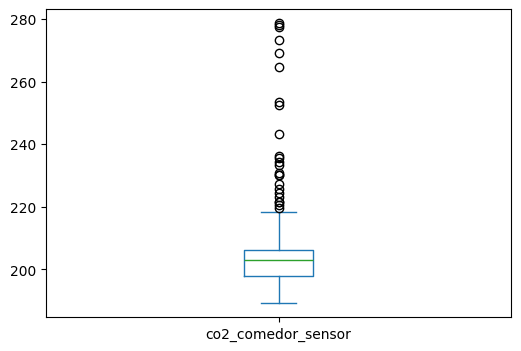

------------------------------ Variable co2_habitacion_sensor ------------------------------
                               Histograma                               


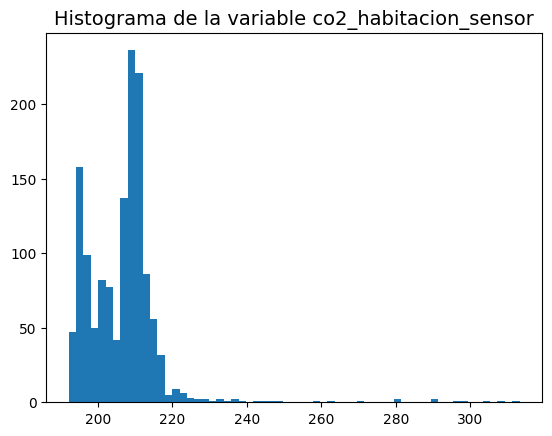



                          Diagrama de cajas                          


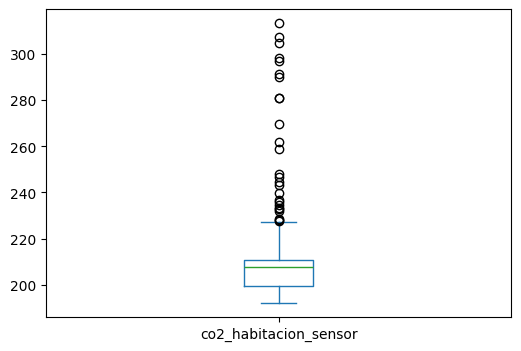

------------------------------ Variable humedad_comedor_sensor ------------------------------
                               Histograma                               


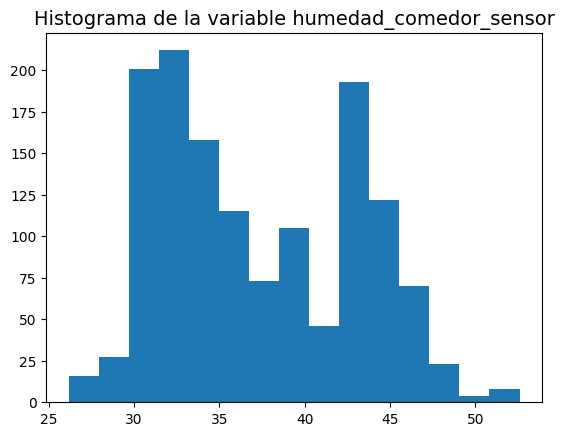



                          Diagrama de cajas                          


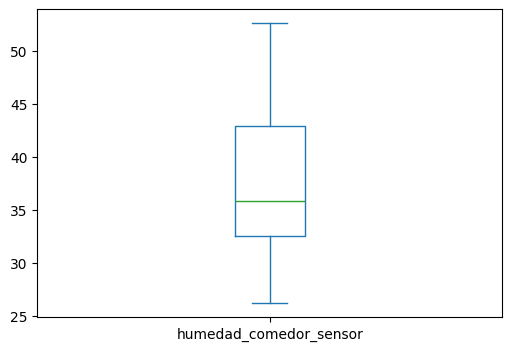

------------------------------ Variable humedad_habitacion_sensor ------------------------------
                               Histograma                               


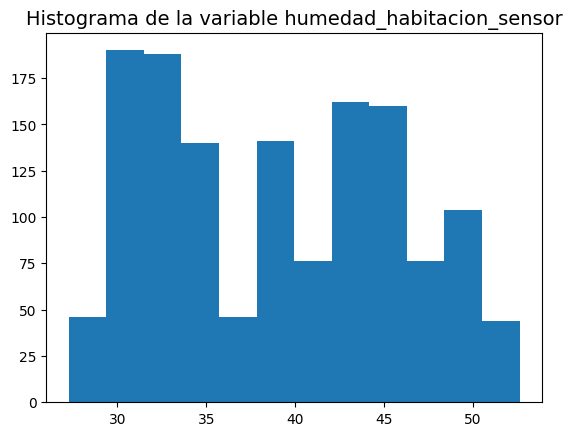



                          Diagrama de cajas                          


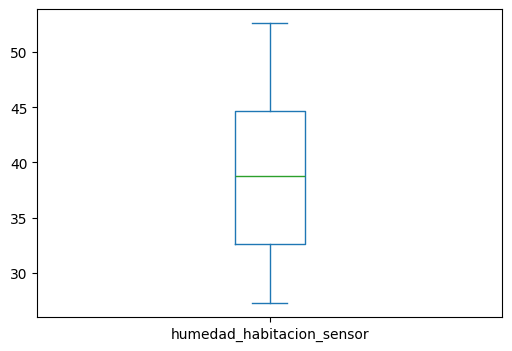

------------------------------ Variable lighting_comedor_sensor ------------------------------
                               Histograma                               


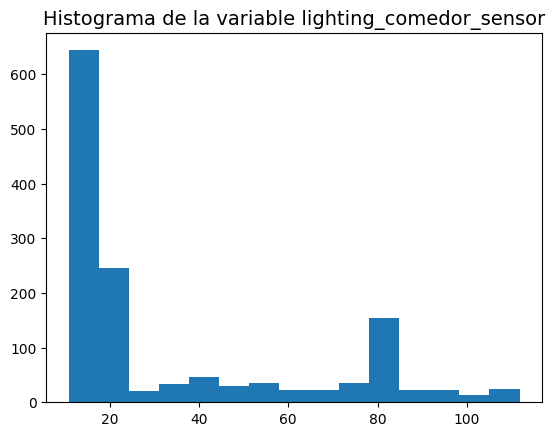



                          Diagrama de cajas                          


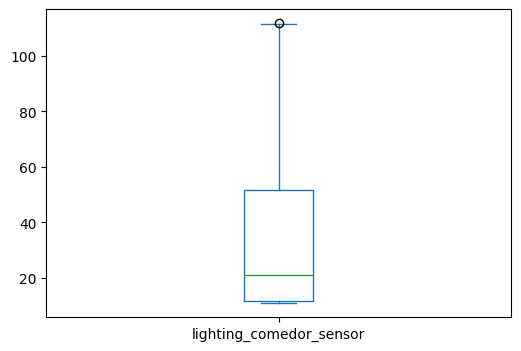

------------------------------ Variable lighting_habitacion_sensor ------------------------------
                               Histograma                               


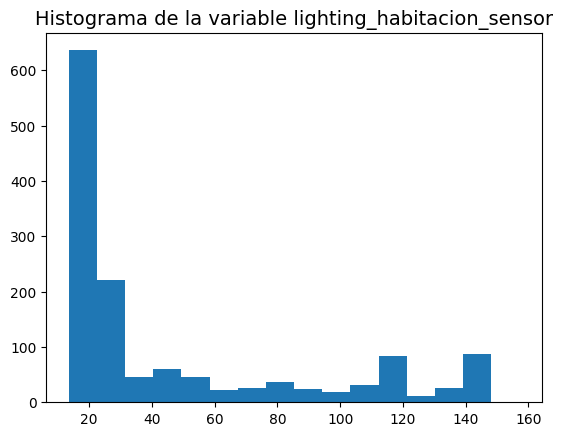



                          Diagrama de cajas                          


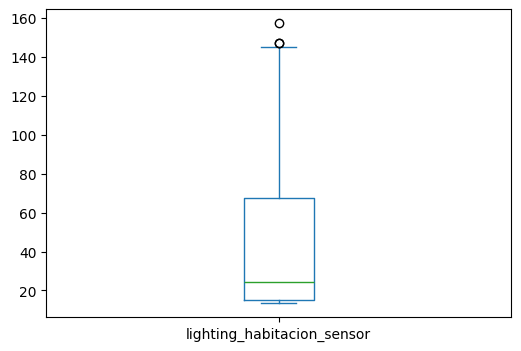

------------------------------ Variable precipitacion ------------------------------
                               Histograma                               


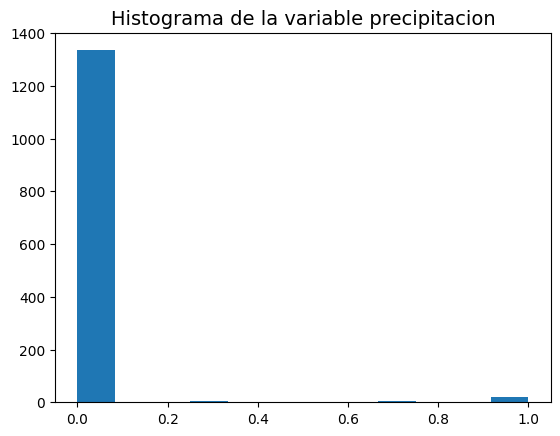



                          Diagrama de cajas                          


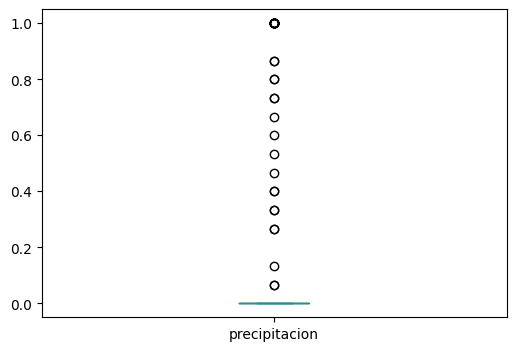

------------------------------ Variable meteo_exterior_crepusculo ------------------------------
                               Histograma                               


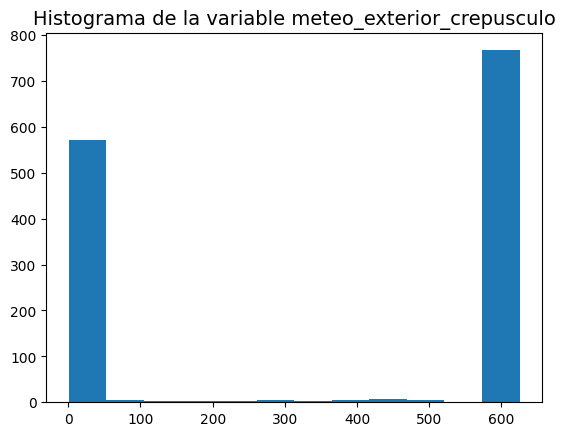



                          Diagrama de cajas                          


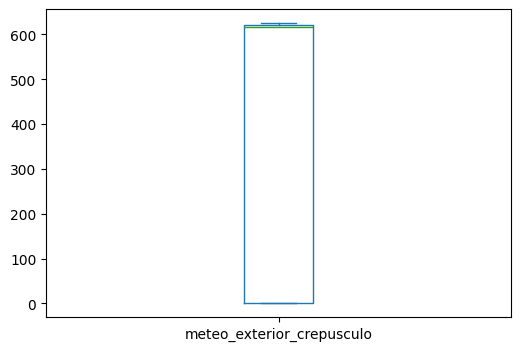

------------------------------ Variable meteo_exterior_viento ------------------------------
                               Histograma                               


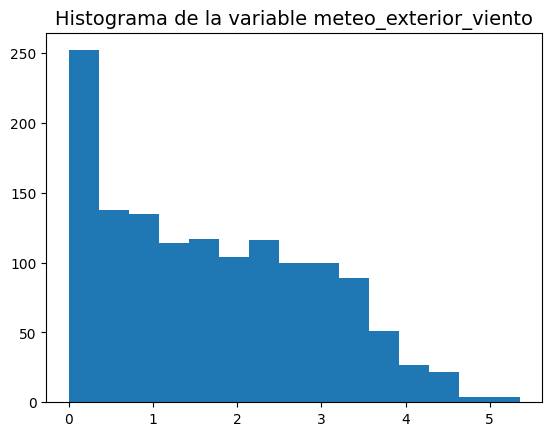



                          Diagrama de cajas                          


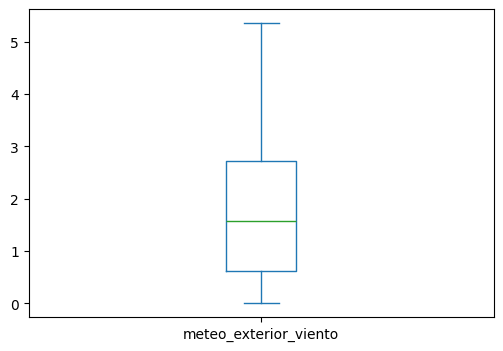

------------------------------ Variable meteo_exterior_sol_oest ------------------------------
                               Histograma                               


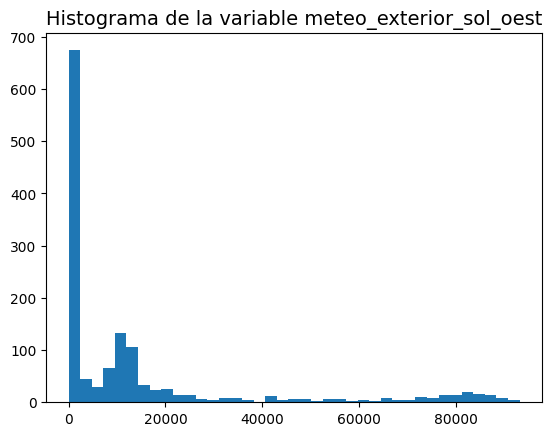



                          Diagrama de cajas                          


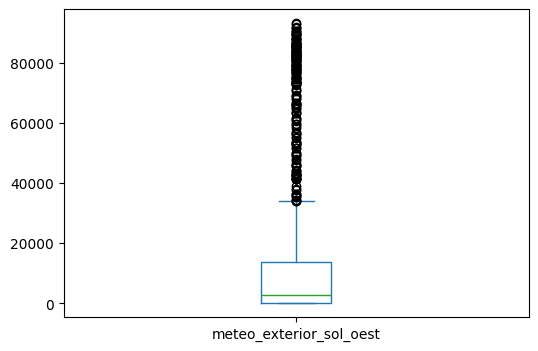

------------------------------ Variable meteo_exterior_sol_est ------------------------------
                               Histograma                               


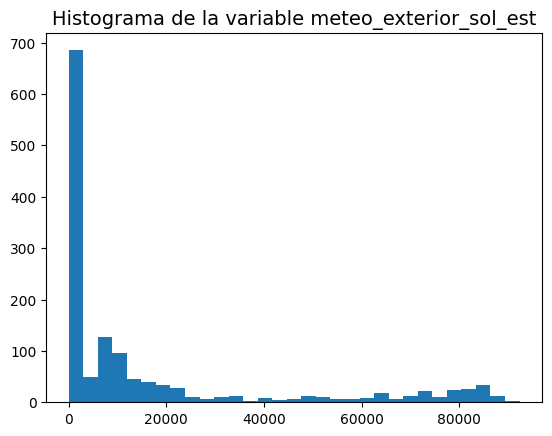



                          Diagrama de cajas                          


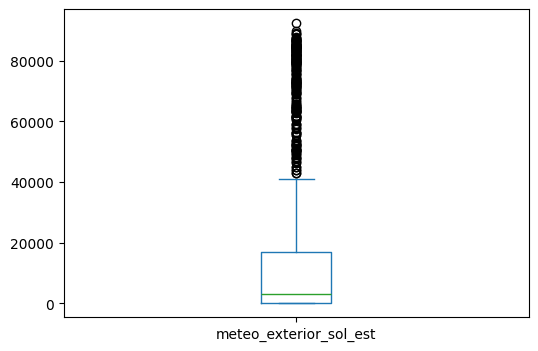

------------------------------ Variable meteo_exterior_sol_sud ------------------------------
                               Histograma                               


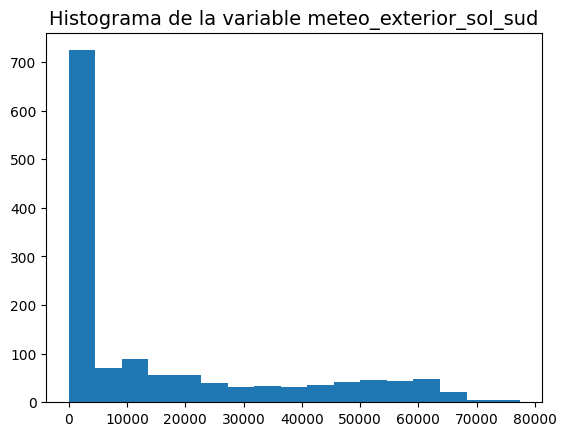



                          Diagrama de cajas                          


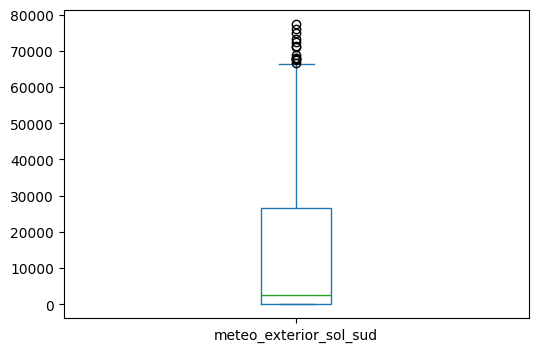

------------------------------ Variable meteo_exterior_piranometro ------------------------------
                               Histograma                               


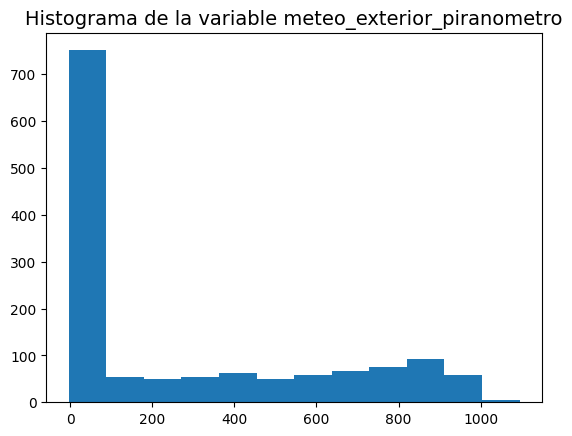



                          Diagrama de cajas                          


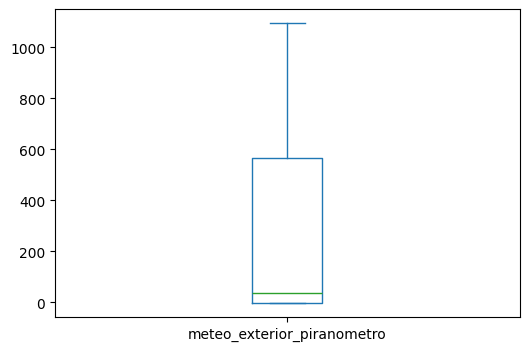

------------------------------ Variable exterior_entalpic_1 ------------------------------
                               Histograma                               


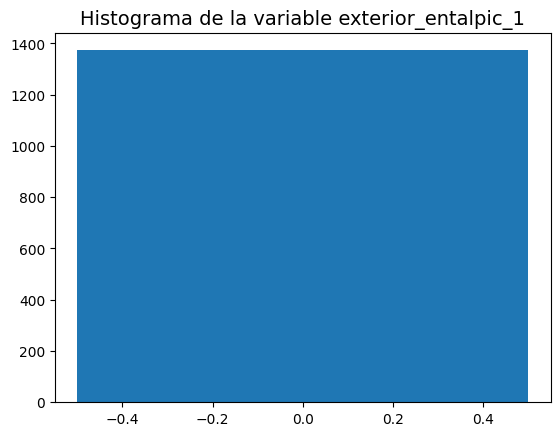



                          Diagrama de cajas                          


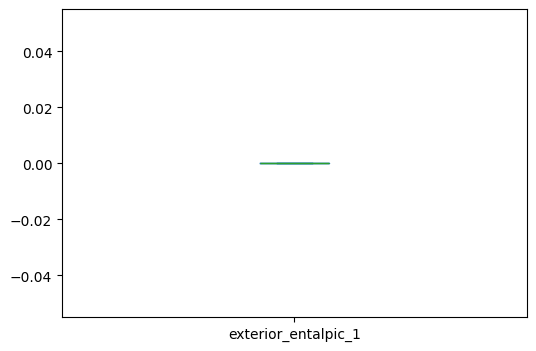

------------------------------ Variable exterior_entalpic_2 ------------------------------
                               Histograma                               


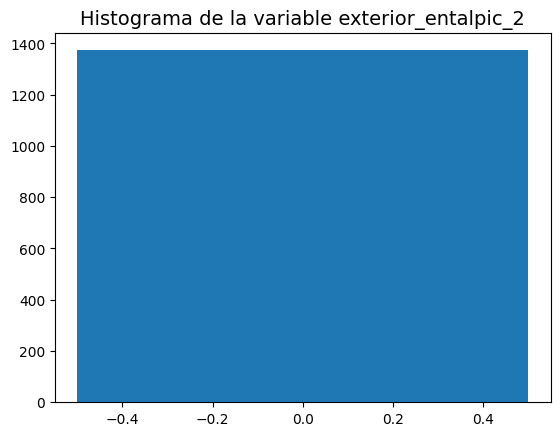



                          Diagrama de cajas                          


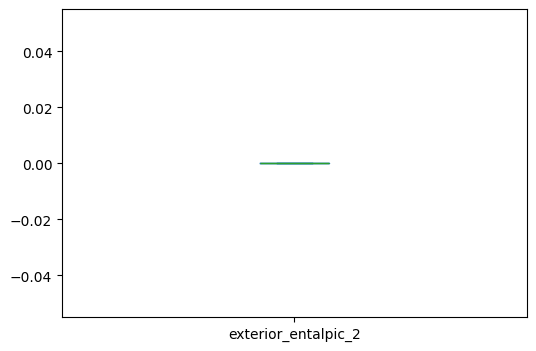

------------------------------ Variable exterior_entalpic_turbo ------------------------------
                               Histograma                               


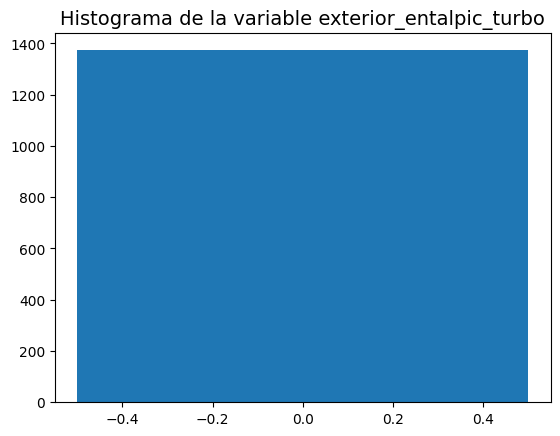



                          Diagrama de cajas                          


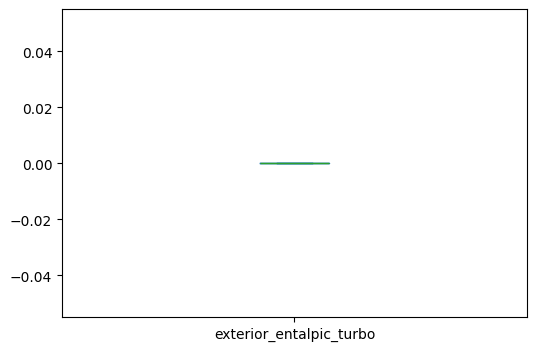

------------------------------ Variable temperature_exterior_sensor ------------------------------
                               Histograma                               


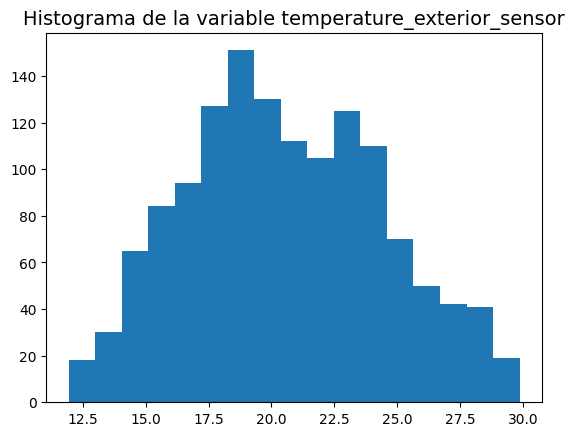



                          Diagrama de cajas                          


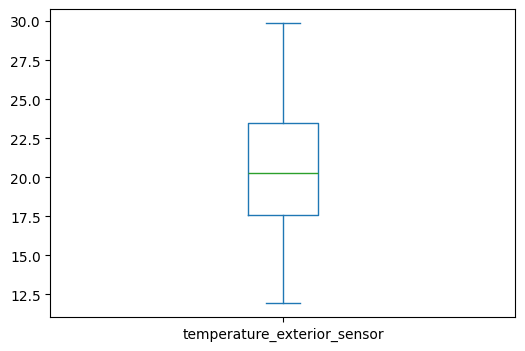

------------------------------ Variable humedad_exterior_sensor ------------------------------
                               Histograma                               


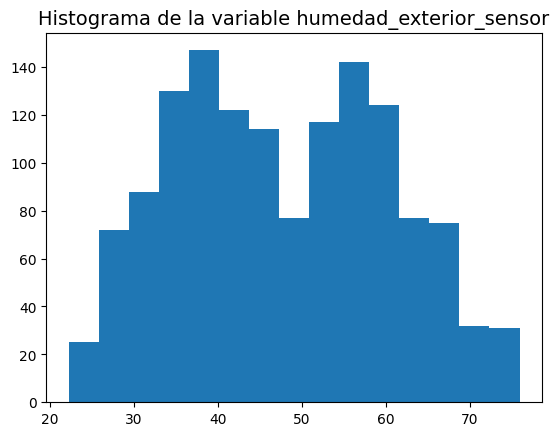



                          Diagrama de cajas                          


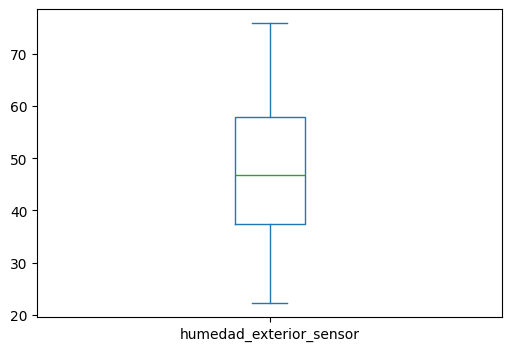

In [21]:
# Representar las variables numéricas en Histogramas y diagrama de cajas
for var_numerical in numerical_variables:
  print("-"*30, "Variable", var_numerical, "-"*30)
  histograma_y_boxplot(data, var_numerical)

**Interpretación de los histogramas y diagramas de cajas en el dataset**
*   **temperature_comedor_sensor**: observamos que la data de la variable es simétrica por la mediana.
*   **temperature_habitacion_sensor**: observamos que la data de la variable es simétrica por la mediana.
*   **weather_temperature**: presenta outliers por encima del bigote superior del diagrama de cajas.
*   **co2_comedor_sensor**: tiene muchos outliers por encima del bigote superior.
*  **co2_habitacion_sensor**: presenta muchos outliers por encima del bigote superior. Así mismo, observamos que posee datos sesgados positivamente.
*   **humedad_comedor_sensor**: no presenta outliers.
*   **humedad_habitacion_sensor**: no presenta outliers y observamos que posee una data simétrica por la mediana.
*   **lighting_comedor_sensor**: posee muy pocos valores atípicos por encima del bigote superior. Así mismo, observamos que sus datos están sesgados positivamente.
*   **lighting_habitacion_sensor**: posee muy pocos valores atípicos por encima del bigote superior. Así mismo, observamos que sus datos están sesgados positivamente.
*   **precipitacion**: presenta muchos outliers por encima de su bigote superior. El valor mínimo, percentil 25, mediana y 75 tienen el mismo valor, que es 0.
*   **meteo_exterior_crepusculo**: no tiene outliers. Así mismo, sus datos están sesgados negativamente.
*   **meteo_exterior_viento**: no presenta outliers, y sus datos están sesgados positivamente.
*   **meteo_exterior_sol_oest**: presenta muchos outliers por encima de su bigote superior. Además, sus datos tiene un sesgo positivo.
*   **meteo_exterior_sol_est**: presenta muchos outliers por encima de su bigote superior. Además, sus datos tiene un sesgo positivo.
*   **meteo_exterior_sol_sud**: tiene outliers por encima de su bigote superior. Además, sus datos tiene un sesgo positivo.
*   **meteo_exterior_piranometro**: no posee outliers. Así mismo, sus datos cuentan con sesgo positivo.
*   **exterior_entalpic_1**, **exterior_entalpic_2** y **exterior_entalpic_turbo**: poseen solo el valor de 0 en sus datos.
*   **temperature_exterior_sensor**: no tiene outliers. Así mismo, sus datos poseen simetría.
*   **humedad_exterior_sensor**: no tiene outliers.


Se realiza la Ley de Potencia para algunas variables, donde que la mayoría de los datos tienen valores pequeños y unos pocos tienen valores grandes. De esa forma, determinar si presentan valores atípicos.

In [22]:
def ley_de_protencia(df, variable_name):
  variable = df[variable_name]

  frecuencias = Counter(variable)

  valores = np.array(list(frecuencias.keys()))
  cuentas = np.array(list(frecuencias.values()))

  #Se filtran los  valores > 0 (ya que el algoritmo de 0 es indefinido)
  valores_no_cero = valores[valores > 0]
  cuentas_no_cero = cuentas[valores > 0]

  log_valores = np.log(valores_no_cero)
  log_cuentas = np.log(cuentas_no_cero)

  #Se ajustan una regresión lineal a los datos log-log
  slope, intercept, r_value, p_value, std_err = stats.linregress(log_valores, log_cuentas)

  #Se crean los valores ajustados (predicción de la línea recta)
  log_cuentas_ajustadas = slope * log_valores + intercept

  plt.scatter(log_valores, log_cuentas, label='Datos')
  plt.plot(log_valores, log_cuentas_ajustadas, color='red', label=f'Línea ajustada: y = {slope:.2f}x + {intercept:.2f}')
  title = 'Gráfico log-log para la variable ' + variable_name
  xlabel = 'Log(' + variable_name + ')'
  plt.xlabel(xlabel)
  plt.ylabel("Log(Frecuencia)")
  plt.title(title)
  plt.legend()
  plt.show()

  #Coeficiente de determinación (R^2)
  print(f"Coeficiente de determinación (R^2): {r_value**2:.4f}")

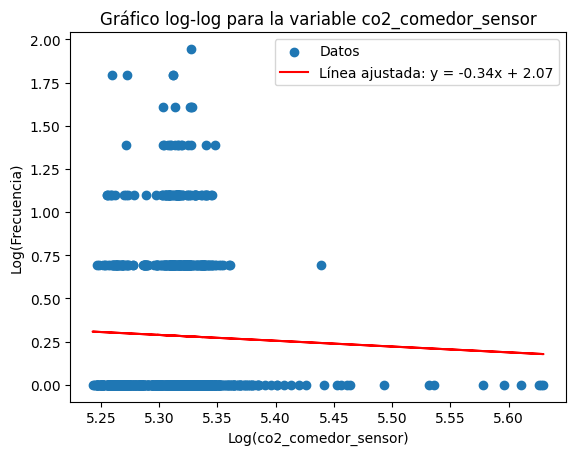

Coeficiente de determinación (R^2): 0.0012


In [23]:
variable = 'co2_comedor_sensor'
ley_de_protencia(data, variable)

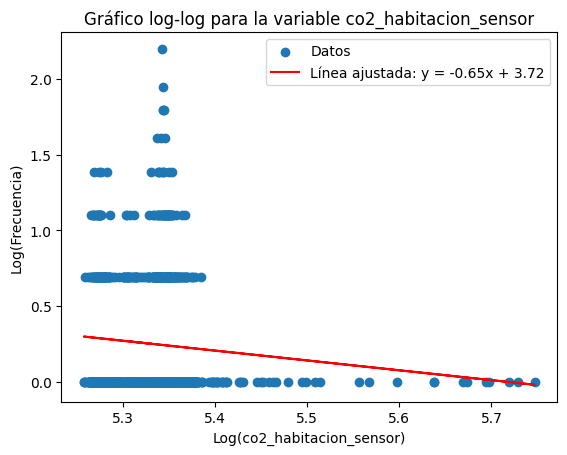

Coeficiente de determinación (R^2): 0.0072


In [24]:
variable = 'co2_habitacion_sensor'
ley_de_protencia(data, variable)

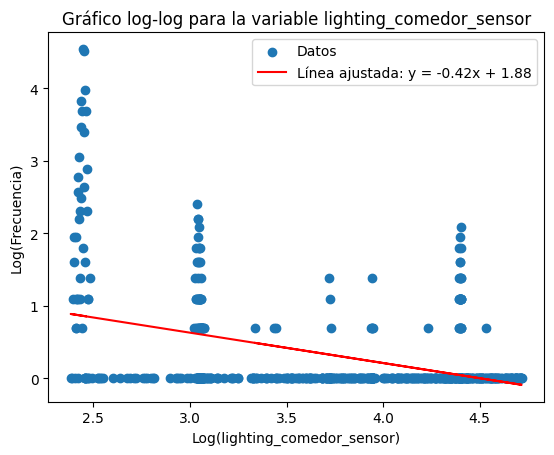

Coeficiente de determinación (R^2): 0.1642


In [25]:
variable = 'lighting_comedor_sensor'
ley_de_protencia(data, variable)

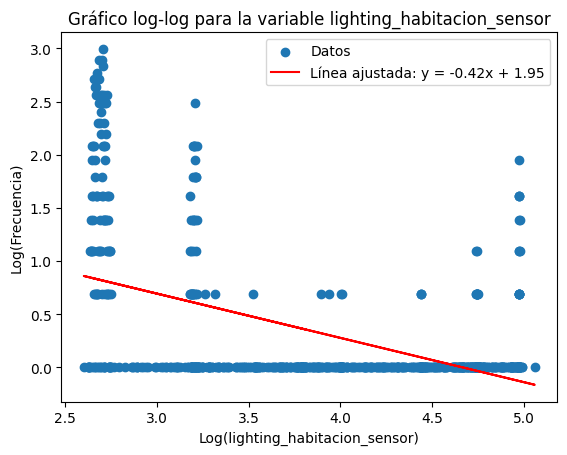

Coeficiente de determinación (R^2): 0.2336


In [26]:
variable = 'lighting_habitacion_sensor'
ley_de_protencia(data, variable)

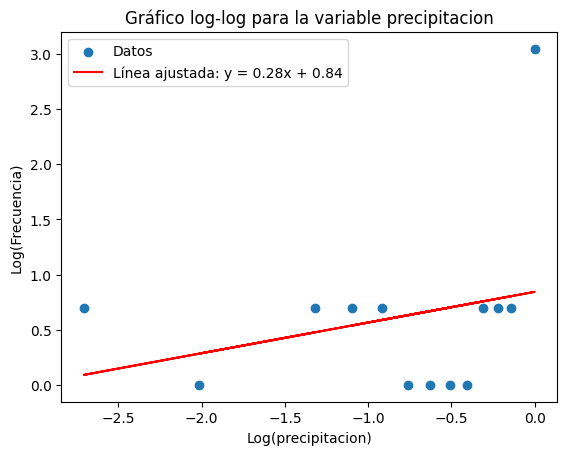

Coeficiente de determinación (R^2): 0.0727


In [27]:
variable = 'precipitacion'
ley_de_protencia(data, variable)

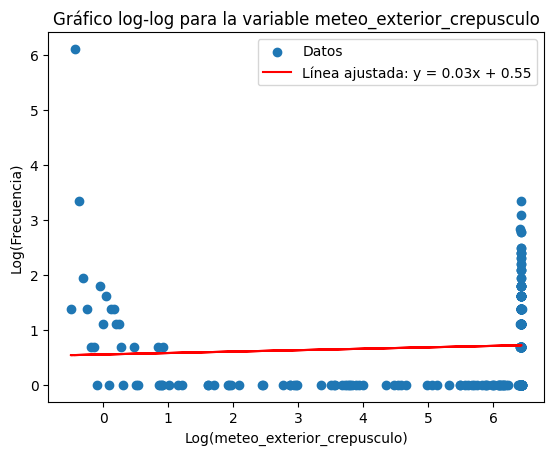

Coeficiente de determinación (R^2): 0.0037


In [28]:
variable = 'meteo_exterior_crepusculo'
ley_de_protencia(data, variable)

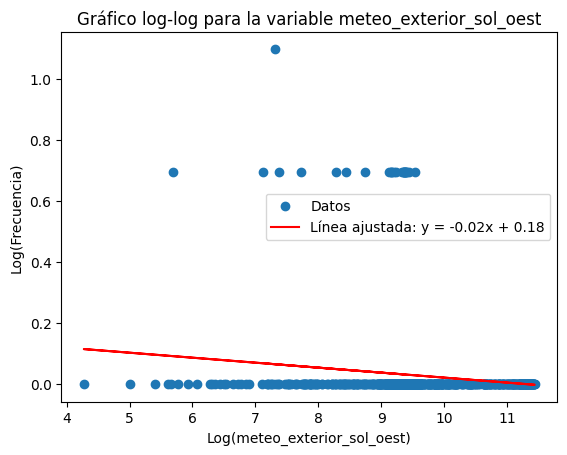

Coeficiente de determinación (R^2): 0.0210


In [29]:
variable = 'meteo_exterior_sol_oest'
ley_de_protencia(data, variable)

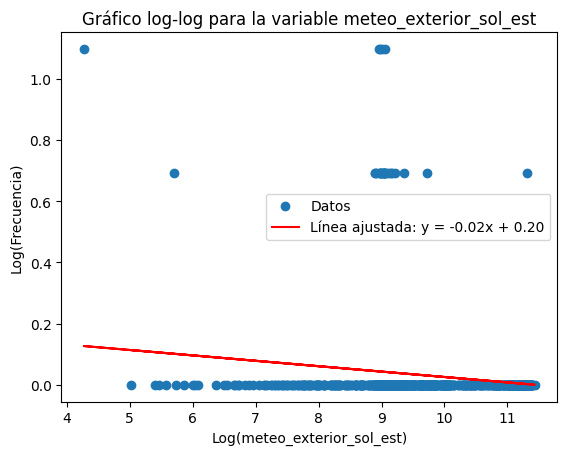

Coeficiente de determinación (R^2): 0.0214


In [30]:
variable = 'meteo_exterior_sol_est'
ley_de_protencia(data, variable)

Como se observa en los gráficos, ninguna variable sigue la distribución de Ley de Potencia.

## Detectando los outliers

Sacamos una copia de los datos originales:

In [31]:
data_without_outliers = data.copy()

In [32]:
# Método de imputación con la mediana para tratar outliers
def imputacion_con_mediana(df, variable):

  # Calculamos los percentiles
  q3 = df[variable].quantile(0.75)
  q1 = df[variable].quantile(0.25)

  # Obtenemos el rango intercuartílico
  iqr = q3 - q1

  # Límite superior e inferior
  limite_superior = q3 + (1.5 * iqr)
  limite_inferior = q1 - (1.5 * iqr)

  outliers = df[(df[variable] < limite_inferior) | (df[variable] > limite_superior)]

  # Calculamos la mediana
  mediana = df[variable].median()

  # Imputamos los outliers
  df.loc[outliers.index, variable] = mediana

In [33]:
#Método de la Mediana Absoluta de Desviación (MAD)
#Es una medida robusta de dispersión que se utiliza para identificar y suprimir outliers,
#especialmente en datos sesgados o con valores atípicos extremos.
#(https://en.wikipedia.org/wiki/Median_absolute_deviation)

def mediana_absoluta_de_desviacion(df, variable, k):
  # Calculamos la mediana
  mediana = df[variable].median()

  # Calculamos la Mediana Absoluta de Desviación (MAD)
  MAD = np.median(np.abs(df[variable] - mediana))
  print("MAD: ", MAD)

  # Calculamos los límites del umbral
  umbral_superior = mediana + k * MAD
  umbral_inferior = mediana - k * MAD
  print("Límite superior: ", umbral_superior)
  print("Límite inferior: ", umbral_inferior)

  # Reemplazamos outliers con los límites del umbral
  columna_remplazada = df[variable].copy()
  columna_remplazada[(df[variable] < umbral_inferior) | (df[variable] > umbral_superior)] = np.where(
      df[variable] < umbral_inferior, umbral_inferior, umbral_superior
  )
  df[variable] = columna_remplazada

In [34]:
# Método de winsorizacion para tratar outliers, implicaría reemplazar
# los valores atípicos con los valores no atípicos más próximos.

def winsorizacion(df, variable, limits):
  df[variable] = winsorize(df[variable], limits = limits, inplace = True)

*   **Outliers de la variable "co2_comedor_sensor"**

                               Histograma                               


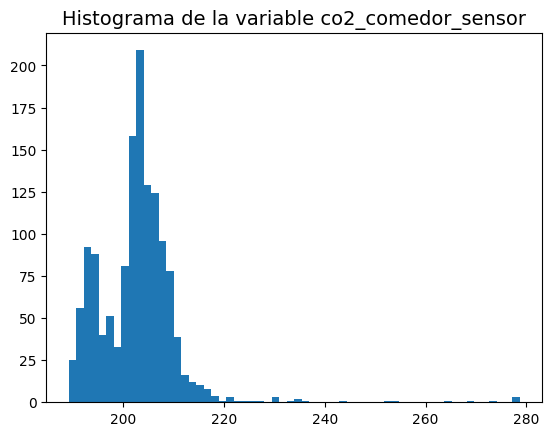



                          Diagrama de cajas                          


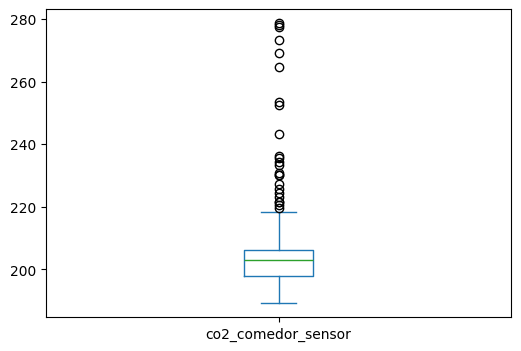

In [35]:
histograma_y_boxplot(data_without_outliers, "co2_comedor_sensor")

Sacamos una copia de la data:

In [36]:
data_without_outliers_winso = data_without_outliers.copy()

                               Histograma                               


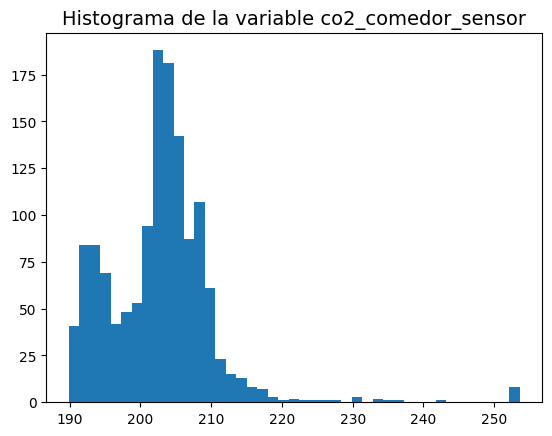



                          Diagrama de cajas                          


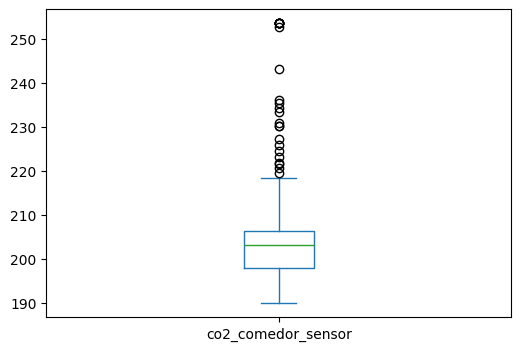

In [37]:
# Winsorizar el 0.5% de los valores más altos y el 0.5% de los valores más bajos
# de la matriz, esto es equivalente al 100% – 0.5% – 0.5% = 99% Winsorización.
# Significa que se modifica el 0.5% de cada área de la cola.

limits = [0.005, 0.005]

winsorizacion(data_without_outliers_winso, 'co2_comedor_sensor', limits)

histograma_y_boxplot(data_without_outliers_winso, 'co2_comedor_sensor')

Visualizamos la media de la variable "co2_comedor_sensor" con los datos reales y outliers:

In [38]:
data['co2_comedor_sensor'].mean()

202.8166205389658

Visualizamos la media winsorizada:

In [39]:
data_without_outliers_winso['co2_comedor_sensor'].mean()

202.73044719592133

Ahora probamos utilizando el método de la Mediana Absoluta de Desviación (MAD) para detectar y reemplazar los outliers

In [40]:
data_without_outliers_mad = data_without_outliers.copy()

MAD:  3.680000000000007
Límite superior:  221.51500000000004
Límite inferior:  184.71499999999997
                               Histograma                               


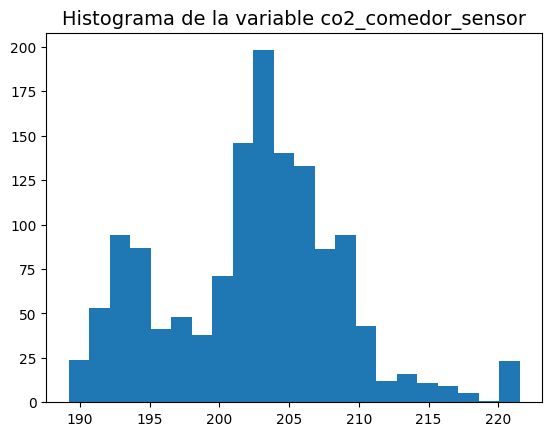



                          Diagrama de cajas                          


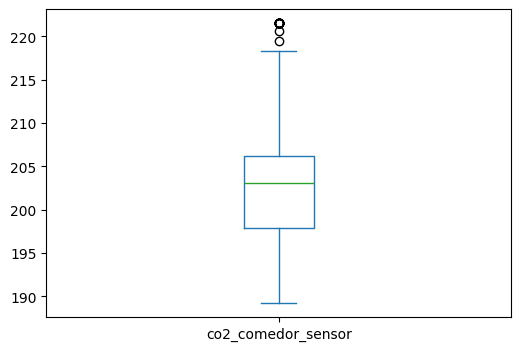

In [41]:
mediana_absoluta_de_desviacion(data_without_outliers_mad, 'co2_comedor_sensor', 5)
histograma_y_boxplot(data_without_outliers_mad, 'co2_comedor_sensor')

Visualizamos la media y desviación estándar con los nuevos datos:

In [42]:
data_without_outliers_mad['co2_comedor_sensor'].mean()

202.458676620539

In [43]:
data_without_outliers_mad['co2_comedor_sensor'].std()

6.397225109101269

**Conclusión**
Con el método MAD obtenemos mejores resultados, detectando los outliers y reemplazándolos con los valores de los umbrales calculados, ya que no necesitamos eliminar todos los valores atípicos, solo suavizarlos, por ser datos importantes en el análisis del proyecto.

In [44]:
#Reemplazamos los nuevos valores de la variable 'co2_comedor_sensor'
data_without_outliers = data_without_outliers_mad

*   **Outliers de la variable "co2_habitacion_sensor"**

Datos reales:

                               Histograma                               


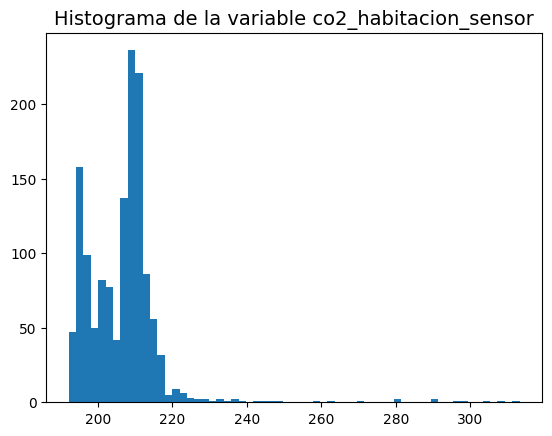



                          Diagrama de cajas                          


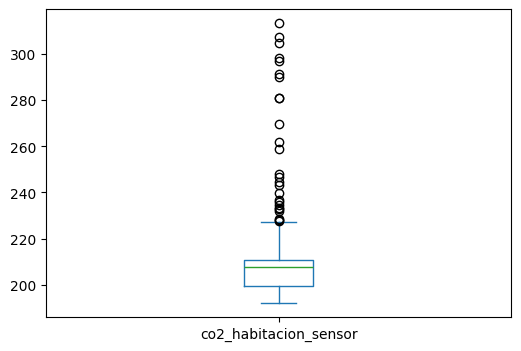

In [45]:
histograma_y_boxplot(data_without_outliers, "co2_habitacion_sensor")

Probamos utilizando el método de la Mediana Absoluta de Desviación (MAD) para detectar y reemplazar los outliers:

MAD:  4.629000000000019
Límite superior:  231.0700000000001
Límite inferior:  184.77999999999992
                               Histograma                               


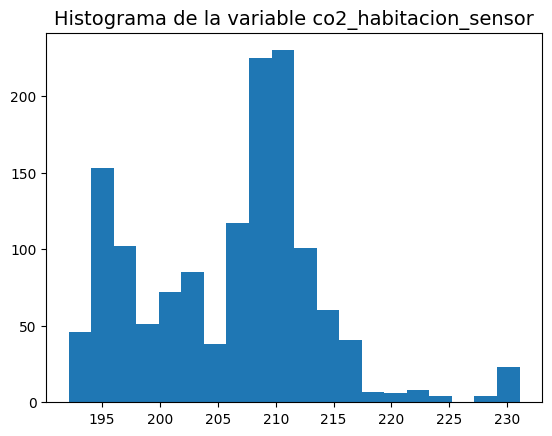



                          Diagrama de cajas                          


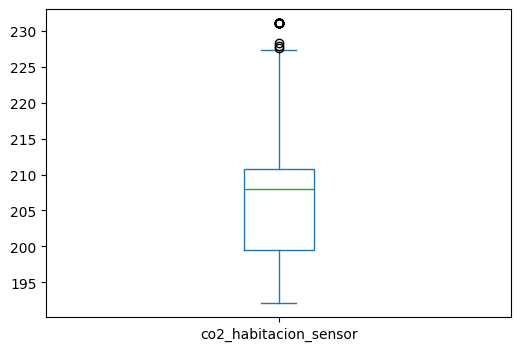

In [46]:
mediana_absoluta_de_desviacion(data_without_outliers, 'co2_habitacion_sensor', 5)
histograma_y_boxplot(data_without_outliers, 'co2_habitacion_sensor')

Visualizamos la media y desviación estándar con los nuevos datos:

In [47]:
data_without_outliers['co2_habitacion_sensor'].mean()

206.12652585579022

In [48]:
data_without_outliers['co2_habitacion_sensor'].std()

7.68945735252726

**Conclusión**
Observamos que con el método de MAD tenemos buenos resultados.

*   **Outliers de la variable "precipitacion"**

Datos reales:

                               Histograma                               


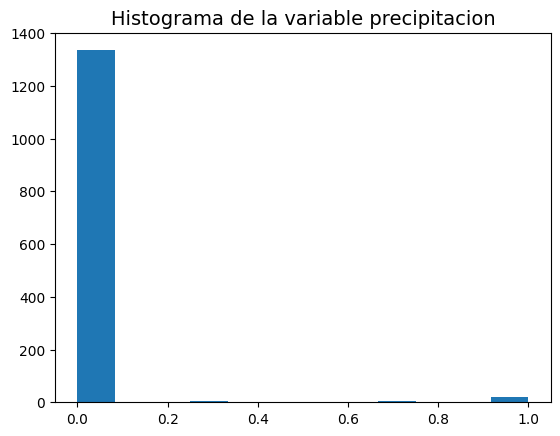



                          Diagrama de cajas                          


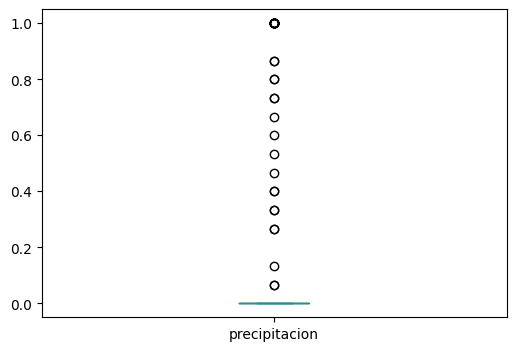

In [49]:
histograma_y_boxplot(data_without_outliers, "precipitacion")

Sacamos una copia de la data

In [50]:
data_without_outliers_winso = data_without_outliers.copy()

                               Histograma                               


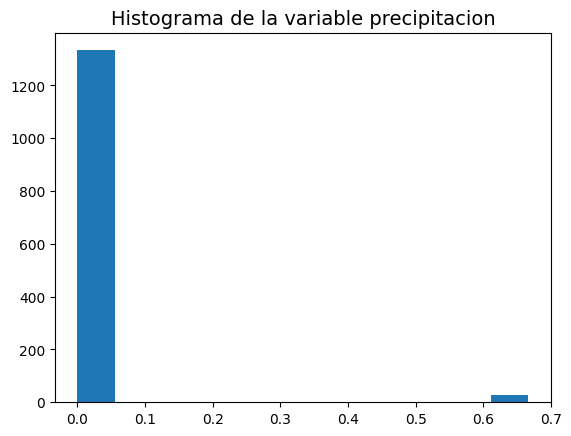



                          Diagrama de cajas                          


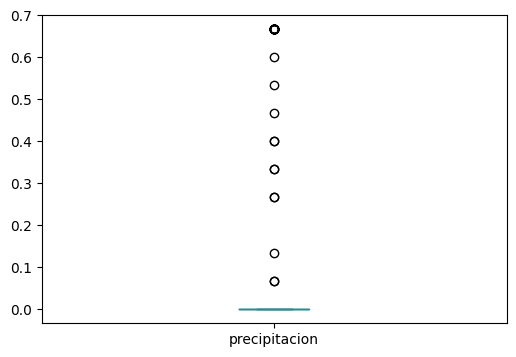

In [51]:
# Winsorizar el 2% de los valores más altos y el 2% de los valores más bajos
# de la matriz, esto es equivalente al 100% – 2% – 2% = 96% Winsorización.
# Significa que se modifica el 2% de cada área de la cola.


limits = [0.02, 0.02]

winsorizacion(data_without_outliers_winso, 'precipitacion', limits)

histograma_y_boxplot(data_without_outliers_winso, 'precipitacion')

Probamos utilizando el método de la Mediana Absoluta de Desviación (MAD) para detectar y reemplazar los outliers:

In [52]:
data_without_outliers_mad = data_without_outliers.copy()

MAD:  0.0
Límite superior:  0.0
Límite inferior:  0.0
                               Histograma                               


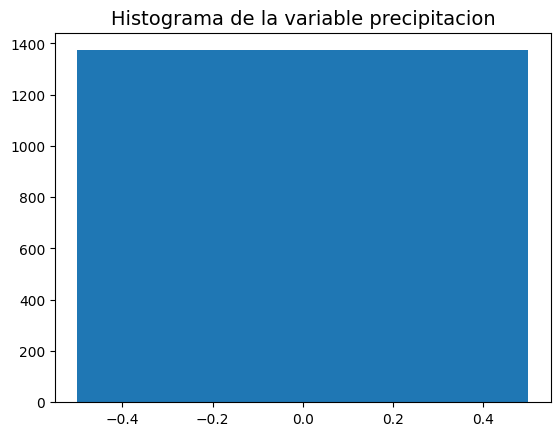



                          Diagrama de cajas                          


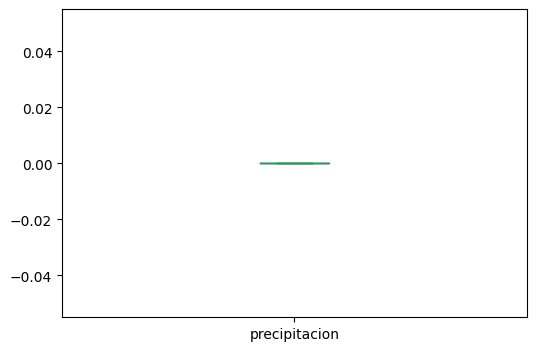

In [53]:
mediana_absoluta_de_desviacion(data_without_outliers_mad, 'precipitacion', 5)
histograma_y_boxplot(data_without_outliers_mad, 'precipitacion')

Visualizamos la media y desviación estándar con los nuevos datos:

In [54]:
data_without_outliers_mad['precipitacion'].mean()

0.0

In [55]:
data_without_outliers_mad['precipitacion'].std()

0.0

**Conclusiones**
Observamos que si reemplazando los outliers en la variable "precipitacion", todos los valores serían 0. Para el caso de dicha variable el valor 0, significa una precipitación débil, por ende, se considera necesario usar el método de winsorización para la detección y disminución de outliers.

In [56]:
#Reemplazamos los nuevos valores de la variable 'precipitacion'
data_without_outliers = data_without_outliers_winso

*   **Outliers de la variable "meteo_exterior_sol_oest"**

Datos reales:

                               Histograma                               


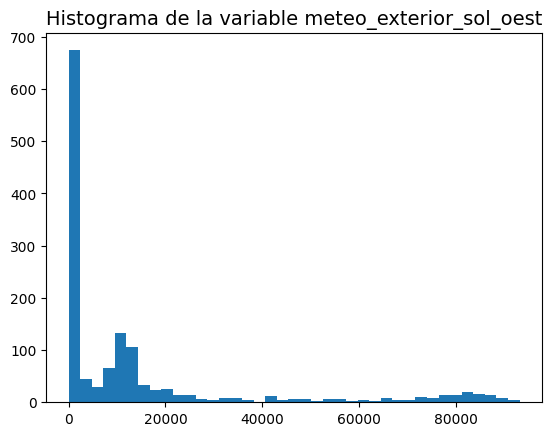



                          Diagrama de cajas                          


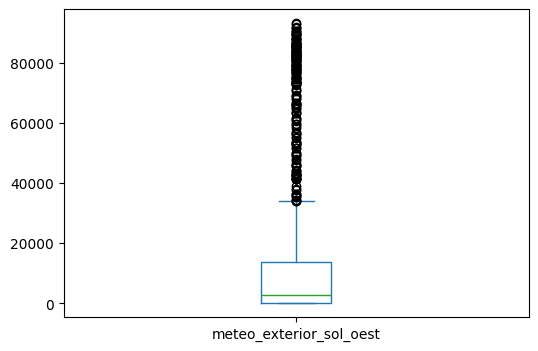

In [57]:
histograma_y_boxplot(data_without_outliers, "meteo_exterior_sol_oest")

Realizaremos la imputación con la mediana para la "meteo_exterior_sol_oest":

                               Histograma                               


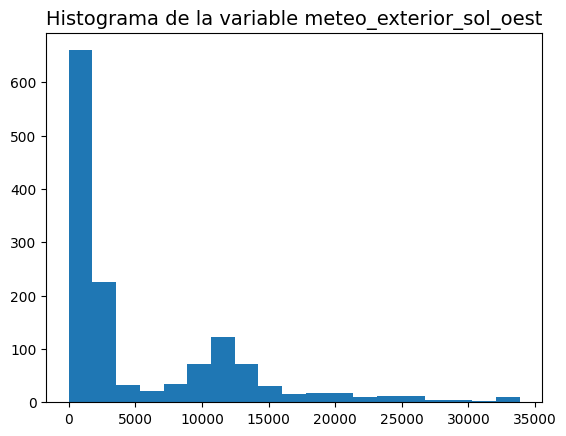



                          Diagrama de cajas                          


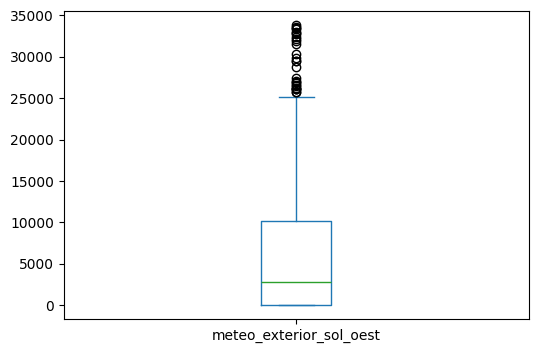

In [58]:
imputacion_con_mediana(data_without_outliers, 'meteo_exterior_sol_oest')

histograma_y_boxplot(data_without_outliers, 'meteo_exterior_sol_oest')

Visualizamos la media y desviación estándar con los nuevos datos:

In [59]:
data_without_outliers['meteo_exterior_sol_oest'].mean()

5148.789392571012

In [60]:
data_without_outliers['meteo_exterior_sol_oest'].std()

6998.779767088173

**Conclusiones**
Observamos que usando el método de imputación con la mediana, hemos reducido considerablemente los outliers que tiene la variable "meteo_exterior_sol_oest". A pesar de ello, la desviación estándar sigue estando elevada.

*   **Outliers de la variable "meteo_exterior_sol_est"**

Datos reales:

                               Histograma                               


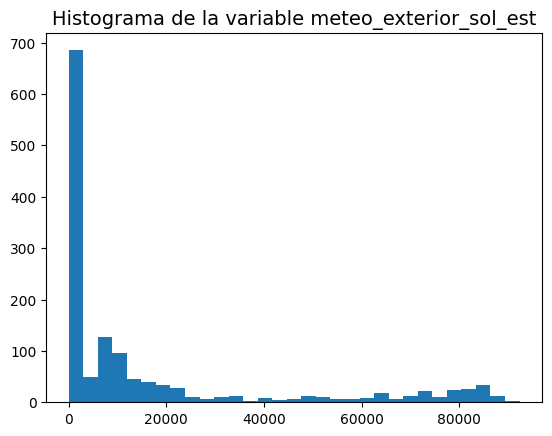



                          Diagrama de cajas                          


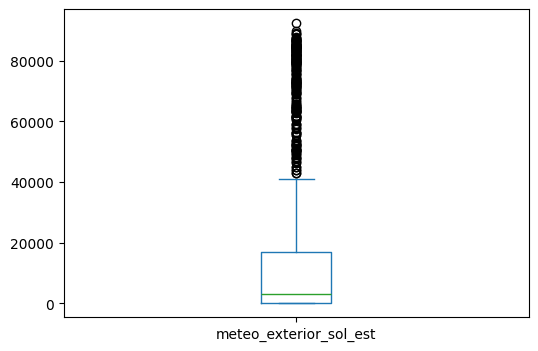

In [61]:
histograma_y_boxplot(data_without_outliers, "meteo_exterior_sol_est")

Realizaremos la imputación con la mediana para la "meteo_exterior_sol_est":

                               Histograma                               


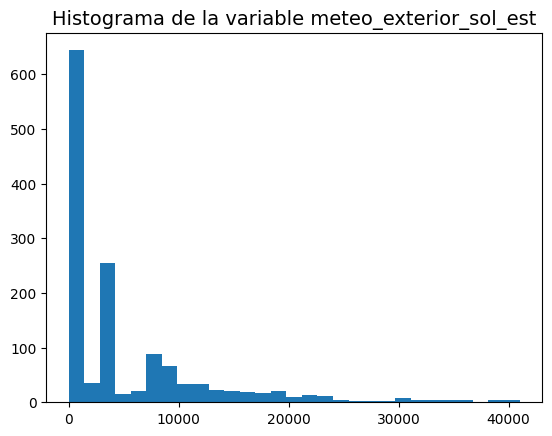



                          Diagrama de cajas                          


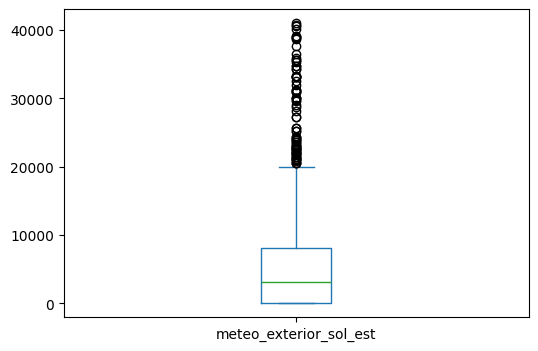

In [62]:
imputacion_con_mediana(data_without_outliers, 'meteo_exterior_sol_est')

histograma_y_boxplot(data_without_outliers, 'meteo_exterior_sol_est')

Visualizamos la media y desviación estándar con los nuevos datos:

In [63]:
data_without_outliers['meteo_exterior_sol_est'].mean()

5160.53537072105

In [64]:
data_without_outliers['meteo_exterior_sol_est'].std()

7751.491294108075

**Conclusiones**
Observamos que usando el método de imputación con la mediana, hemos reducido considerablemente los outliers que tiene la variable "meteo_exterior_sol_est". A pesar de ello, la desviación estándar sigue estando elevada.

*   **Outliers de la variable "meteo_exterior_sol_sud"**

Datos reales:

                               Histograma                               


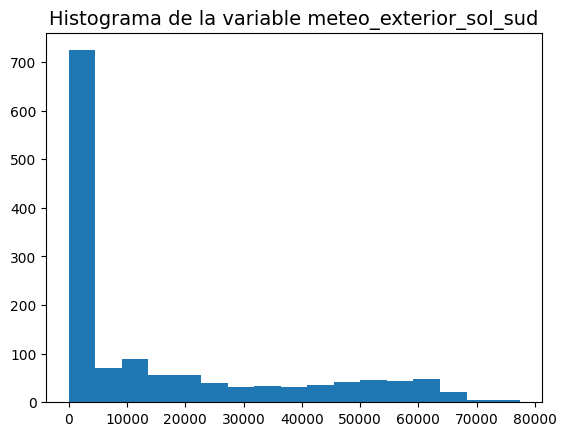



                          Diagrama de cajas                          


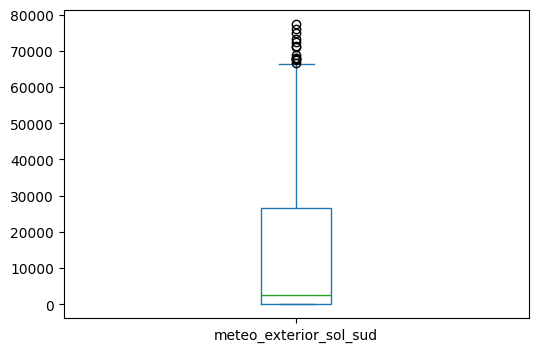

In [65]:
histograma_y_boxplot(data_without_outliers, "meteo_exterior_sol_sud")

Realizaremos la imputación con la mediana para la "meteo_exterior_sol_sud":

                               Histograma                               


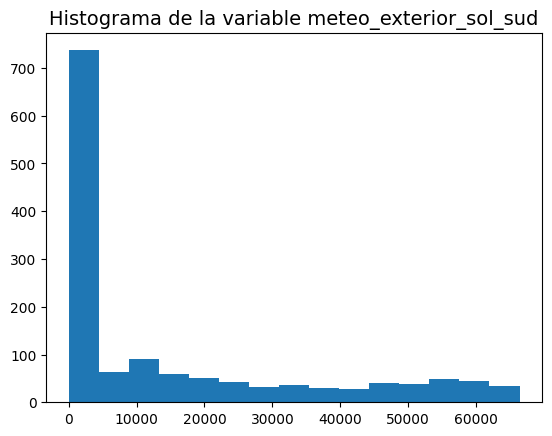



                          Diagrama de cajas                          


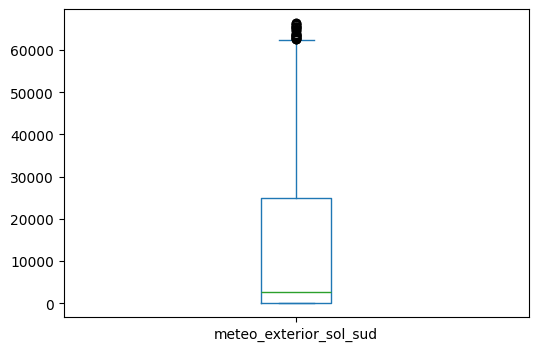

In [66]:
imputacion_con_mediana(data_without_outliers, 'meteo_exterior_sol_sud')

histograma_y_boxplot(data_without_outliers, 'meteo_exterior_sol_sud')

Visualizamos la media y desviación estándar con los nuevos datos:

In [67]:
data_without_outliers['meteo_exterior_sol_sud'].mean()

14800.279101238164

In [68]:
data_without_outliers['meteo_exterior_sol_sud'].std()

20261.342363497166

**Conclusiones**
Observamos que usando el método de imputación con la mediana, hemos reducido considerablemente los outliers que tiene la variable "meteo_exterior_sol_sud". A pesar de ello, la desviación estándar sigue estando elevada.

## Detectando los valores nulos

In [69]:
data_without_outliers.isnull().sum()

,0
date,0
time,0
temperature_comedor_sensor,0
temperature_habitacion_sensor,0
weather_temperature,0
co2_comedor_sensor,0
co2_habitacion_sensor,0
humedad_comedor_sensor,0
humedad_habitacion_sensor,0
lighting_comedor_sensor,0


---
# Transformaciones y Reducciones
---

## Transformaciones

*   Realizaremos una transformación a la variable "day_of_week" de float a int:

In [70]:
data_without_outliers['day_of_week']

,day_of_week
0,3.0
1,3.0
2,3.0
3,3.0
4,3.0
...,...
1368,3.0
1369,3.0
1370,3.0
1371,3.0


Observamos los valores únicos que tiene la variable de 'day_of_week':

In [71]:
data['day_of_week'].unique()

array([3.     , 3.06667, 4.     , 4.06667, 5.     , 5.06667, 6.     ,
       6.06667, 7.     , 6.6    , 1.     , 1.06667, 2.     , 2.06667])

Realizamos la transformación:

In [72]:
data_without_outliers['day_of_week'] = data_without_outliers['day_of_week'].round().astype(int)
data_without_outliers['day_of_week']

,day_of_week
0,3
1,3
2,3
3,3
4,3
...,...
1368,3
1369,3
1370,3
1371,3


Observamos los nuevos valores únicos de la variable 'day_of_week':

In [73]:
data_without_outliers['day_of_week'].unique()

array([3, 4, 5, 6, 7, 1, 2])



*   Realizaremos una transformación a la variable "time" a minutos:



In [74]:
data_without_outliers['time'].unique()

array(['00:00', '00:15', '00:30', '00:45', '01:00', '01:15', '01:30',
       '01:45', '02:00', '02:15', '02:30', '02:45', '03:00', '03:15',
       '03:30', '03:45', '04:00', '04:15', '04:30', '04:45', '05:00',
       '05:15', '05:30', '05:45', '06:00', '06:15', '06:30', '06:45',
       '07:00', '07:15', '07:30', '07:45', '08:00', '08:15', '08:30',
       '08:45', '09:00', '09:15', '09:30', '09:45', '10:00', '10:15',
       '10:30', '10:45', '11:00', '11:15', '11:30', '11:45', '12:00',
       '12:15', '12:30', '12:45', '13:00', '13:15', '13:30', '13:45',
       '14:00', '14:15', '14:30', '14:45', '15:00', '15:15', '15:30',
       '15:45', '16:00', '16:15', '16:30', '16:45', '17:00', '17:15',
       '17:30', '17:45', '18:00', '18:15', '18:30', '18:45', '19:00',
       '19:15', '19:30', '19:45', '20:00', '20:15', '20:30', '20:45',
       '21:00', '21:15', '21:30', '21:45', '22:00', '22:15', '22:30',
       '22:45', '23:00', '23:15', '23:30', '23:45'], dtype=object)

In [75]:
data_without_outliers['hours'] = pd.to_datetime(data_without_outliers['time'], format='%H:%M')

data_without_outliers['minute_of_the_day'] = data_without_outliers['hours'].dt.hour * 60 + data_without_outliers['hours'].dt.minute

data_without_outliers['minute_of_the_day'] = data_without_outliers['minute_of_the_day'].astype(int)

In [76]:
data_without_outliers['minute_of_the_day'].unique()

array([   0,   15,   30,   45,   60,   75,   90,  105,  120,  135,  150,
        165,  180,  195,  210,  225,  240,  255,  270,  285,  300,  315,
        330,  345,  360,  375,  390,  405,  420,  435,  450,  465,  480,
        495,  510,  525,  540,  555,  570,  585,  600,  615,  630,  645,
        660,  675,  690,  705,  720,  735,  750,  765,  780,  795,  810,
        825,  840,  855,  870,  885,  900,  915,  930,  945,  960,  975,
        990, 1005, 1020, 1035, 1050, 1065, 1080, 1095, 1110, 1125, 1140,
       1155, 1170, 1185, 1200, 1215, 1230, 1245, 1260, 1275, 1290, 1305,
       1320, 1335, 1350, 1365, 1380, 1395, 1410, 1425])

## Reducciones

Se procederá a eliminar la variable de "date" ya que es una variable categórica que ya la obtengo con la variable de "day_of_week", y esta último atributo se está considerando más importante para posteriores análisis.
Así mismo, las variables 'precipitacion', 'meteo_exterior_crepusculo', 'meteo_exterior_viento', 'meteo_exterior_sol_oest', 'meteo_exterior_sol_est', 'meteo_exterior_sol_sud', 'meteo_exterior_piranometro', 'exterior_entalpic_1','exterior_entalpic_2' y 'exterior_entalpic_turbo' ya que son mediciones exteriores con muchos valores con 0.

In [77]:
data_without_outliers.drop("date", axis = 1, inplace = True)
data_without_outliers.drop("precipitacion", axis = 1, inplace = True)
data_without_outliers.drop("meteo_exterior_crepusculo", axis = 1, inplace = True)
data_without_outliers.drop("meteo_exterior_viento", axis = 1, inplace = True)
data_without_outliers.drop("meteo_exterior_sol_oest", axis = 1, inplace = True)
data_without_outliers.drop("meteo_exterior_sol_est", axis = 1, inplace = True)
data_without_outliers.drop("meteo_exterior_sol_sud", axis = 1, inplace = True)
data_without_outliers.drop("meteo_exterior_piranometro", axis = 1, inplace = True)
data_without_outliers.drop("exterior_entalpic_1", axis = 1, inplace = True)
data_without_outliers.drop("exterior_entalpic_2", axis = 1, inplace = True)
data_without_outliers.drop("exterior_entalpic_turbo", axis = 1, inplace = True)
data_without_outliers.drop("time", axis = 1, inplace = True)
data_without_outliers.drop("hours", axis = 1, inplace = True)

In [78]:
data_without_outliers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1373 entries, 0 to 1372
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   temperature_comedor_sensor     1373 non-null   float64
 1   temperature_habitacion_sensor  1373 non-null   float64
 2   weather_temperature            1373 non-null   float64
 3   co2_comedor_sensor             1373 non-null   float64
 4   co2_habitacion_sensor          1373 non-null   float64
 5   humedad_comedor_sensor         1373 non-null   float64
 6   humedad_habitacion_sensor      1373 non-null   float64
 7   lighting_comedor_sensor        1373 non-null   float64
 8   lighting_habitacion_sensor     1373 non-null   float64
 9   temperature_exterior_sensor    1373 non-null   float64
 10  humedad_exterior_sensor        1373 non-null   float64
 11  day_of_week                    1373 non-null   int64  
 12  minute_of_the_day              1373 non-null   i

In [79]:
#Listamos las variables numéricas
new_numerical_variables = [
    'temperature_comedor_sensor',
    'temperature_habitacion_sensor',
    'weather_temperature',
    'co2_comedor_sensor',
    'co2_habitacion_sensor',
    'humedad_comedor_sensor',
    'humedad_habitacion_sensor',
    'lighting_comedor_sensor',
    'lighting_habitacion_sensor',
    'temperature_exterior_sensor',
    'humedad_exterior_sensor'
]

Visualicemos las desviaciones estándar de las variables numéricas que tenemos:

In [80]:
data_without_outliers[new_numerical_variables].std(axis=0)

,0
temperature_comedor_sensor,2.552107
temperature_habitacion_sensor,2.534529
weather_temperature,3.739828
co2_comedor_sensor,6.397225
co2_habitacion_sensor,7.689457
humedad_comedor_sensor,5.653677
humedad_habitacion_sensor,6.765015
lighting_comedor_sensor,29.418966
lighting_habitacion_sensor,42.988297
temperature_exterior_sensor,3.910093


Observamos que las variables "lighting_comedor_sensor", "lighting_habitacion_sensor" y "humedad_exterior_sensor" tienen una desviación estándar alta, por ende, sus datos tienen a estar dispersos en rango de sus valores mínimos y máximos.

## Gráfico de dispersión

Visualicemos el gráfico de dispersión (ScatterPlot):

<ipython-input-81-6c7e2633a8d9>:2: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  scatter_matrix(data_without_outliers[new_numerical_variables], alpha=0.5, ax=ax)


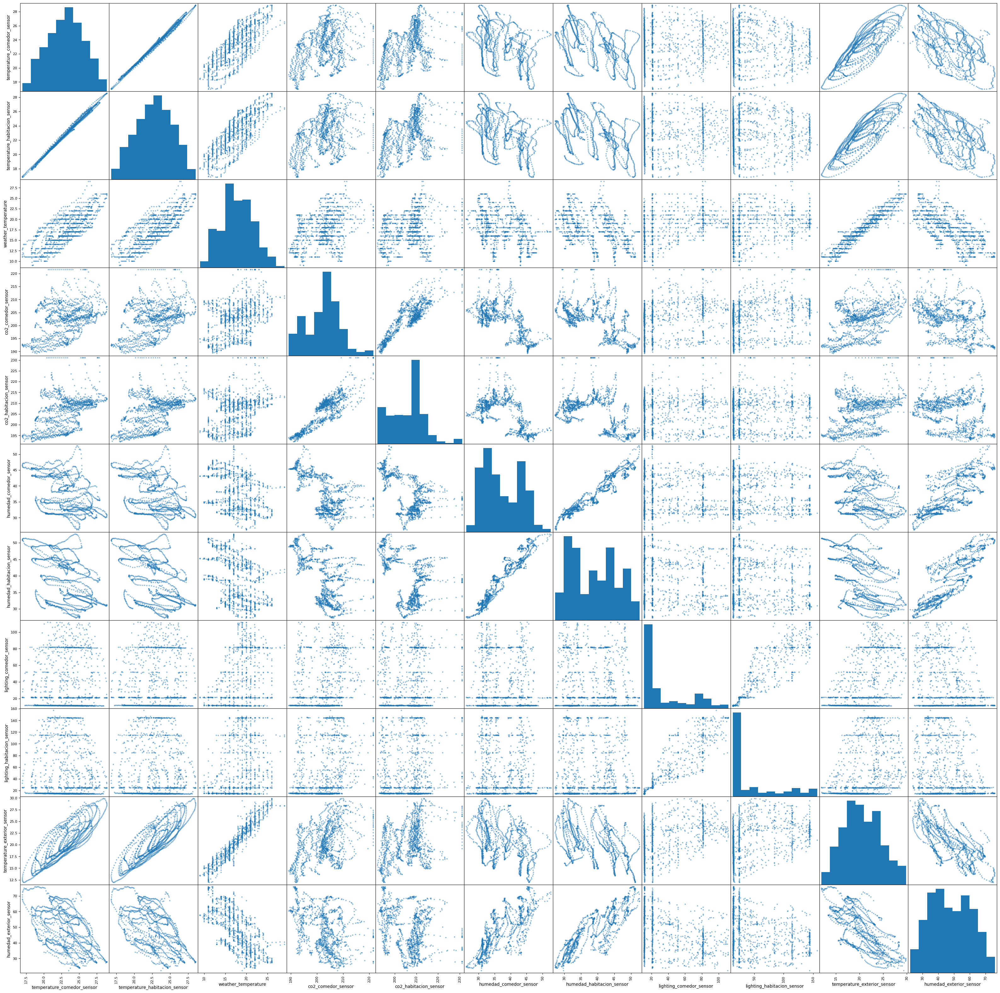

In [81]:
fig, ax = plt.subplots(figsize=(40, 40))
scatter_matrix(data_without_outliers[new_numerical_variables], alpha=0.5, ax=ax)
plt.show()

## Transpose

Sacaremos una copia de nuestra data para realizar las siguientes operaciones y luego comparar:

In [82]:
data_for_transpose = data_without_outliers.copy()

Para poder analizar más a fondo las características del dataset vamos a transponer los datos.

In [83]:
data_transpose = transpose(data_for_transpose)
data_transpose

,0,1,2,3,4,5,6,7,8,9,...,1363,1364,1365,1366,1367,1368,1369,1370,1371,1372
temperature_comedor_sensor,20.20,20.1593,20.0740,19.9773,19.8933,19.8127,19.7220,19.6387,19.5613,19.4680,...,19.1253,19.0160,18.9467,18.8833,18.8400,18.8000,18.7713,18.7860,18.8133,18.8600
temperature_habitacion_sensor,19.80,19.7600,19.6580,19.5833,19.5000,19.4300,19.3713,19.2700,19.2040,19.1133,...,18.6233,18.5073,18.4367,18.3560,18.2900,18.2667,18.2153,18.2000,18.2153,18.2667
weather_temperature,13.00,13.0000,13.0000,13.0000,13.0000,13.0000,13.5333,17.0000,17.0000,17.0000,...,11.0000,11.0000,11.0000,11.0000,11.0000,11.0000,11.7333,12.0000,12.5333,13.0000
co2_comedor_sensor,207.84,207.4990,207.3600,207.4450,207.8400,207.6480,207.7010,208.3090,208.3840,208.5120,...,200.4050,200.8850,200.9280,200.2880,199.7760,199.4240,199.2000,199.4350,200.1070,200.1490
co2_habitacion_sensor,206.56,206.1010,206.8050,206.3250,205.9520,206.3570,207.8930,207.6370,206.6560,206.1760,...,203.2750,203.5090,202.6770,201.7390,202.4430,201.9630,202.0910,201.7390,200.5970,199.5410
humedad_comedor_sensor,31.58,31.6240,31.6507,31.6987,31.7707,31.9120,31.9800,32.0800,32.2693,32.6733,...,42.7787,42.8213,42.7893,42.7387,42.8560,43.0160,43.1920,43.3947,43.3440,43.6667
humedad_habitacion_sensor,30.16,30.0613,30.1773,30.2560,30.3840,30.4173,30.4333,30.6787,30.7760,31.1107,...,45.0000,45.0747,45.0693,44.9920,44.9947,44.9813,44.9413,44.9333,44.7013,44.5653
lighting_comedor_sensor,11.72,11.5240,11.6220,11.7847,11.5887,11.6053,11.6220,11.6867,11.7680,11.5240,...,12.4847,21.0840,21.0207,21.1473,21.0033,21.8500,21.1653,21.2640,28.1647,31.1107
lighting_habitacion_sensor,14.16,14.7600,14.9547,15.0520,15.2147,15.2147,15.1333,15.2467,15.2307,15.2467,...,18.4213,25.1147,24.4467,24.6920,24.8387,24.3493,30.9693,32.1933,38.3507,45.2000
temperature_exterior_sensor,16.07,16.0400,16.0160,15.9427,15.8627,15.6847,15.5567,15.5060,15.5200,15.7093,...,13.6847,13.6440,13.7027,13.8740,14.1980,14.4833,14.7540,15.2020,15.7260,16.2693


Observamos que ahora tenemos 13 filas y 1373 columnas. Ahora las características originales serán ahora los nuevos "elementos" y los elementos originales las nuevas "características".

Observamos los índices que ahora tenemos:

In [84]:
index_names = data_transpose.index
index_names

Index(['temperature_comedor_sensor', 'temperature_habitacion_sensor',
       'weather_temperature', 'co2_comedor_sensor', 'co2_habitacion_sensor',
       'humedad_comedor_sensor', 'humedad_habitacion_sensor',
       'lighting_comedor_sensor', 'lighting_habitacion_sensor',
       'temperature_exterior_sensor', 'humedad_exterior_sensor', 'day_of_week',
       'minute_of_the_day'],
      dtype='object')

## Correlación de variables

Usaremos el coeficiente de Pearson para el análisis. Con el siguiente mapa podremos identificar las variables redundantes:

<Axes: >

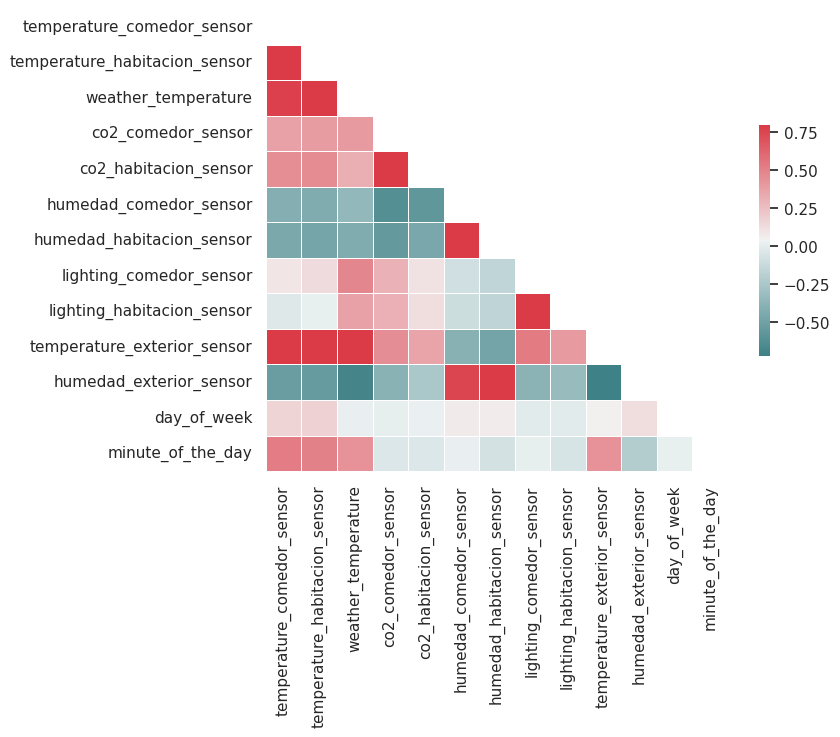

In [85]:
# Obtenido del material práctico, Curso de Machine Learning, "6 - Selección de características"

# https://docs.scipy.org/doc/numpy/reference/generated/numpy.corrcoef.html
# Devuelve los coeficientes de correlación momento-producto de Pearson
R = corrcoef(data_transpose)

# http://stanford.edu/~mwaskom/software/seaborn/examples/many_pairwise_correlations.html
# Genera una máscara para el triángulo superior.
sns.set(style="white")
mask = np.zeros_like(R, dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Configurar la figura matplotlib
f, ax = plt.subplots(figsize=(8, 6))

# Generar un mapa de colores divergente personalizado
cmap = sns.diverging_palette(200, 10, as_cmap=True)

# Dibuja el mapa de calor con la máscara y la relación de aspecto correcta.
sns.heatmap(R, mask=mask, cmap=cmap, vmax=.8,
            square=True, xticklabels=index_names, yticklabels=index_names,
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)

**Analizamos las destacables correlaciones:**
*   Las variables 'temperature_comedor_sensor' y 'temperature_habitacion_sensor' poseen una alta correlación positiva.
*   Las variables 'temperature_comedor_sensor', 'temperature_habitacion_sensor' y 'weather_temperature' poseen una alta correlación positiva.
*   Las variables 'co2_comedor_sensor' y 'co2_habitacion_sensor' poseen una alta correlación positiva.
*   La variable 'humedad_comedor_sensor' posee correlación negativa con respecto a las variables 'temperature_comedor_sensor' y 'temperature_habitacion_sensor', 'weather_temperature', 'co2_comedor_sensor' y 'co2_habitacion_sensor'.
*    La variable 'humedad_habitacion_sensor' posee correlación negativa con respecto a las variables 'temperature_comedor_sensor' y 'temperature_habitacion_sensor', 'weather_temperature', 'co2_comedor_sensor' y 'co2_habitacion_sensor'.
*   Las variables 'humedad_comedor_sensor' y 'humedad_habitacion_sensor' poseen una alta correlación positiva.
*   La variable 'temperature_exterior_sensor' posee una alta correlación positiva con respecto a las variables 'temperature_comedor_sensor', 'temperature_habitacion_sensor' y 'weather_temperature'.
*   La variable 'temperature_exterior_sensor' posee correlación negativa con 'humedad_comedor_sensor' y 'humedad_habitacion_sensor'.
*   La variable 'humedad_exterior_sensor' posee una alta correlación negativa con respecto a las variables 'temperature_comedor_sensor', 'temperature_habitacion_sensor', 'weather_temperature' y 'temperature_exterior_sensor'.
*   La variable 'humedad_exterior_sensor' posee una alta correlación positiva con las variables 'humedad_comedor_sensor' y 'humedad_habitacion_sensor'.



## PCA

Normalizamos los datos usando con Robust Scaler. Esta normalización elimina la mediana y escala los datos según el rango intercuartil:

In [86]:
#http://scikit-learn.org/stable/modules/preprocessing.html

robust_scaler = preprocessing.MaxAbsScaler()
features_norm = robust_scaler.fit_transform(data_transpose)

Componentes lineales:
 [[ 0.01206702  0.01379133  0.0155567  ...  0.02924826  0.02894463
   0.02867929]
 [ 0.07136868  0.06903037  0.06687303 ...  0.00203861  0.00055847
  -0.00080719]]

Ratio de variabilidad:  [0.8196432  0.17393902] 



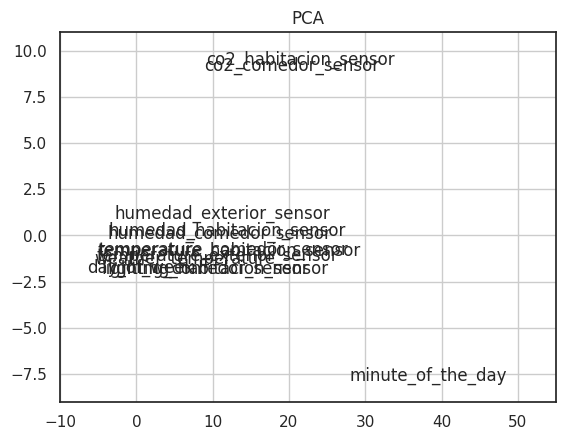

In [87]:
# Obtenido del material práctico, Curso de Machine Learning, "6 - Selección de características"
estimator = PCA(n_components=2)
data_pca = estimator.fit_transform(features_norm)
print("Componentes lineales:\n", estimator.components_)
print("\nRatio de variabilidad: ", estimator.explained_variance_ratio_, "\n")

fig, ax = plt.subplots()
for i in range(len(data_pca)):
    plt.text(data_pca[i][0], data_pca[i][1], index_names[i])

plt.xlim(-10, 55)
plt.ylim(-9, 11)
ax.grid(True)
plt.title("PCA")
plt.show()

El ratio de variabilidad del eje X explica el 81.96% de variabilidad del conjunto de datos y 17.39% es explicada por el segundo componente.
Por otro lado, 'minute_of_the_day', 'co2_comedor_sensor' y 'co2_habitacion_sensor' se muestra separados de los otros grupos.

## Clustering jerárquico para la selección de características

Utilizaremos el clustering jerárquico para observar las relaciones de similitud entre el desarrollo de las variables:

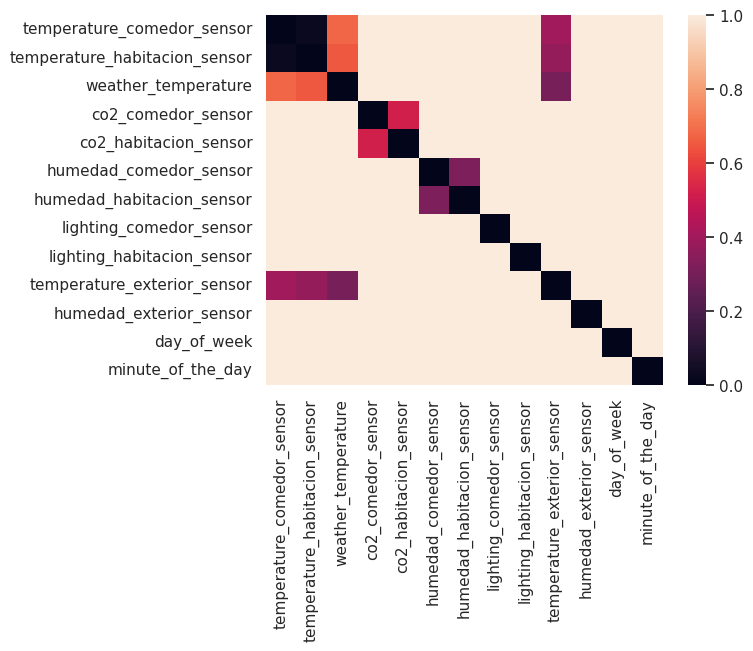

In [88]:
# Obtenido del material práctico, Curso de Machine Learning, "6 - Selección de características"

# Generamos la matriz de similaridad
# http://docs.scipy.org/doc/scipy/reference/cluster.html

dist = sklearn.metrics.DistanceMetric.get_metric('euclidean')
matdist= dist.pairwise(features_norm)

# Visualización
sns.set()
ax = sns.heatmap(matdist,vmin=0, vmax=1, yticklabels = index_names, xticklabels = index_names)

Al analizar la matriz de distancia observamos que las variables no cuentan con mucha similitud, a excepción de 'temperature_comedor_sensor' y 'temperature_habitacion_sensor'.

### Dendograma

<ipython-input-89-42816a70f2b8>:4: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  clusters = cluster.hierarchy.linkage(matdist, method = 'average')


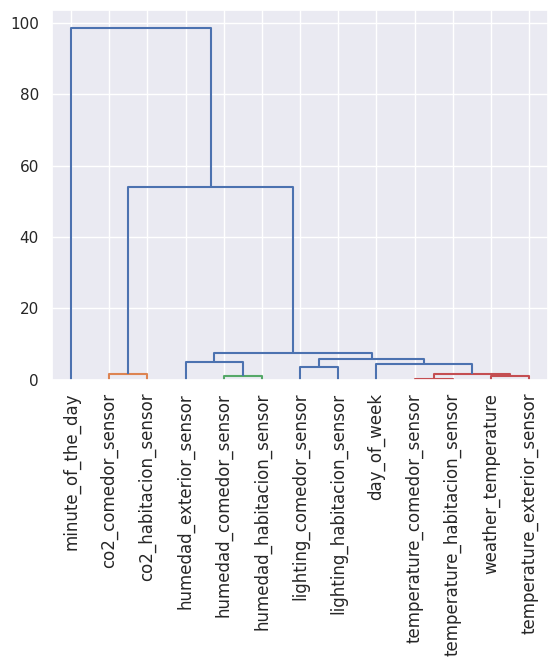

In [89]:
# Obtenido del material práctico, Curso de Machine Learning, "6 - Selección de características"
# Construimos el Dendograma
# http://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.linkage.html#scipy.cluster.hierarchy.linkage
clusters = cluster.hierarchy.linkage(matdist, method = 'average')

# http://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.cluster.hierarchy.dendrogram.html
cluster.hierarchy.dendrogram(
    clusters,
    color_threshold = 3,
    labels = index_names ,
    leaf_rotation=90
  )
plt.show()

Hacemos el corte en 20:

In [90]:
# Obtenido del material práctico, Curso de Machine Learning, "6 - Selección de características"
cut = 20
labels = cluster.hierarchy.fcluster(clusters, cut , criterion = 'distance')

labels

array([2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 3], dtype=int32)

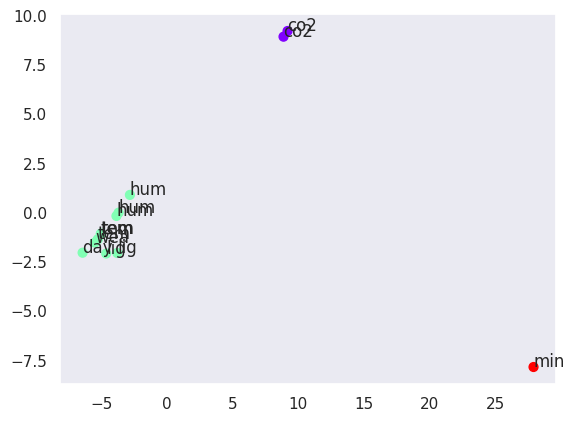

In [91]:
# Obtenido del material práctico, Curso de Machine Learning, "6 - Selección de características"

plt.scatter(data_pca[:,0], data_pca[:,1], c=labels,s=40, cmap="rainbow")
for i in range(len(data_pca)):
    plt.text(data_pca[i][0], data_pca[i][1], index_names[i][0:3])

plt.grid()
plt.show()

*   La variable 'minute_of_the_day' se representa en un clúster y se aleja mucho del clúster que contiene al resto de variables, se procederá a eliminar.
*   Se conservarán las variables 'co2_comedor_sensor' y 'co2_habitacion_sensor' para un posterior análisis.



In [92]:
data_without_outliers.drop("minute_of_the_day", axis = 1, inplace = True)

## Multicolinealidad

Se usará el Factor de Inflación de la Varianza(VIF) que permite cuantificar la intensidad de la multicolinealidad. El valor del VIF es siempre positivo y crece en un conjunto de datos a medida que aumenta la multicolinealidad.

In [93]:
# Obtenido de https://profesordata.com/2020/08/22/metodos-de-seleccion-de-variables-el-factor-de-inflacion-de-la-varianza/

def calculateVIF(var_predictoras_df):
    var_pred_labels = list(var_predictoras_df.columns)
    num_var_pred = len(var_pred_labels)

    lr_model = LinearRegression()

    result = pd.DataFrame(index = ['VIF'], columns = var_pred_labels)
    result = result.fillna(0)

    for ite in range(num_var_pred):
        x_features = var_pred_labels[:]
        y_feature = var_pred_labels[ite]
        x_features.remove(y_feature)

        x = var_predictoras_df[x_features]
        y = var_predictoras_df[y_feature]

        lr_model.fit(var_predictoras_df[x_features], var_predictoras_df[y_feature])

        result[y_feature] = 1/(1 - lr_model.score(var_predictoras_df[x_features], var_predictoras_df[y_feature]))

    return result

In [94]:
# Copia de los datos
train_multicolinealidad = data_without_outliers.copy()

Calculamos el VIF de todas las variables

In [95]:
# Obtenido de https://profesordata.com/blog/
calculateVIF(train_multicolinealidad.copy(deep = True)).T

<ipython-input-93-d635109b453b>:10: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  result = result.fillna(0)


,VIF
temperature_comedor_sensor,339.066365
temperature_habitacion_sensor,382.682034
weather_temperature,12.048927
co2_comedor_sensor,9.963833
co2_habitacion_sensor,9.189164
humedad_comedor_sensor,22.824718
humedad_habitacion_sensor,30.626947
lighting_comedor_sensor,11.634772
lighting_habitacion_sensor,9.404100
temperature_exterior_sensor,38.421721


**Criterio: Valor de VIF	Grado de Muticolinealidad**
*   Hasta 10	=> **Débil/Moderado**
*   De 10 a 30	=> **Elevado**
*   Mayor a 30 => **Muy elevado**

**Resultados:**
*   Dentro del conjunto las variables, los más resaltantes son "temperature_comedor_sensor" y "temperature_habitacion_sensor" ya que poseen un VIF muy elevado. Lo cual, probaremos eliminando una de las variables y observando el nuevo VIF generado.

In [96]:
# Copia de los datos
train_multicolinealidad_2 = data_without_outliers.copy()

Eliminamos la variable "temperature_habitacion_sensor" y observamos el VIF:

In [97]:
train_multicolinealidad_2.drop("temperature_habitacion_sensor", axis = 1, inplace = True)

In [98]:
# Obtenido de https://profesordata.com/blog/
calculateVIF(train_multicolinealidad_2.copy(deep = True)).T

<ipython-input-93-d635109b453b>:10: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  result = result.fillna(0)


,VIF
temperature_comedor_sensor,12.230415
weather_temperature,12.027391
co2_comedor_sensor,9.890544
co2_habitacion_sensor,9.187917
humedad_comedor_sensor,22.237847
humedad_habitacion_sensor,30.519836
lighting_comedor_sensor,11.541603
lighting_habitacion_sensor,9.400685
temperature_exterior_sensor,34.679505
humedad_exterior_sensor,14.335584


Ahora, probaremos eliminado la variable "temperature_comedor_sensor" y observamos el nuevo VIF

In [99]:
# Copia de los datos
train_multicolinealidad_3 = data_without_outliers.copy()

In [100]:
train_multicolinealidad_3.drop("temperature_comedor_sensor", axis = 1, inplace = True)

In [101]:
# Obtenido de https://profesordata.com/blog/
calculateVIF(train_multicolinealidad_3.copy(deep = True)).T

<ipython-input-93-d635109b453b>:10: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  result = result.fillna(0)


,VIF
temperature_habitacion_sensor,13.803669
weather_temperature,12.036601
co2_comedor_sensor,9.962232
co2_habitacion_sensor,9.135615
humedad_comedor_sensor,22.194017
humedad_habitacion_sensor,30.626923
lighting_comedor_sensor,11.456175
lighting_habitacion_sensor,9.379295
temperature_exterior_sensor,37.251642
humedad_exterior_sensor,14.878469


**Resultados:**
 *   Observamos que cuando eliminamos la variable "temperature_comedor_sensor" el VIF de la variable "temperature_exterior_sensor" aumenta. Y cuando eliminamos la variable "temperature_habitacion_sensor", la variable "temperature_exterior_sensor" disminuye. Por ende, para tener un VIF bajo, quitaremos la variable "temperature_habitacion_sensor".

## Selección de variables

Luego de haber aplicado diferentes métodos para evaluar las características de los datos. Las variables que obtendremos serán las siguientes:

In [102]:
# Copia de los datos
train_selected = train_multicolinealidad_2
train_selected.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1373 entries, 0 to 1372
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   temperature_comedor_sensor   1373 non-null   float64
 1   weather_temperature          1373 non-null   float64
 2   co2_comedor_sensor           1373 non-null   float64
 3   co2_habitacion_sensor        1373 non-null   float64
 4   humedad_comedor_sensor       1373 non-null   float64
 5   humedad_habitacion_sensor    1373 non-null   float64
 6   lighting_comedor_sensor      1373 non-null   float64
 7   lighting_habitacion_sensor   1373 non-null   float64
 8   temperature_exterior_sensor  1373 non-null   float64
 9   humedad_exterior_sensor      1373 non-null   float64
 10  day_of_week                  1373 non-null   int64  
dtypes: float64(10), int64(1)
memory usage: 118.1 KB


## Normalización

Realizaremos diferentes normalizaciones ya que más adelante contrastaremos el mejor resultado:

*   Normalización con MinMaxScaler



In [103]:
scaler = MinMaxScaler()
train_normalization_minmax = scaler.fit_transform(train_selected)
train_normalization_minmax

array([[0.26938957, 0.2       , 0.57688738, ..., 0.23061871, 0.31379651,
        0.33333333],
       [0.26598106, 0.2       , 0.56633663, ..., 0.22894622, 0.31170867,
        0.33333333],
       [0.25883742, 0.2       , 0.56203589, ..., 0.22760824, 0.31131161,
        0.33333333],
       ...,
       [0.15097105, 0.15      , 0.31683168, ..., 0.18222819, 0.66082507,
        0.33333333],
       [0.15325735, 0.176665  , 0.33762376, ..., 0.2114409 , 0.64526508,
        0.33333333],
       [0.15716834, 0.2       , 0.33892327, ..., 0.24172957, 0.62717172,
        0.33333333]])

*   Normalización con StandardScaler

In [104]:
scaler = StandardScaler()
train_normalization_stand = scaler.fit_transform(train_selected)
train_normalization_stand

array([[-1.13598815, -1.20341011,  0.841503  , ..., -1.14843139,
        -0.67830656, -0.49339047],
       [-1.15194157, -1.20341011,  0.78817922, ..., -1.15610664,
        -0.68706382, -0.49339047],
       [-1.18537711, -1.20341011,  0.76644313, ..., -1.16224683,
        -0.68872926, -0.49339047],
       ...,
       [-1.690242  , -1.4708995 , -0.47282662, ..., -1.37050189,
         0.77727553, -0.49339047],
       [-1.67954106, -1.32824741, -0.3677428 , ..., -1.23644089,
         0.71201047, -0.49339047],
       [-1.66123579, -1.20341011, -0.36117506, ..., -1.09744216,
         0.63611941, -0.49339047]])

*   Normalización con MaxAbsScaler

In [105]:
scaler = MaxAbsScaler()
train_normalization_maxabs = scaler.fit_transform(train_selected)
train_normalization_maxabs

array([[0.69838197, 0.44827586, 0.93826603, ..., 0.53798538, 0.51495111,
        0.42857143],
       [0.69697483, 0.44827586, 0.93672663, ..., 0.53698106, 0.5134753 ,
        0.42857143],
       [0.69402572, 0.44827586, 0.93609914, ..., 0.53617759, 0.51319463,
        0.42857143],
       ...,
       [0.64949523, 0.4137931 , 0.90032278, ..., 0.50892681, 0.76025126,
        0.42857143],
       [0.65043908, 0.43218276, 0.90335643, ..., 0.52646908, 0.74925254,
        0.42857143],
       [0.65205366, 0.44827586, 0.90354604, ..., 0.54465747, 0.7364631 ,
        0.42857143]])

---
# Minería de Datos
---

## Clustering Jerárquico Aglomerativo

### Primera Iteración: Clustering Jerárquico Aglomerativo con 11 dimensiones

#### Clustering con la Data Normalizada MinMaxScaler

Tiempo de ejecución:  0.060753583908081055


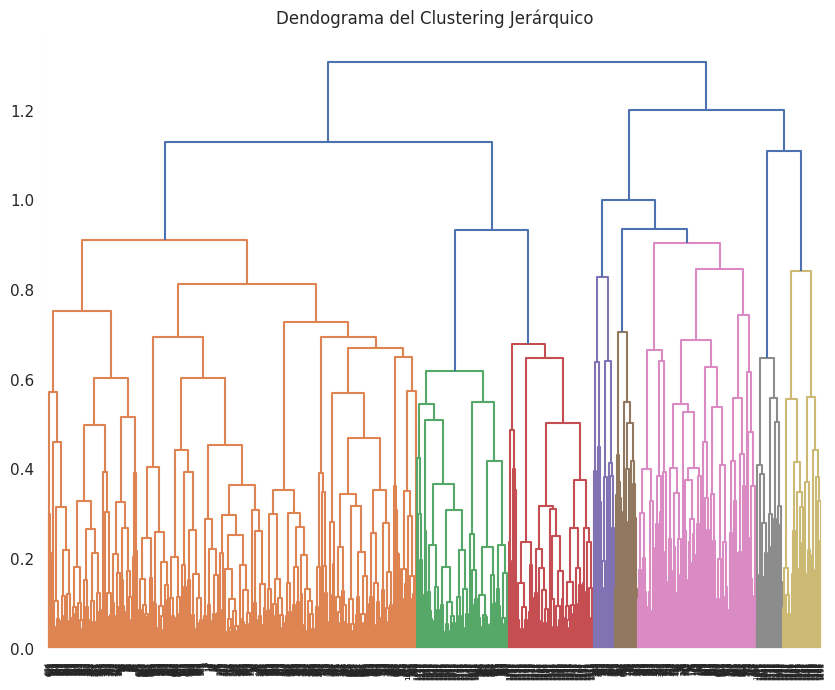

In [106]:
plt.figure(figsize=(10, 8))
plt.title("Dendograma del Clustering Jerárquico")

start_time = time.time()

#Utilizamos la función 'average' ya que tiene la ventaja de manejar datos tanto categóricos como numéricos
clustering_jerarquico_minmax = linkage(train_normalization_minmax, metric="euclidean", method='average')
print("Tiempo de ejecución: ", time.time() - start_time)

dendograma = dendrogram(clustering_jerarquico_minmax)

In [107]:
# Vamos a medir la bondad de este clustering. Para ello, vamos a hacer uso del
# Cophenetic Correlation Coefficient (https://en.wikipedia.org/wiki/Cophenetic_correlation),
# disponible en la función cophenet() de scipy.cluster.hierarchy.

# Esta función compara (correla) las distancias reales entre todas las muestras de nuestro
# dataset con aquellas que implica el clustering obtenido. Cuanto más cerca este el valor de 1,
# mejor preserva el clustering las distancias originales, por lo que mejor es el clustering.

# pdist calcula las distancias entre elementos de nuestro dataset usando la
# métrica indicada (euclideana por defecto)
c, coph_dists = cophenet(clustering_jerarquico_minmax, pdist(train_normalization_minmax))
c

0.6853779543258943

Obtuvimos un valor de coeficiente aceptable para las variables seleccionadas anteriormente.

In [108]:
start_time = time.time()

agglomerative_clustering_minmax = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='average')
new_clusters = agglomerative_clustering_minmax.fit_predict(train_normalization_minmax)
print("Tiempo de ejecución: ", time.time() - start_time)

print(new_clusters)

Tiempo de ejecución:  0.042078256607055664
[3 3 3 ... 1 1 1]


In [109]:
score = silhouette_score(train_normalization_minmax, new_clusters)
print("Silhouette Score: ", score)

Silhouette Score:  0.2568031149120388


In [110]:
silhouette_vals = silhouette_samples(train_normalization_minmax, new_clusters)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  106


In [111]:
def encontrar_outliers_lof(X, labels):
  outliers = []

  #Aplicar LOF en cada clúster
  for cluster in np.unique(labels):
    #Seleccionar los datos pertenecientes al clúster actual
    cluster_data = X[labels == cluster]

    #Aplicar LOF dentro de este clúster
    lof = LocalOutlierFactor(n_neighbors=20)
    cluster_outliers = lof.fit_predict(cluster_data)

    #Los outliers estarán etiquetados con -1, obtener sus índices
    cluster_outliers_indices = np.where(cluster_outliers == -1)[0]

    #Convertir a índices globales
    global_outliers_indices = np.where(labels == cluster)[0][cluster_outliers_indices]

    #Agregar a la lista de outliers
    outliers.extend(global_outliers_indices)

  outliers = np.array(outliers)
  print("Número de outliers identificados: ", len(outliers))

  return outliers

In [112]:
lof_outliers = encontrar_outliers_lof(train_normalization_minmax, new_clusters)

Número de outliers identificados:  29


In [113]:
def pca_para_visualizacion(X, labels, outliers_points, title):
  pca = PCA(n_components=2)
  X_pca = pca.fit_transform(X)

  # Visualizar los clústeres
  plt.figure(figsize=(10, 7))
  colors = plt.cm.viridis(np.linspace(0, 1, len(np.unique(labels))))
  for i, color in zip(np.unique(labels), colors):
      plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)

  plt.scatter(X_pca[outliers_points, 0], X_pca[outliers_points, 1],
              c='red', marker='x', label='Outliers')

  plt.legend()
  plt.xlabel('Componente principal 1')
  plt.ylabel('Componente principal 2')
  plt.title(title)
  plt.show()

In [114]:
def pca_para_visualizacion_sin_leyenda(X, labels, outliers_points, title):
  pca = PCA(n_components=2)
  X_pca = pca.fit_transform(X)

  # Visualizar los clústeres
  plt.figure(figsize=(10, 7))
  colors = plt.cm.viridis(np.linspace(0, 1, len(np.unique(labels))))
  for i, color in zip(np.unique(labels), colors):
      plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, edgecolor='k', s=50)

  plt.scatter(X_pca[outliers_points, 0], X_pca[outliers_points, 1],
              c='red', marker='x', label='Outliers')

  plt.legend()
  plt.xlabel('Componente principal 1')
  plt.ylabel('Componente principal 2')
  plt.title(title)
  plt.show()

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


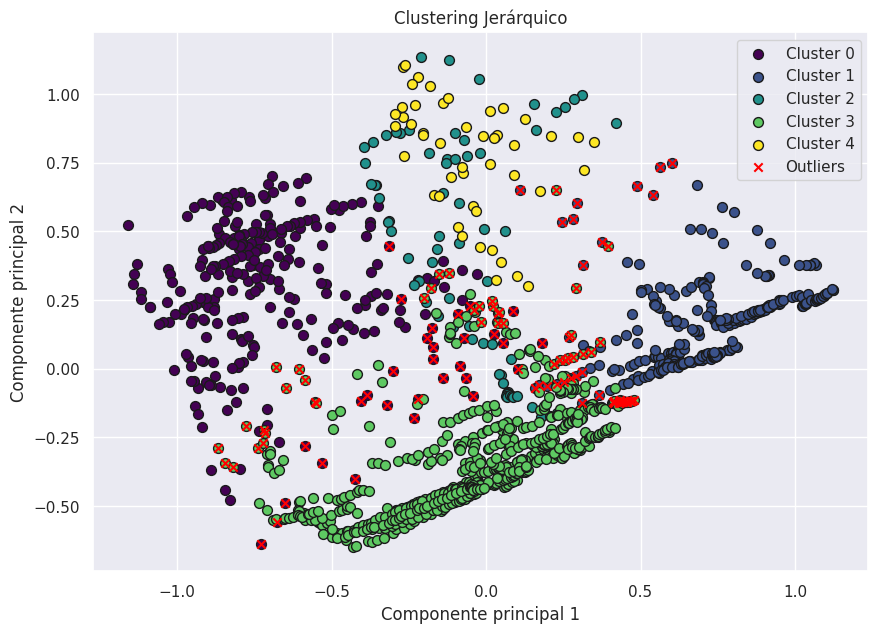

In [115]:
title = "Clustering Jerárquico"
pca_para_visualizacion(train_normalization_minmax, new_clusters, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


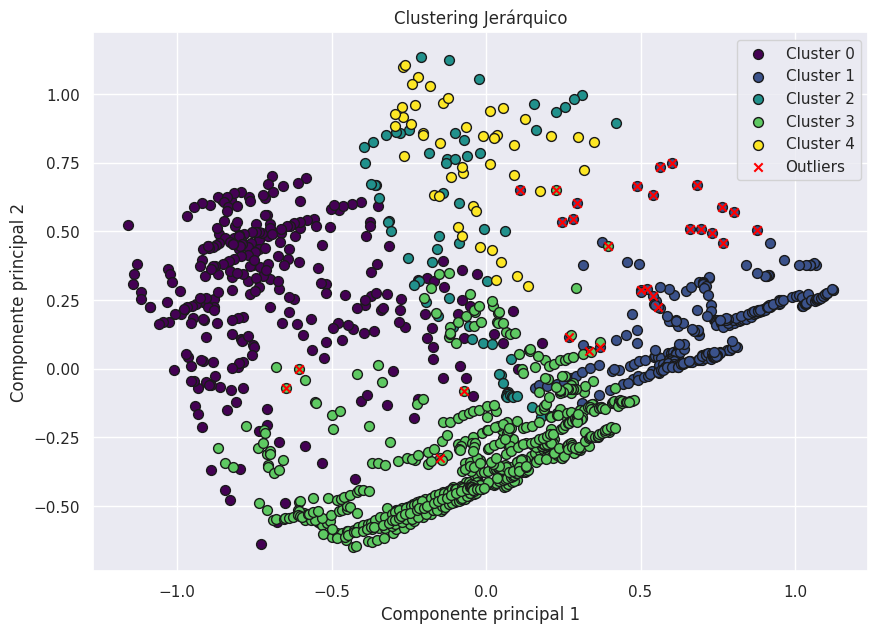

In [116]:
title = "Clustering Jerárquico"
pca_para_visualizacion(train_normalization_minmax, new_clusters, lof_outliers, title)

#### Clustering con la Data Normalizada StandardScaler

Tiempo de ejecución:  0.03459525108337402


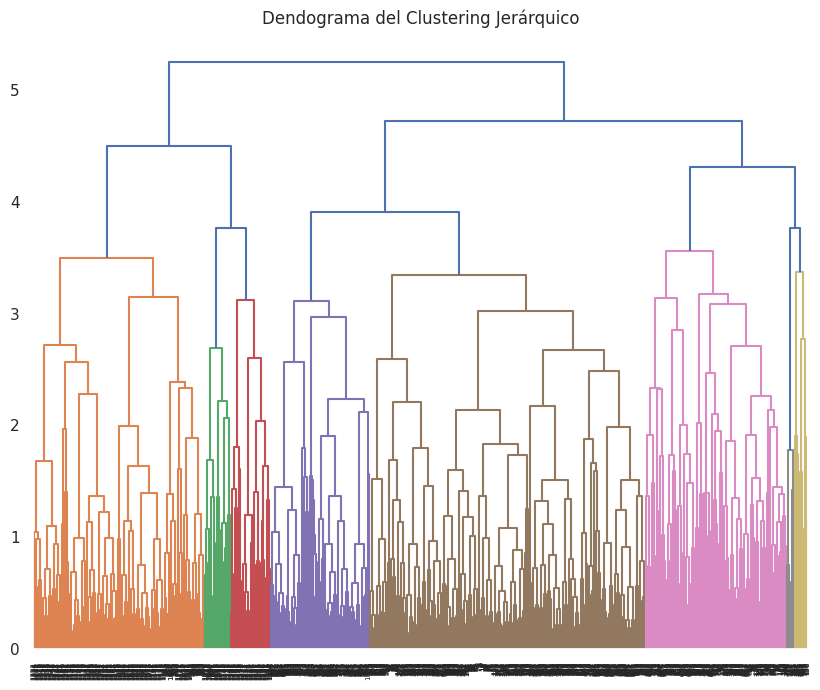

In [117]:
plt.figure(figsize=(10, 8))
plt.title("Dendograma del Clustering Jerárquico")

start_time = time.time()

#Utilizamos la función 'average' ya que tiene la ventaja de manejar datos tanto categóricos como numéricos
clustering_jerarquico_stand = linkage(train_normalization_stand, metric="euclidean", method='average')
print("Tiempo de ejecución: ", time.time() - start_time)

dendograma = dendrogram(clustering_jerarquico_stand)

In [118]:
# Vamos a medir la bondad de este clustering. Para ello, vamos a hacer uso del
# Cophenetic Correlation Coefficient (https://en.wikipedia.org/wiki/Cophenetic_correlation),
# disponible en la función cophenet() de scipy.cluster.hierarchy.

# Esta función compara (correla) las distancias reales entre todas las muestras de nuestro
# dataset con aquellas que implica el clustering obtenido. Cuanto más cerca este el valor de 1,
# mejor preserva el clustering las distancias originales, por lo que mejor es el clusering.

# pdist calcula las distancias entre elementos de nuestro dataset usando la
# métrica indicada (euclideana por defecto)
c, coph_dists = cophenet(clustering_jerarquico_stand, pdist(train_normalization_stand))
c

0.6534473993633048

In [119]:
start_time = time.time()

agglomerative_clustering_stand = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='average')
new_clusters = agglomerative_clustering_stand.fit_predict(train_normalization_stand)
print("Tiempo de ejecución: ", time.time() - start_time)

print(new_clusters)

Tiempo de ejecución:  0.06136631965637207
[0 0 0 ... 3 3 3]


In [120]:
score = silhouette_score(train_normalization_stand, new_clusters)
print("Silhouette Score: ", score)

Silhouette Score:  0.25183774657674124


In [121]:
silhouette_vals = silhouette_samples(train_normalization_stand, new_clusters)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  116


In [122]:
lof_outliers = encontrar_outliers_lof(train_normalization_stand, new_clusters)

Número de outliers identificados:  30


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


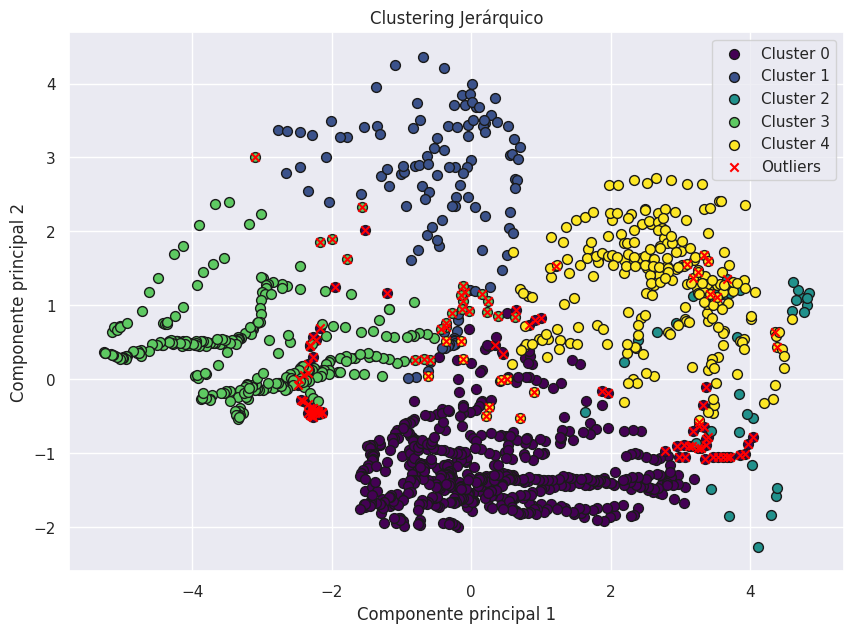

In [123]:
title = "Clustering Jerárquico"
pca_para_visualizacion(train_normalization_stand, new_clusters, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


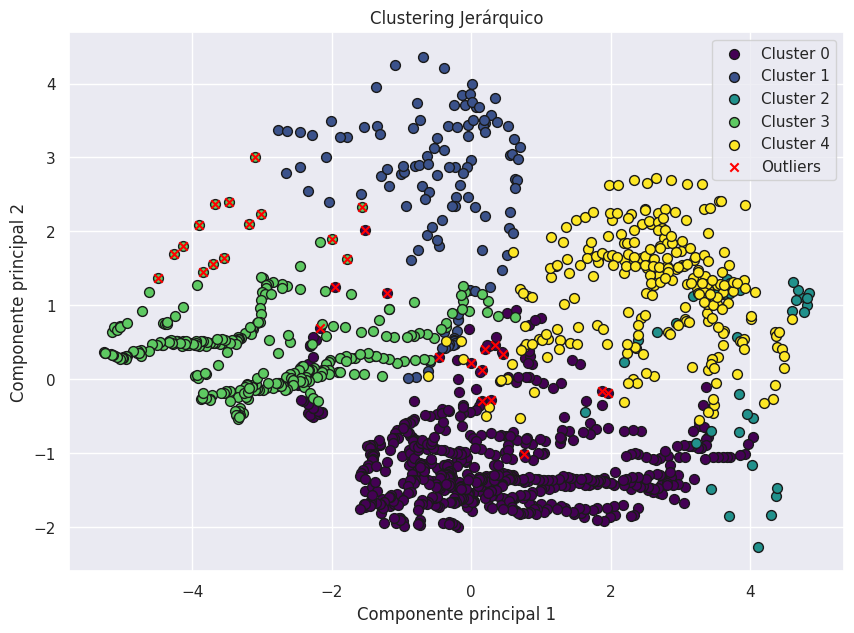

In [124]:
title = "Clustering Jerárquico"
pca_para_visualizacion(train_normalization_stand, new_clusters, lof_outliers, title)

#### Clustering con la Data Normalizada MaxAbsScaler

Tiempo de ejecución:  0.03846430778503418


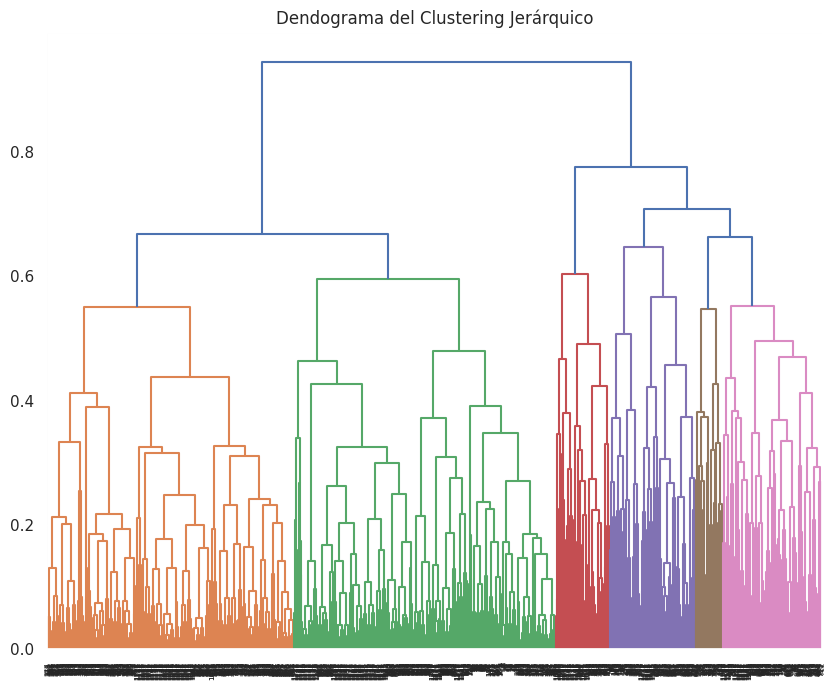

In [125]:
plt.figure(figsize=(10, 8))
plt.title("Dendograma del Clustering Jerárquico")

start_time = time.time()

#Utilizamos la función 'average' ya que tiene la ventaja de manejar datos tanto categóricos como numéricos
clustering_jerarquico_maxabs = linkage(train_normalization_maxabs, metric="euclidean", method='average')
print("Tiempo de ejecución: ", time.time() - start_time)

dendograma = dendrogram(clustering_jerarquico_maxabs)

In [126]:
# Vamos a medir la bondad de este clustering. Para ello, vamos a hacer uso del
# Cophenetic Correlation Coefficient (https://en.wikipedia.org/wiki/Cophenetic_correlation),
# disponible en la función cophenet() de scipy.cluster.hierarchy.

# Esta función compara (correla) las distancias reales entre todas las muestras de nuestro
# dataset con aquellas que implica el clustering obtenido. Cuanto más cerca este el valor de 1,
# mejor preserva el clustering las distancias originales, por lo que mejor es el clusering.

# pdist calcula las distancias entre elementos de nuestro dataset usando la
# métrica indicada (euclideana por defecto)
c, coph_dists = cophenet(clustering_jerarquico_maxabs, pdist(train_normalization_maxabs))
c

0.7008455633955618

Obtuvimos un valor de coeficiente aceptable para las variables seleccionadas anteriormente.

In [127]:
start_time = time.time()

agglomerative_clustering_maxabs = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='average')
new_clusters = agglomerative_clustering_maxabs.fit_predict(train_normalization_maxabs)
print("Tiempo de ejecución: ", time.time() - start_time)

print(new_clusters)

Tiempo de ejecución:  0.03903388977050781
[1 1 1 ... 1 1 1]


In [128]:
score = silhouette_score(train_normalization_maxabs, new_clusters)
print("Silhouette Score: ", score)

Silhouette Score:  0.3533923758605704


In [129]:
silhouette_vals = silhouette_samples(train_normalization_maxabs, new_clusters)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  83


In [130]:
lof_outliers = encontrar_outliers_lof(train_normalization_maxabs, new_clusters)

Número de outliers identificados:  53


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


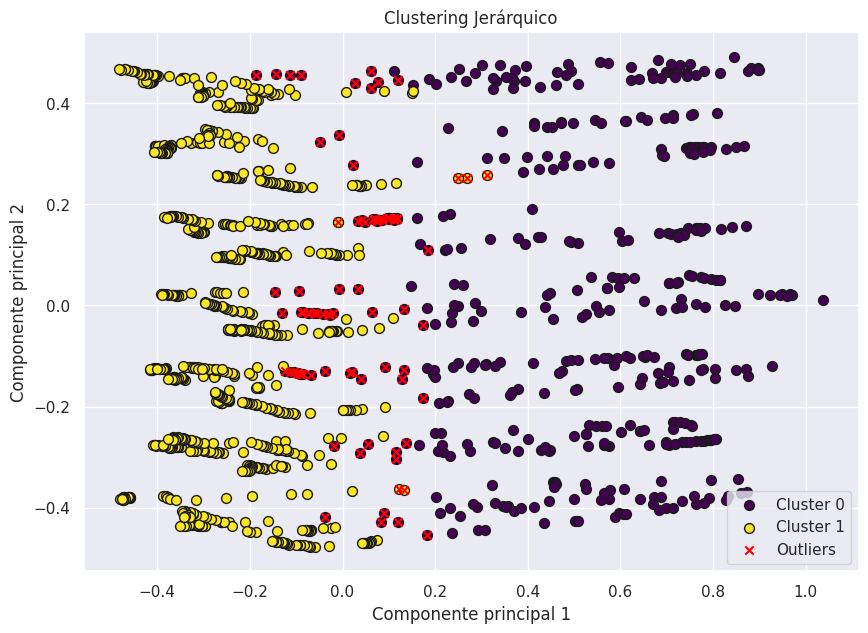

In [131]:
title = "Clustering Jerárquico"
pca_para_visualizacion(train_normalization_maxabs, new_clusters, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


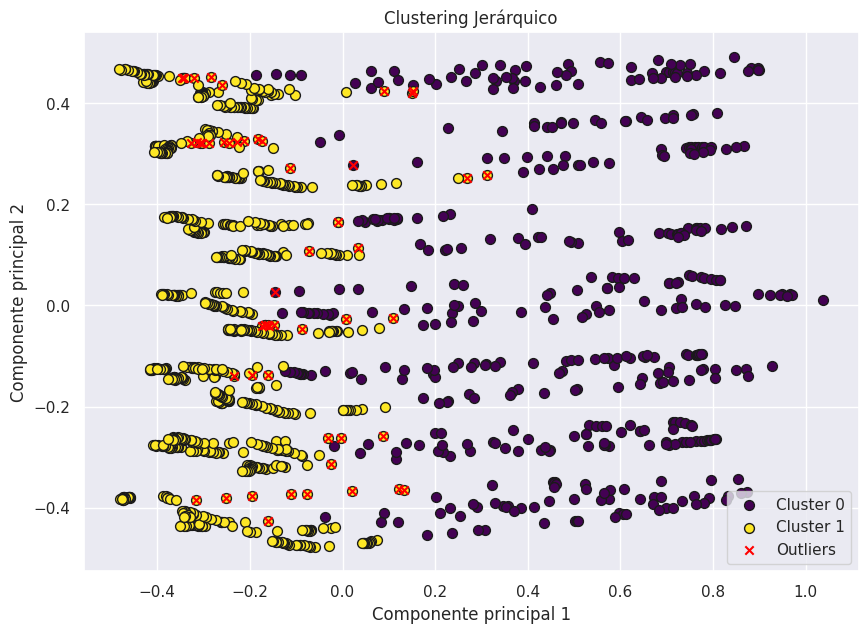

In [132]:
title = "Clustering Jerárquico"
pca_para_visualizacion(train_normalization_maxabs, new_clusters, lof_outliers, title)

El gráfico de dispersión muestra algunos puntos que se entrelazan entre los clusters.

### Segunda Iteración: Clustering Jerárquico Aglomerativo con 9 dimensiones

Ahora probemos el modelo Jerárquico Aglomerativo pero eliminando la variable de 'co2_comedor_sensor', ya que en los anteriores análisis(PCA) esta variable se muestra muy alejada del componente representativo y muy cerca de 'co2_habitacion_sensor'. Así mismo, se eliminará la variable 'humedad_comedor_sensor' debido a que tiene una alta correlación con la variable 'humedad_habitacion_sensor'.

In [133]:
# Copia de los datos
train_selected_without_c02_hum = train_selected.copy()

In [134]:
train_selected_without_c02_hum.drop("co2_comedor_sensor", axis = 1, inplace = True)
train_selected_without_c02_hum.drop("humedad_comedor_sensor", axis = 1, inplace = True)

In [135]:
train_selected_without_c02_hum.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1373 entries, 0 to 1372
Data columns (total 9 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   temperature_comedor_sensor   1373 non-null   float64
 1   weather_temperature          1373 non-null   float64
 2   co2_habitacion_sensor        1373 non-null   float64
 3   humedad_habitacion_sensor    1373 non-null   float64
 4   lighting_comedor_sensor      1373 non-null   float64
 5   lighting_habitacion_sensor   1373 non-null   float64
 6   temperature_exterior_sensor  1373 non-null   float64
 7   humedad_exterior_sensor      1373 non-null   float64
 8   day_of_week                  1373 non-null   int64  
dtypes: float64(8), int64(1)
memory usage: 96.7 KB


In [136]:
scaler = MaxAbsScaler()
train_normalization_without_c02_hum = scaler.fit_transform(train_selected_without_c02_hum)
train_normalization_without_c02_hum

array([[0.69838197, 0.44827586, 0.89392825, ..., 0.53798538, 0.51495111,
        0.42857143],
       [0.69697483, 0.44827586, 0.89194184, ..., 0.53698106, 0.5134753 ,
        0.42857143],
       [0.69402572, 0.44827586, 0.89498853, ..., 0.53617759, 0.51319463,
        0.42857143],
       ...,
       [0.64949523, 0.4137931 , 0.87306444, ..., 0.50892681, 0.76025126,
        0.42857143],
       [0.65043908, 0.43218276, 0.86812221, ..., 0.52646908, 0.74925254,
        0.42857143],
       [0.65205366, 0.44827586, 0.86355217, ..., 0.54465747, 0.7364631 ,
        0.42857143]])

Tiempo de ejecución:  0.032399654388427734


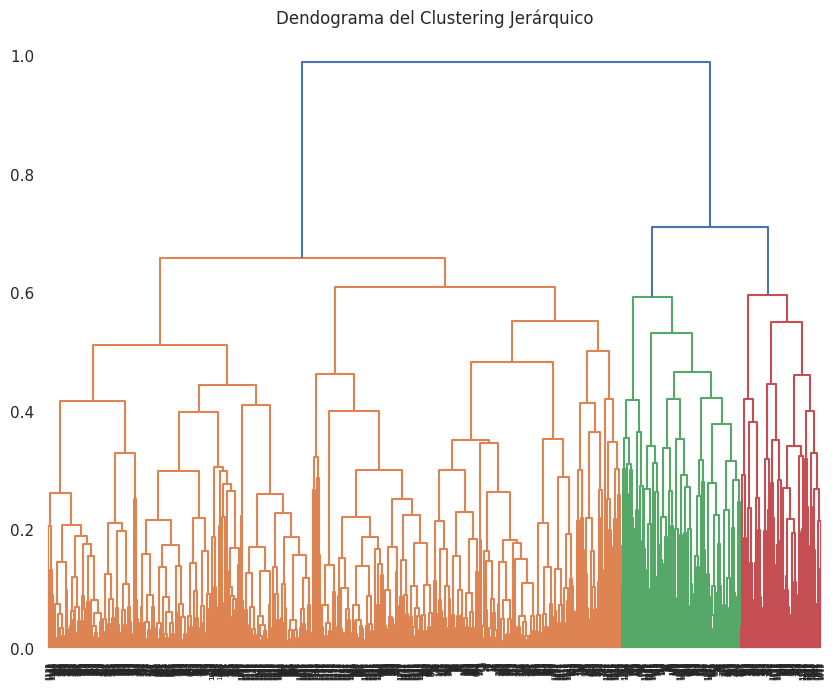

In [137]:
plt.figure(figsize=(10, 8))
plt.title("Dendograma del Clustering Jerárquico")

start_time = time.time()

clustering_jerarquico_without_c02_hum = linkage(train_normalization_without_c02_hum, metric="euclidean", method='average')
print("Tiempo de ejecución: ", time.time() - start_time)

dendograma = dendrogram(clustering_jerarquico_without_c02_hum)

In [138]:
# Vamos a medir la bondad de este clustering. Para ello, vamos a hacer uso del
# Cophenetic Correlation Coefficient (https://en.wikipedia.org/wiki/Cophenetic_correlation),
# disponible en la función cophenet() de scipy.cluster.hierarchy.

# Esta función compara (correla) las distancias reales entre todas las muestras de nuestro
# dataset con aquellas que implica el clustering obtenido. Cuanto más cerca este el valor de 1,
# mejor preserva el clustering las distancias originales, por lo que mejor es el clusering.

# pdist calcula las distancias entre elementos de nuestro dataset usando la
# métrica indicada (euclideana por defecto)
c, coph_dists = cophenet(clustering_jerarquico_without_c02_hum, pdist(train_normalization_without_c02_hum))
c

0.7688911822185528

In [139]:
start_time = time.time()
agglomerative_clustering_without_c02_hum = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='average')
new_clusters_without_c02_hum = agglomerative_clustering_without_c02_hum.fit_predict(train_normalization_without_c02_hum)
print("Tiempo de ejecución: ", time.time() - start_time)

print(new_clusters_without_c02_hum)

Tiempo de ejecución:  0.0457608699798584
[1 1 1 ... 1 1 1]


In [140]:
score = silhouette_score(train_normalization_without_c02_hum, new_clusters_without_c02_hum)
print("Silhouette Score: ", score)

Silhouette Score:  0.4093097341825886


In [141]:
silhouette_vals = silhouette_samples(train_normalization_without_c02_hum, new_clusters_without_c02_hum)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  46


In [142]:
lof_outliers = encontrar_outliers_lof(train_normalization_without_c02_hum, new_clusters_without_c02_hum)

Número de outliers identificados:  47


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


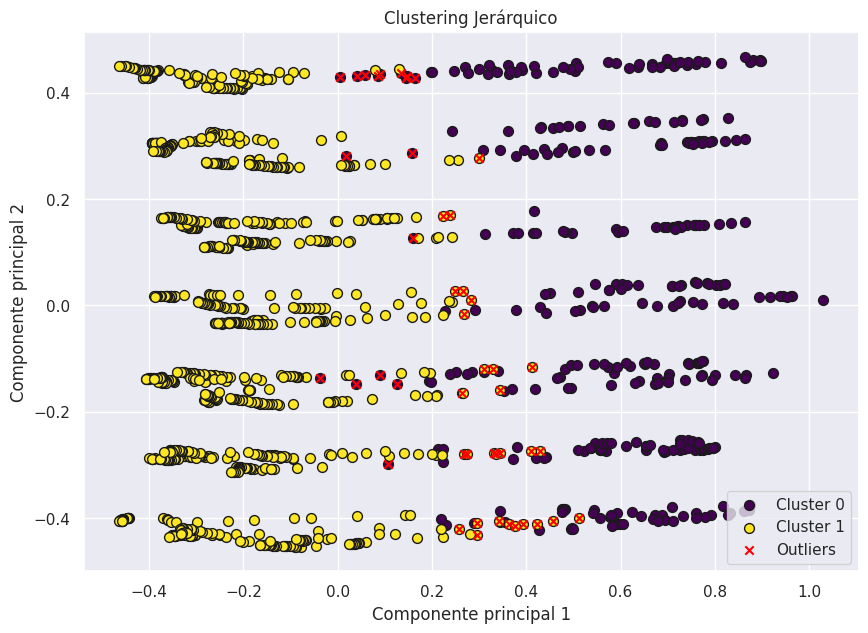

In [143]:
title = "Clustering Jerárquico"
pca_para_visualizacion(train_normalization_without_c02_hum, new_clusters_without_c02_hum, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


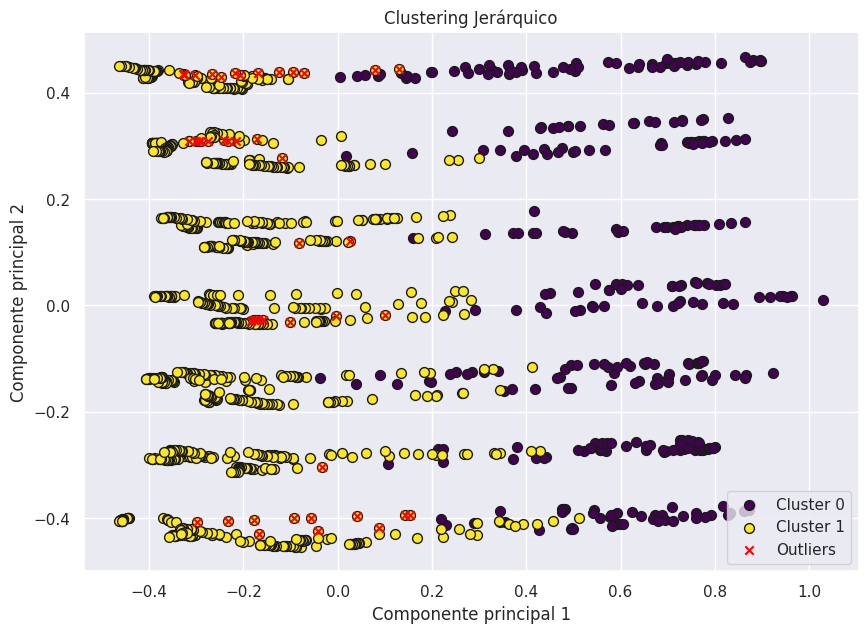

In [144]:
title = "Clustering Jerárquico"
pca_para_visualizacion(train_normalization_without_c02_hum, new_clusters_without_c02_hum, lof_outliers, title)

### Tercera Iteración: Clustering Jerárquico Aglomerativo con 6 dimensiones

Se probará el modelo jerárquico eliminando las variables "co2_comedor_sensor" y "humedad_comedor_sensor" ya que dieron buenos resultados en la anterior iteración. Por otro lado, se eliminarán los atributos "weather_temperature" y "temperature_exterior_sensor" ya que tiene una alta correlación con la variable "temperature_comedor_sensor". Por otro lado, también se removió el atributo "day_of_week" debido a que su relación con el resto de características es neutra, ya que no resulta relavante  de los días de la semana en la detección de anomalías.

In [145]:
# Copia de los datos
train_selected_six_dim = train_selected.copy()

In [146]:
train_selected_six_dim.drop("co2_comedor_sensor", axis = 1, inplace = True)
train_selected_six_dim.drop("humedad_comedor_sensor", axis = 1, inplace = True)
train_selected_six_dim.drop("weather_temperature", axis = 1, inplace = True)
train_selected_six_dim.drop("temperature_exterior_sensor", axis = 1, inplace = True)
train_selected_six_dim.drop("day_of_week", axis = 1, inplace = True)

In [147]:
train_selected_six_dim.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1373 entries, 0 to 1372
Data columns (total 6 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   temperature_comedor_sensor  1373 non-null   float64
 1   co2_habitacion_sensor       1373 non-null   float64
 2   humedad_habitacion_sensor   1373 non-null   float64
 3   lighting_comedor_sensor     1373 non-null   float64
 4   lighting_habitacion_sensor  1373 non-null   float64
 5   humedad_exterior_sensor     1373 non-null   float64
dtypes: float64(6)
memory usage: 64.5 KB


In [148]:
scaler = MaxAbsScaler()
train_normalization_six_dim = scaler.fit_transform(train_selected_six_dim)
train_normalization_six_dim

array([[0.69838197, 0.89392825, 0.57312253, 0.10483287, 0.09010098,
        0.51495111],
       [0.69697483, 0.89194184, 0.57124696, 0.10307969, 0.09391882,
        0.5134753 ],
       [0.69402572, 0.89498853, 0.57345128, 0.10395628, 0.09515771,
        0.51319463],
       ...,
       [0.64949523, 0.87306444, 0.85385566, 0.19020188, 0.20484802,
        0.76025126],
       [0.65043908, 0.86812221, 0.84944702, 0.25192715, 0.24402795,
        0.74925254],
       [0.65205366, 0.86355217, 0.84686265, 0.27827849, 0.28761048,
        0.7364631 ]])

Tiempo de ejecución:  0.04080915451049805


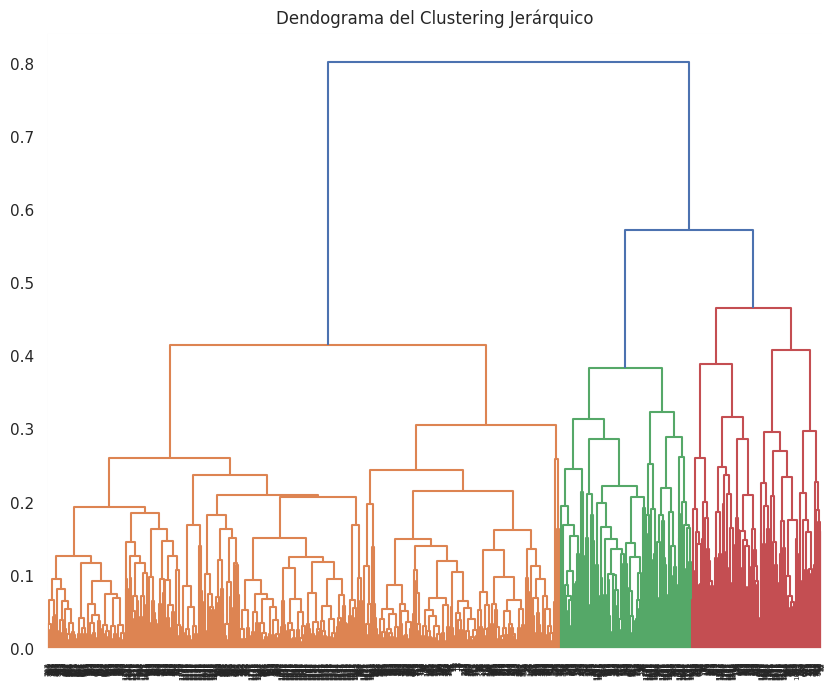

In [149]:
plt.figure(figsize=(10, 8))
plt.title("Dendograma del Clustering Jerárquico")

start_time = time.time()

clustering_jerarquico_six_dim = linkage(train_normalization_six_dim, metric="euclidean", method='average')
print("Tiempo de ejecución: ", time.time() - start_time)

dendograma = dendrogram(clustering_jerarquico_six_dim)

In [150]:
# Vamos a medir la bondad de este clustering. Para ello, vamos a hacer uso del
# Cophenetic Correlation Coefficient (https://en.wikipedia.org/wiki/Cophenetic_correlation),
# disponible en la función cophenet() de scipy.cluster.hierarchy.

# Esta función compara (correla) las distancias reales entre todas las muestras de nuestro
# dataset con aquellas que implica el clustering obtenido. Cuanto más cerca este el valor de 1,
# mejor preserva el clustering las distancias originales, por lo que mejor es el clusering.

# pdist calcula las distancias entre elementos de nuestro dataset usando la
# métrica indicada (euclideana por defecto)
c, coph_dists = cophenet(clustering_jerarquico_six_dim, pdist(train_normalization_six_dim))
c

0.8021091078844738

In [151]:
start_time = time.time()
agglomerative_clustering_six_dim = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='average')
new_clusters_six_dim = agglomerative_clustering_six_dim.fit_predict(train_normalization_six_dim)
print("Tiempo de ejecución: ", time.time() - start_time)

print(new_clusters_six_dim)

Tiempo de ejecución:  0.03434109687805176
[1 1 1 ... 1 0 0]


In [152]:
score = silhouette_score(train_normalization_six_dim, new_clusters_six_dim)
print("Silhouette Score: ", score)

Silhouette Score:  0.4228730682419214


In [153]:
silhouette_vals = silhouette_samples(train_normalization_six_dim, new_clusters_six_dim)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  56


In [154]:
lof_outliers = encontrar_outliers_lof(train_normalization_six_dim, new_clusters_six_dim)

Número de outliers identificados:  26


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


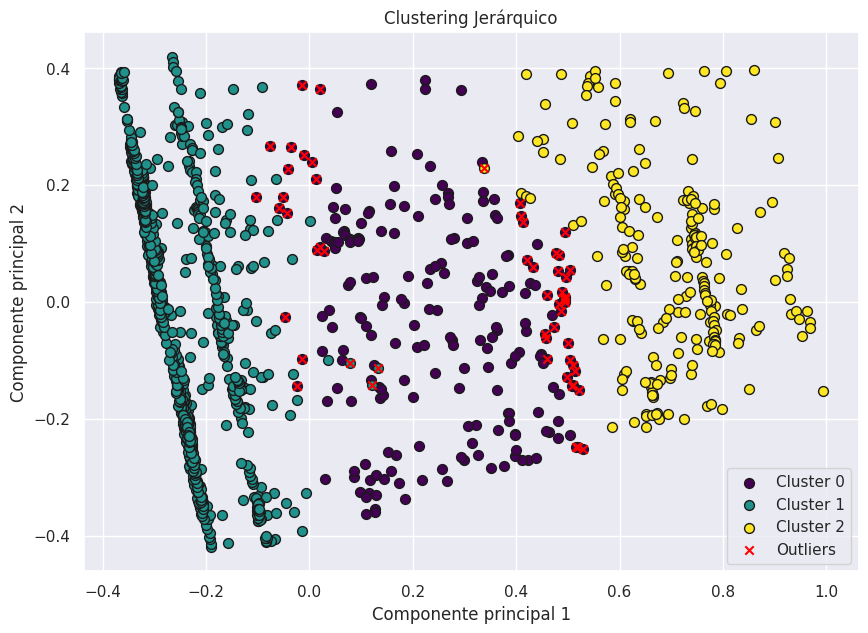

In [155]:
title = "Clustering Jerárquico"
pca_para_visualizacion(train_normalization_six_dim, new_clusters_six_dim, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


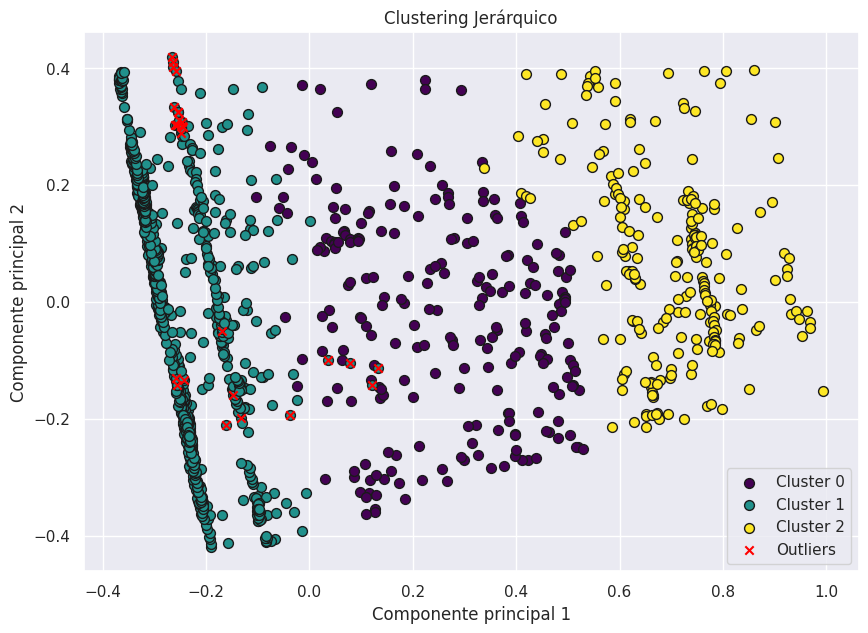

In [156]:
title = "Clustering Jerárquico"
pca_para_visualizacion(train_normalization_six_dim, new_clusters_six_dim, lof_outliers, title)

## DBSCAN

### Primera Iteración: BDSCAN con 11 dimensiones

#### Método del codo

Se utilizó el método del codo para determinar el valor de epsilons



In [157]:
#Calculamos la distancia k para determinar nuestro valor de epsilons.
def calculate_kn_distance(X, neigh=2):
  neigh = NearestNeighbors(n_neighbors=neigh)
  nbrs = neigh.fit(X)
  distances, indices = nbrs.kneighbors(X)
  return distances[:, 1:].reshape(-1)

#Obtenemos el valor exacto de eps utilizando kneebow, esta función nos permite
#encontrar el codo de una curva rotando la curva y tomando el valor mínimo.
def get_epsilons(X, neigh=2):
  eps_dist = np.sort(calculate_kn_distance(X, neigh=neigh))
  rotor = Rotor()
  curve_xy = np.concatenate([np.arange(eps_dist.shape[0]).reshape(-1, 1), eps_dist.reshape(-1, 1)],1)
  rotor.fit_rotate(curve_xy)
  rotor.plot_elbow()
  e_idx = rotor.get_elbow_index()
  return curve_xy[e_idx]

0.043386666541404974


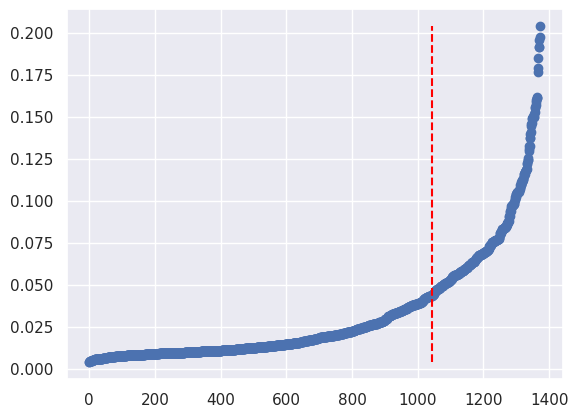

In [158]:
#LLamando a nuestra función principal
idx, epsilons = get_epsilons(train_normalization_maxabs)
plt.show
print(epsilons)

In [159]:
start_time = time.time()
clusters_dbscan = DBSCAN(eps=0.043386, min_samples = 3).fit(train_normalization_maxabs)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  0.02415752410888672


In [160]:
clusters_dbscan.labels_

array([ 0,  0,  0, ..., -1, -1, -1])

In [161]:
score = silhouette_score(train_normalization_maxabs, clusters_dbscan.labels_)
print("Silhouette Score: ", score)

Silhouette Score:  0.20984297624893442


In [162]:
#Hacemos una copia de la data con todas sus variables
train_selected_new_copy = train_selected.copy()

In [163]:
#Asignamos valores a la nueva variable, para poder observar clusters
train_selected_new_copy['cluster'] = np.array(clusters_dbscan.labels_)
train_selected_new_copy['cluster'].value_counts()

,count
cluster,
-1,420
5,44
68,24
4,23
74,23
...,...
73,3
72,3
71,3


In [164]:
def visualizar_con_pca_dbscan(X, labels):
  pca = PCA(n_components=2)
  X_pca = pca.fit_transform(X)

  # Visualización en 2D
  plt.figure(figsize=(10, 7))
  unique_labels = np.unique(labels)

  # Asignar colores a cada clúster
  colors = plt.cm.get_cmap('tab10', len(unique_labels))

  for i, label in enumerate(unique_labels):
      if label == -1:
          # Puntos etiquetados como ruido
          color = 'k'
          label_name = 'Ruido'
          plt.scatter(X_pca[labels == label, 0], X_pca[labels == label, 1], c=[color])
          plt.scatter(X_pca[labels == label, 0], X_pca[labels == label, 1], c='red', marker='x', label='Outliers')
      else:
          color = colors(i)
          label_name = f'Clúster {label}'
          plt.scatter(X_pca[labels == label, 0], X_pca[labels == label, 1], c=[color], label=label_name)

  plt.title('DBSCAN')
  plt.xlabel('Componente Principal 1')
  plt.ylabel('Componente Principal 2')
  plt.legend()
  plt.show()

In [165]:
def visualizar_con_pca_dbscan_sin_leyenda(X, labels):
  pca = PCA(n_components=2)
  X_pca = pca.fit_transform(X)

  # Visualización en 2D
  plt.figure(figsize=(10, 7))
  unique_labels = np.unique(labels)

  # Asignar colores a cada clúster
  colors = plt.cm.get_cmap('tab10', len(unique_labels))

  for i, label in enumerate(unique_labels):
      if label == -1:
          # Puntos etiquetados como ruido
          color = 'k'
          label_name = 'Ruido'
          plt.scatter(X_pca[labels == label, 0], X_pca[labels == label, 1], c=[color])
          plt.scatter(X_pca[labels == label, 0], X_pca[labels == label, 1], c='red', marker='x', label='Outliers')
      else:
          color = colors(i)
          label_name = f'Clúster {label}'
          plt.scatter(X_pca[labels == label, 0], X_pca[labels == label, 1], c=[color])

  plt.title('DBSCAN')
  plt.xlabel('Componente Principal 1')
  plt.ylabel('Componente Principal 2')
  plt.legend()
  plt.show()

<ipython-input-165-86d6a1821c11>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(unique_labels))


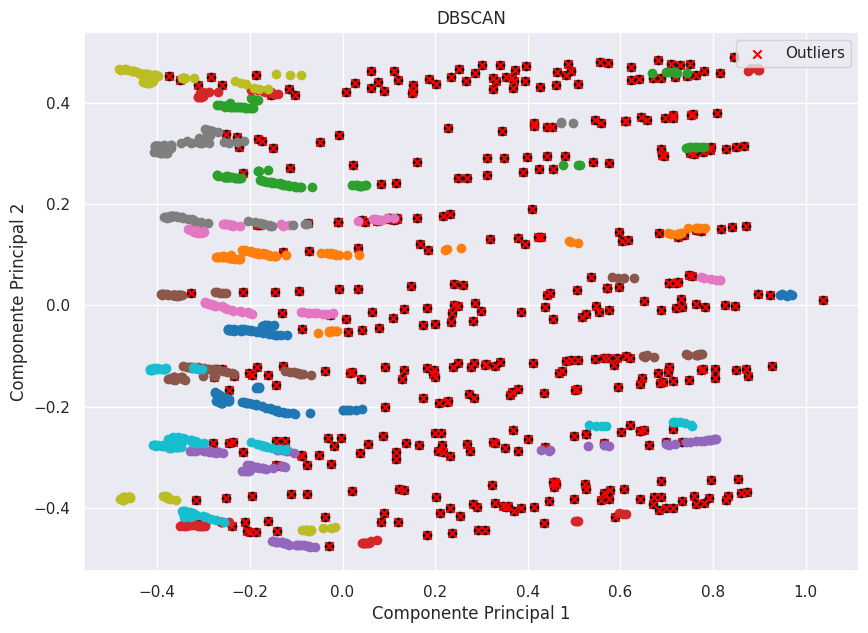

In [166]:
visualizar_con_pca_dbscan_sin_leyenda(train_normalization_maxabs, clusters_dbscan.labels_)

#### Técnica de búsqueda en cuadrícula

Se utilizó la técnica de búsqueda en cuadrícula para determinar el valor de epsilons y min_pts

In [167]:
epsilons = np.linspace(0.01, 1, num=70)
epsilons

array([0.01      , 0.02434783, 0.03869565, 0.05304348, 0.0673913 ,
       0.08173913, 0.09608696, 0.11043478, 0.12478261, 0.13913043,
       0.15347826, 0.16782609, 0.18217391, 0.19652174, 0.21086957,
       0.22521739, 0.23956522, 0.25391304, 0.26826087, 0.2826087 ,
       0.29695652, 0.31130435, 0.32565217, 0.34      , 0.35434783,
       0.36869565, 0.38304348, 0.3973913 , 0.41173913, 0.42608696,
       0.44043478, 0.45478261, 0.46913043, 0.48347826, 0.49782609,
       0.51217391, 0.52652174, 0.54086957, 0.55521739, 0.56956522,
       0.58391304, 0.59826087, 0.6126087 , 0.62695652, 0.64130435,
       0.65565217, 0.67      , 0.68434783, 0.69869565, 0.71304348,
       0.7273913 , 0.74173913, 0.75608696, 0.77043478, 0.78478261,
       0.79913043, 0.81347826, 0.82782609, 0.84217391, 0.85652174,
       0.87086957, 0.88521739, 0.89956522, 0.91391304, 0.92826087,
       0.9426087 , 0.95695652, 0.97130435, 0.98565217, 1.        ])

In [168]:
min_pts = np.arange(2, 21, step=1)
min_pts

array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19, 20])

In [169]:
combinations = list(itertools.product(epsilons, min_pts))
combinations

[(0.01, 2),
 (0.01, 3),
 (0.01, 4),
 (0.01, 5),
 (0.01, 6),
 (0.01, 7),
 (0.01, 8),
 (0.01, 9),
 (0.01, 10),
 (0.01, 11),
 (0.01, 12),
 (0.01, 13),
 (0.01, 14),
 (0.01, 15),
 (0.01, 16),
 (0.01, 17),
 (0.01, 18),
 (0.01, 19),
 (0.01, 20),
 (0.02434782608695652, 2),
 (0.02434782608695652, 3),
 (0.02434782608695652, 4),
 (0.02434782608695652, 5),
 (0.02434782608695652, 6),
 (0.02434782608695652, 7),
 (0.02434782608695652, 8),
 (0.02434782608695652, 9),
 (0.02434782608695652, 10),
 (0.02434782608695652, 11),
 (0.02434782608695652, 12),
 (0.02434782608695652, 13),
 (0.02434782608695652, 14),
 (0.02434782608695652, 15),
 (0.02434782608695652, 16),
 (0.02434782608695652, 17),
 (0.02434782608695652, 18),
 (0.02434782608695652, 19),
 (0.02434782608695652, 20),
 (0.03869565217391304, 2),
 (0.03869565217391304, 3),
 (0.03869565217391304, 4),
 (0.03869565217391304, 5),
 (0.03869565217391304, 6),
 (0.03869565217391304, 7),
 (0.03869565217391304, 8),
 (0.03869565217391304, 9),
 (0.03869565217391304

In [170]:
num_combinations = len(combinations)
num_combinations

1330

In [171]:
# Obtenido de https://www.youtube.com/watch?v=VO_uzCU_nKw

def get_scores_and_labels(combinations, X):
  scores = []
  all_labels_list = []

  for i, (eps, num_samples) in enumerate(combinations):
    dbscan_cluster_model = DBSCAN(eps=eps, min_samples=num_samples).fit(X)
    labels = dbscan_cluster_model.labels_
    labels_set = set(labels)
    num_clusters = len(labels_set)
    if -1 in labels_set:
      num_clusters -= 1

    if (num_clusters < 2) or (num_clusters > 50):
      scores.append(-10)
      all_labels_list.append('bad')
      c = (eps, num_samples)
      print(f"Combination {c} on iteration {i+1} of {num_combinations} has {num_clusters} clusters. Moving on")
      continue

    scores.append(silhouette_score(X, labels))
    all_labels_list.append(labels)
    print(f"Index: {i}, Score: {scores[-1]}, Labels: {all_labels_list[-1]}, NumClusters: {num_clusters}")

  best_index = np.argmax(scores)
  best_parameters = combinations[best_index]
  best_labels = all_labels_list[best_index]
  best_score = scores[best_index]

  return {'best_epsilon': best_parameters[0],
          'best_min_pts': best_parameters[1],
          'best_labels': best_labels,
          'best_score': best_score}

In [172]:
start_time = time.time()
best_dict = get_scores_and_labels(combinations, train_normalization_maxabs)
print("Tiempo de ejecución: ", time.time() - start_time)

Combination (0.01, 2) on iteration 1 of 1330 has 106 clusters. Moving on
Index: 1, Score: -0.3412472816369769, Labels: [ 0  0  0 ... -1 -1 -1], NumClusters: 49
Index: 2, Score: -0.27772680985999243, Labels: [ 0  0  0 ... -1 -1 -1], NumClusters: 8
Index: 3, Score: -0.06759501950439872, Labels: [-1 -1 -1 ... -1 -1 -1], NumClusters: 4
Combination (0.01, 6) on iteration 5 of 1330 has 0 clusters. Moving on
Combination (0.01, 7) on iteration 6 of 1330 has 0 clusters. Moving on
Combination (0.01, 8) on iteration 7 of 1330 has 0 clusters. Moving on
Combination (0.01, 9) on iteration 8 of 1330 has 0 clusters. Moving on
Combination (0.01, 10) on iteration 9 of 1330 has 0 clusters. Moving on
Combination (0.01, 11) on iteration 10 of 1330 has 0 clusters. Moving on
Combination (0.01, 12) on iteration 11 of 1330 has 0 clusters. Moving on
Combination (0.01, 13) on iteration 12 of 1330 has 0 clusters. Moving on
Combination (0.01, 14) on iteration 13 of 1330 has 0 clusters. Moving on
Combination (0.01,

In [173]:
best_dict

{'best_epsilon': 0.12478260869565216,
 'best_min_pts': 12,
 'best_labels': array([ 0,  0,  0, ..., 30, -1, -1]),
 'best_score': 0.250179209268374}

In [174]:
best_dict['best_labels']

array([ 0,  0,  0, ..., 30, -1, -1])

In [175]:
#Hacemos una copia de la data con todas sus variables
train_selected_copy = train_selected.copy()

In [176]:
#Asignamos valores a la nueva variable, para poder observar clusters
train_selected_copy['cluster'] = np.array(best_dict['best_labels'])
train_selected_copy['cluster'].value_counts()

,count
cluster,
-1,496
2,62
24,52
18,39
23,38
22,33
8,32
10,32
6,32


<ipython-input-165-86d6a1821c11>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(unique_labels))


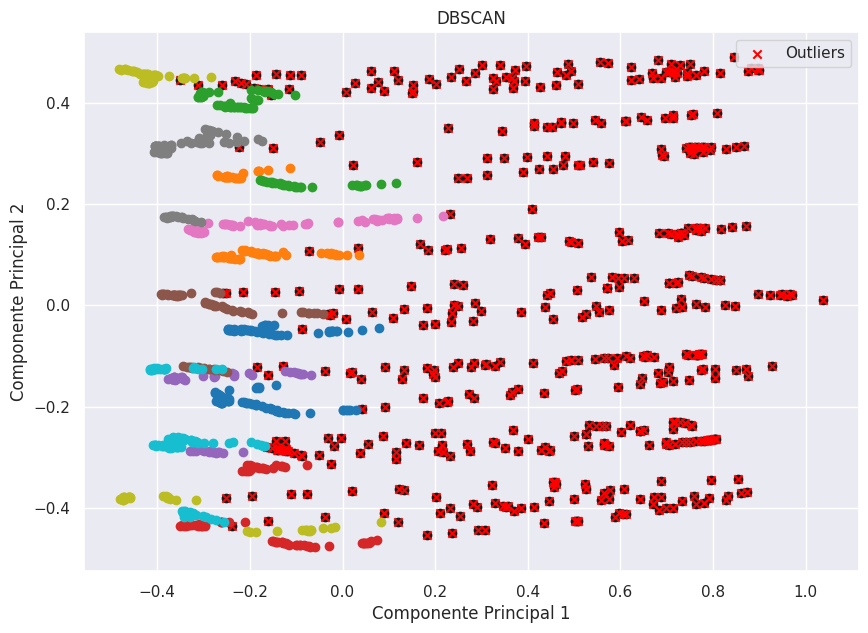

In [177]:
visualizar_con_pca_dbscan_sin_leyenda(train_normalization_maxabs, best_dict['best_labels'])

### Segunda Iteración: BDSCAN con 9 dimensiones

Ahora probemos el modelo DBSCAN pero eliminando la variable de 'co2_comedor_sensor', ya que en los anteriores análisis(PCA) esta variable se muestra muy alejada del componente representativo y muy cerca de 'co2_habitacion_sensor'. Así mismo, se eliminará la variable 'humedad_comedor_sensor' debido a que tiene una alta correlación con la variable 'humedad_habitacion_sensor'.

In [178]:
#Usaremos la data con nueve dimensiones y normalizada con MaxAbsScaler
train_normalization_without_c02_hum

array([[0.69838197, 0.44827586, 0.89392825, ..., 0.53798538, 0.51495111,
        0.42857143],
       [0.69697483, 0.44827586, 0.89194184, ..., 0.53698106, 0.5134753 ,
        0.42857143],
       [0.69402572, 0.44827586, 0.89498853, ..., 0.53617759, 0.51319463,
        0.42857143],
       ...,
       [0.64949523, 0.4137931 , 0.87306444, ..., 0.50892681, 0.76025126,
        0.42857143],
       [0.65043908, 0.43218276, 0.86812221, ..., 0.52646908, 0.74925254,
        0.42857143],
       [0.65205366, 0.44827586, 0.86355217, ..., 0.54465747, 0.7364631 ,
        0.42857143]])

In [179]:
start_time = time.time()
best_dict = get_scores_and_labels(combinations, train_normalization_without_c02_hum)
print("Tiempo de ejecución: ", time.time() - start_time)

Combination (0.01, 2) on iteration 1 of 1330 has 118 clusters. Moving on
Combination (0.01, 3) on iteration 2 of 1330 has 64 clusters. Moving on
Index: 2, Score: -0.3579248241224631, Labels: [ 0  0  0 ... -1 -1 -1], NumClusters: 13
Index: 3, Score: -0.22871863568486087, Labels: [-1 -1 -1 ... -1 -1 -1], NumClusters: 6
Combination (0.01, 6) on iteration 5 of 1330 has 0 clusters. Moving on
Combination (0.01, 7) on iteration 6 of 1330 has 0 clusters. Moving on
Combination (0.01, 8) on iteration 7 of 1330 has 0 clusters. Moving on
Combination (0.01, 9) on iteration 8 of 1330 has 0 clusters. Moving on
Combination (0.01, 10) on iteration 9 of 1330 has 0 clusters. Moving on
Combination (0.01, 11) on iteration 10 of 1330 has 0 clusters. Moving on
Combination (0.01, 12) on iteration 11 of 1330 has 0 clusters. Moving on
Combination (0.01, 13) on iteration 12 of 1330 has 0 clusters. Moving on
Combination (0.01, 14) on iteration 13 of 1330 has 0 clusters. Moving on
Combination (0.01, 15) on iterati

In [180]:
best_dict

{'best_epsilon': 0.2539130434782609,
 'best_min_pts': 20,
 'best_labels': array([0, 0, 0, ..., 0, 0, 0]),
 'best_score': 0.3160982588873794}

In [181]:
best_dict['best_labels']

array([0, 0, 0, ..., 0, 0, 0])

In [182]:
#Hacemos una copia de la data con todas sus variables
train_selected_copy = train_selected.copy()

In [183]:
#Asignamos valores a la nueva variable, para poder observar clusters
train_selected_copy['cluster'] = np.array(best_dict['best_labels'])
train_selected_copy['cluster'].value_counts()

,count
cluster,
0,1006
1,235
-1,132


<ipython-input-164-0f29f1057c2a>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(unique_labels))


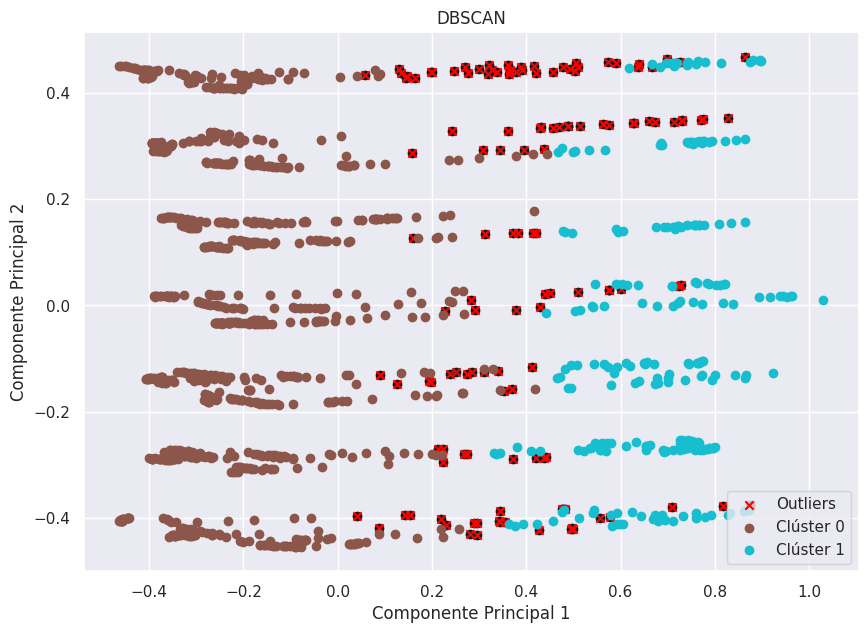

In [184]:
visualizar_con_pca_dbscan(train_normalization_without_c02_hum, best_dict['best_labels'])

### Tercera Iteración: BDSCAN con 6 dimensiones

In [185]:
train_normalization_six_dim

array([[0.69838197, 0.89392825, 0.57312253, 0.10483287, 0.09010098,
        0.51495111],
       [0.69697483, 0.89194184, 0.57124696, 0.10307969, 0.09391882,
        0.5134753 ],
       [0.69402572, 0.89498853, 0.57345128, 0.10395628, 0.09515771,
        0.51319463],
       ...,
       [0.64949523, 0.87306444, 0.85385566, 0.19020188, 0.20484802,
        0.76025126],
       [0.65043908, 0.86812221, 0.84944702, 0.25192715, 0.24402795,
        0.74925254],
       [0.65205366, 0.86355217, 0.84686265, 0.27827849, 0.28761048,
        0.7364631 ]])

In [186]:
start_time = time.time()
best_dict = get_scores_and_labels(combinations, train_normalization_six_dim)
print("Tiempo de ejecución: ", time.time() - start_time)

Combination (0.01, 2) on iteration 1 of 1330 has 133 clusters. Moving on
Combination (0.01, 3) on iteration 2 of 1330 has 81 clusters. Moving on
Index: 2, Score: -0.23613560409782708, Labels: [ 0  0  0 ... -1 -1 -1], NumClusters: 45
Index: 3, Score: -0.3823670417868431, Labels: [-1 -1 -1 ... -1 -1 -1], NumClusters: 21
Index: 4, Score: -0.398366939600781, Labels: [-1 -1 -1 ... -1 -1 -1], NumClusters: 4
Combination (0.01, 7) on iteration 6 of 1330 has 0 clusters. Moving on
Combination (0.01, 8) on iteration 7 of 1330 has 0 clusters. Moving on
Combination (0.01, 9) on iteration 8 of 1330 has 0 clusters. Moving on
Combination (0.01, 10) on iteration 9 of 1330 has 0 clusters. Moving on
Combination (0.01, 11) on iteration 10 of 1330 has 0 clusters. Moving on
Combination (0.01, 12) on iteration 11 of 1330 has 0 clusters. Moving on
Combination (0.01, 13) on iteration 12 of 1330 has 0 clusters. Moving on
Combination (0.01, 14) on iteration 13 of 1330 has 0 clusters. Moving on
Combination (0.01,

In [187]:
best_dict

{'best_epsilon': 0.15347826086956523,
 'best_min_pts': 15,
 'best_labels': array([0, 0, 0, ..., 0, 0, 0]),
 'best_score': 0.40984913202595447}

In [188]:
best_dict['best_labels']

array([0, 0, 0, ..., 0, 0, 0])

In [189]:
#Hacemos una copia de la data con todas sus variables
train_selected_copy = train_selected.copy()

In [190]:
#Asignamos valores a la nueva variable, para poder observar clusters
train_selected_copy['cluster'] = np.array(best_dict['best_labels'])
train_selected_copy['cluster'].value_counts()

,count
cluster,
0,1001
1,259
-1,83
2,30


In [191]:
def visualizar_con_pca_dbscan_distinto_outliers(X, labels):
  pca = PCA(n_components=2)
  X_pca = pca.fit_transform(X)

  # Visualización en 2D
  plt.figure(figsize=(10, 7))
  unique_labels = np.unique(labels)

  # Asignar colores a cada clúster
  colors = plt.cm.get_cmap('tab10', len(unique_labels))
  exclude_red = [colors(i) for i in range(len(unique_labels)) if i != 1]

  for i, label in enumerate(unique_labels):
      if label == -1:
          # Puntos etiquetados como ruido
          color = 'k'
          label_name = 'Ruido'
          plt.scatter(X_pca[labels == label, 0], X_pca[labels == label, 1], c=[color])
          plt.scatter(X_pca[labels == label, 0], X_pca[labels == label, 1], c='red', marker='x', label='Outliers')
      else:
          color = exclude_red[i % len(exclude_red)]
          label_name = f'Clúster {label}'
          plt.scatter(X_pca[labels == label, 0], X_pca[labels == label, 1], c=[color], label=label_name)

  plt.title('DBSCAN')
  plt.xlabel('Componente Principal 1')
  plt.ylabel('Componente Principal 2')
  plt.legend()
  plt.show()

<ipython-input-191-820fd1a0c5ed>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(unique_labels))


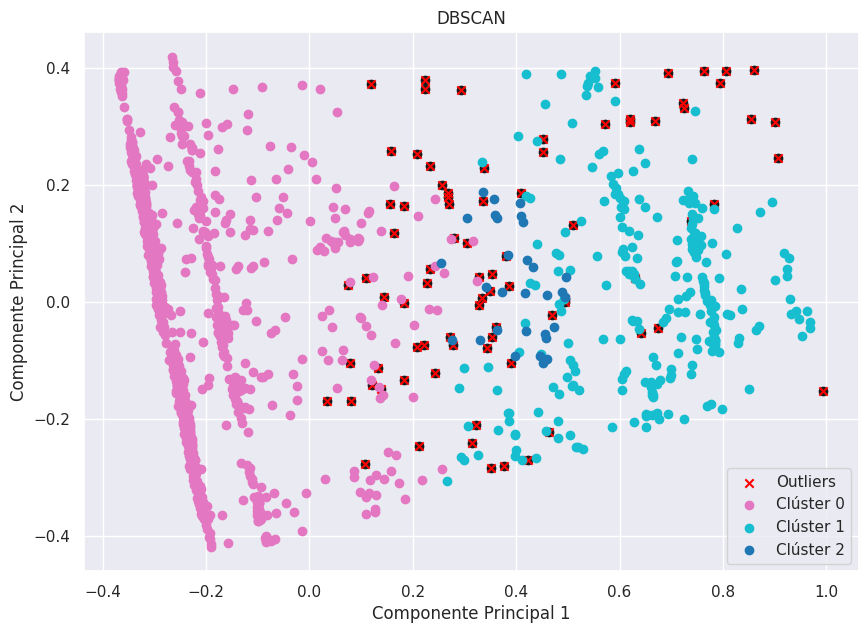

In [192]:
visualizar_con_pca_dbscan_distinto_outliers(train_normalization_six_dim, best_dict['best_labels'])

## Modelo de Gaussian Mixture

### Primera Iteración: Gaussian Mixture con 11 dimensiones

Escoger el número de componentes que tendrá el modelo Gaussian Mixture:

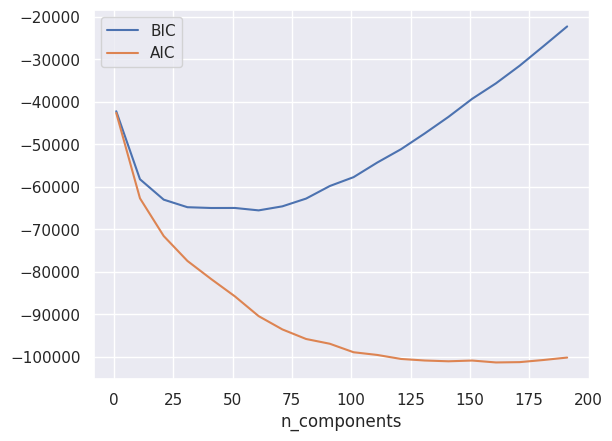

In [193]:
n_components = np.arange(1, 200, 10)
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(train_normalization_maxabs)
          for n in n_components]

plt.plot(n_components, [m.bic(train_normalization_maxabs) for m in models], label='BIC')
plt.plot(n_components, [m.aic(train_normalization_maxabs) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

Usaremos el modelo de GMMs:

In [194]:
# Obtenido del notebook "4 - Métodos de clustering probabilisticos"
start_time = time.time()
gmm = GaussianMixture(n_components=50, covariance_type='full', random_state=42).fit(train_normalization_maxabs)
labels = gmm.predict(train_normalization_maxabs)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  0.8322470188140869


In [195]:
bic = gmm.bic(train_normalization_maxabs)
print("BIC:", bic)

BIC: -65834.22047299816


In [196]:
aic = gmm.aic(train_normalization_maxabs)
print("AIC:", aic)

AIC: -86205.53400208747


In [197]:
score = silhouette_score(train_normalization_maxabs, labels)
print("Silhouette Score: ", score)

Silhouette Score:  0.3587581658163959


In [198]:
# Obtener la log-likelihood de cada punto
log_likelihoods = gmm.score_samples(train_normalization_maxabs)

# Definir un umbral para detectar outliers
threshold = np.percentile(log_likelihoods, 1)  # Umbral en el percentil 5

# Identificar los outliers (log-likelihood por debajo del umbral)
outliers = log_likelihoods < threshold

In [199]:
print("Número de outliers identificados: ", np.sum(outliers))

Número de outliers identificados:  14


<ipython-input-114-096ec7142c10>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, edgecolor='k', s=50)


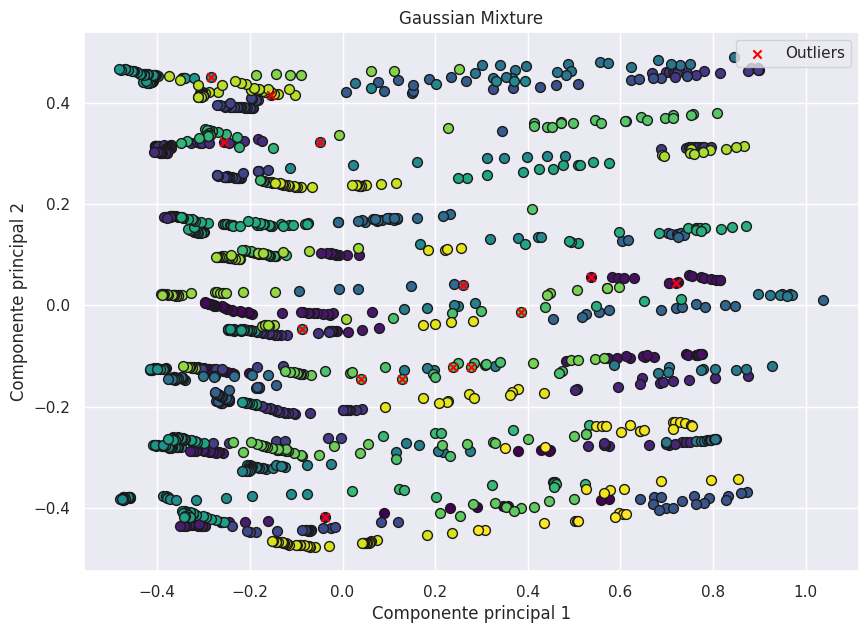

In [200]:
title = "Gaussian Mixture"
pca_para_visualizacion_sin_leyenda(train_normalization_maxabs, labels, outliers, title)

### Segunda Iteración: Gaussian Mixture con 9 dimensiones

Data normalizada con MaxAbsScaler y 9 dimensiones:

In [201]:
train_normalization_without_c02_hum

array([[0.69838197, 0.44827586, 0.89392825, ..., 0.53798538, 0.51495111,
        0.42857143],
       [0.69697483, 0.44827586, 0.89194184, ..., 0.53698106, 0.5134753 ,
        0.42857143],
       [0.69402572, 0.44827586, 0.89498853, ..., 0.53617759, 0.51319463,
        0.42857143],
       ...,
       [0.64949523, 0.4137931 , 0.87306444, ..., 0.50892681, 0.76025126,
        0.42857143],
       [0.65043908, 0.43218276, 0.86812221, ..., 0.52646908, 0.74925254,
        0.42857143],
       [0.65205366, 0.44827586, 0.86355217, ..., 0.54465747, 0.7364631 ,
        0.42857143]])

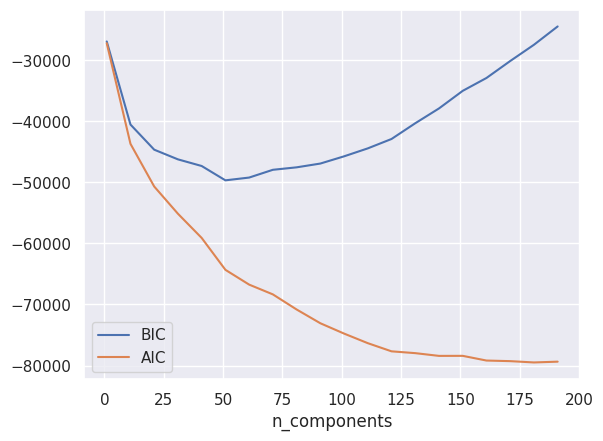

In [202]:
n_components = np.arange(1, 200, 10)
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(train_normalization_without_c02_hum)
          for n in n_components]

plt.plot(n_components, [m.bic(train_normalization_without_c02_hum) for m in models], label='BIC')
plt.plot(n_components, [m.aic(train_normalization_without_c02_hum) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

In [203]:
# Obtenido del notebook "4 - Métodos de clustering probabilisticos"
start_time = time.time()
gmm = GaussianMixture(n_components=50, covariance_type='full', random_state=42).fit(train_normalization_without_c02_hum)
labels = gmm.predict(train_normalization_without_c02_hum)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  1.078495740890503


In [204]:
bic = gmm.bic(train_normalization_without_c02_hum)
print("BIC:", bic)

BIC: -49527.71379061061


In [205]:
aic = gmm.aic(train_normalization_without_c02_hum)
print("AIC:", aic)

AIC: -63890.560903066755


In [206]:
score = silhouette_score(train_normalization_without_c02_hum, labels)
print("Silhouette Score: ", score)

Silhouette Score:  0.33289067045223136


In [207]:
# Obtener la log-likelihood de cada punto
log_likelihoods = gmm.score_samples(train_normalization_without_c02_hum)

# Definir un umbral para detectar outliers
threshold = np.percentile(log_likelihoods, 1)  # Umbral en el percentil 5

# Identificar los outliers (log-likelihood por debajo del umbral)
outliers = log_likelihoods < threshold

In [208]:
print("Número de outliers identificados: ", np.sum(outliers))

Número de outliers identificados:  14


<ipython-input-114-096ec7142c10>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, edgecolor='k', s=50)


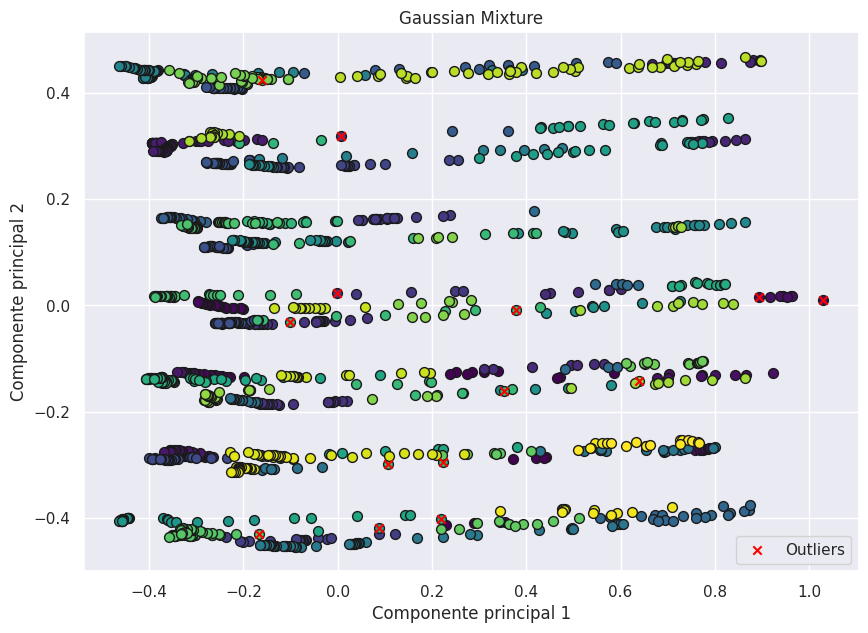

In [209]:
title = "Gaussian Mixture"
pca_para_visualizacion_sin_leyenda(train_normalization_without_c02_hum, labels, outliers, title)

### Tercera Iteracción: Gaussian Mixture con 6 dimensiones

Data normalizada con MaxAbsScaler y 6 dimensiones:

In [210]:
train_normalization_six_dim

array([[0.69838197, 0.89392825, 0.57312253, 0.10483287, 0.09010098,
        0.51495111],
       [0.69697483, 0.89194184, 0.57124696, 0.10307969, 0.09391882,
        0.5134753 ],
       [0.69402572, 0.89498853, 0.57345128, 0.10395628, 0.09515771,
        0.51319463],
       ...,
       [0.64949523, 0.87306444, 0.85385566, 0.19020188, 0.20484802,
        0.76025126],
       [0.65043908, 0.86812221, 0.84944702, 0.25192715, 0.24402795,
        0.74925254],
       [0.65205366, 0.86355217, 0.84686265, 0.27827849, 0.28761048,
        0.7364631 ]])

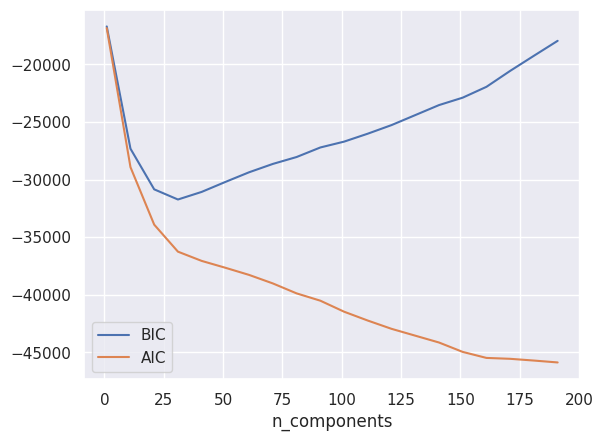

In [211]:
n_components = np.arange(1, 200, 10)
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(train_normalization_six_dim)
          for n in n_components]

plt.plot(n_components, [m.bic(train_normalization_six_dim) for m in models], label='BIC')
plt.plot(n_components, [m.aic(train_normalization_six_dim) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

In [212]:
# Obtenido del notebook "4 - Métodos de clustering probabilisticos"
start_time = time.time()
gmm = GaussianMixture(n_components=25, covariance_type='full', random_state=42).fit(train_normalization_six_dim)
labels = gmm.predict(train_normalization_six_dim)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  0.3630194664001465


In [213]:
bic = gmm.bic(train_normalization_six_dim)
print("BIC:", bic)

BIC: -30914.741063346297


In [214]:
aic = gmm.aic(train_normalization_six_dim)
print("AIC:", aic)

AIC: -34566.84369397811


In [215]:
score = silhouette_score(train_normalization_six_dim, labels)
print("Silhouette Score: ", score)

Silhouette Score:  0.1298679506568052


In [216]:
# Obtener la log-likelihood de cada punto
log_likelihoods = gmm.score_samples(train_normalization_six_dim)

# Definir un umbral para detectar outliers
threshold = np.percentile(log_likelihoods, 1)  # Umbral en el percentil 5

# Identificar los outliers (log-likelihood por debajo del umbral)
outliers = log_likelihoods < threshold

In [217]:
print("Número de outliers identificados: ", np.sum(outliers))

Número de outliers identificados:  14


<ipython-input-114-096ec7142c10>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, edgecolor='k', s=50)


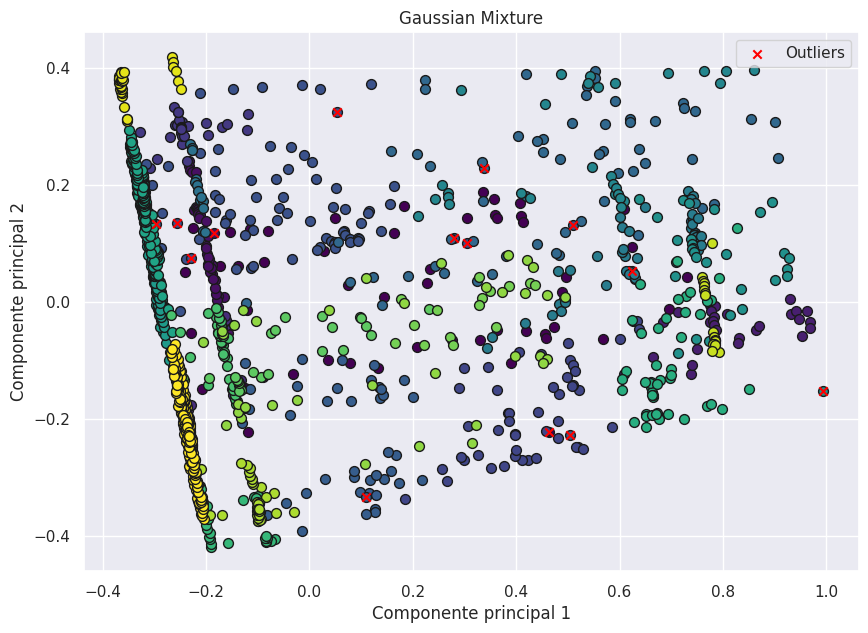

In [218]:
title = "Gaussian Mixture"
pca_para_visualizacion_sin_leyenda(train_normalization_six_dim, labels, outliers, title)

## K-means

### Primera Iteración: K-means con 11 dimensiones

Métodos para encontrar el número de clusters a utilizar:

In [219]:
distortions = []
silhouettes = []

for i in range(2, 20):
    km = KMeans(i, init='random', n_init=10, max_iter=300, tol=1e-4, random_state=42)
    clustering = km.fit_predict(train_normalization_maxabs)
    distortions.append(km.inertia_)
    silhouettes.append(silhouette_score(train_normalization_maxabs, clustering))

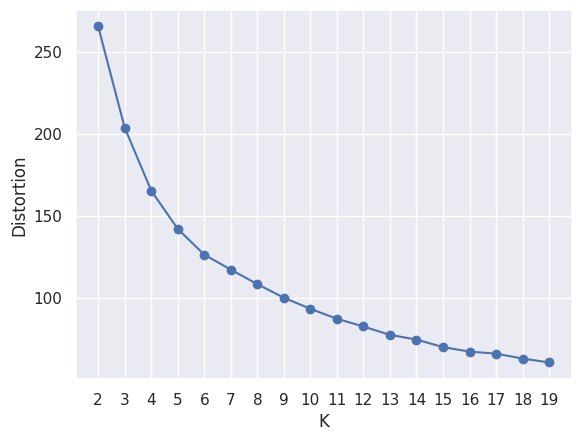

In [220]:
plt.plot(range(2,20), distortions, marker='o')
plt.xticks(range(2, 20))
plt.xlabel('K')
plt.ylabel('Distortion')
plt.grid(True)
plt.show()

Observamos que los valores de 5 y 6 para K se obtiene una ligera curva, los cuales usaremos dichos valores para el parámetro "n_clusters" en K-means.

Elbow:  6


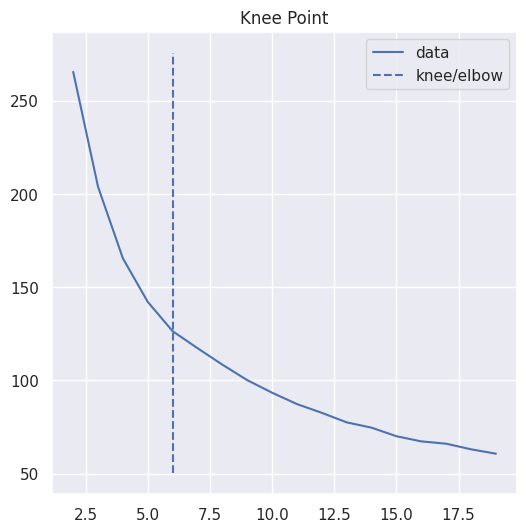

In [221]:
kneedle = kneed.KneeLocator(range(2, 20), distortions[:20], curve="convex", direction="decreasing")
elbow_point = kneedle.elbow
print('Elbow: ', elbow_point)
kneedle.plot_knee()

Identificamos que, con el método del codo tenemos el valor de 6 para ser empleado en el parámetro "n_clusters" en K-means.

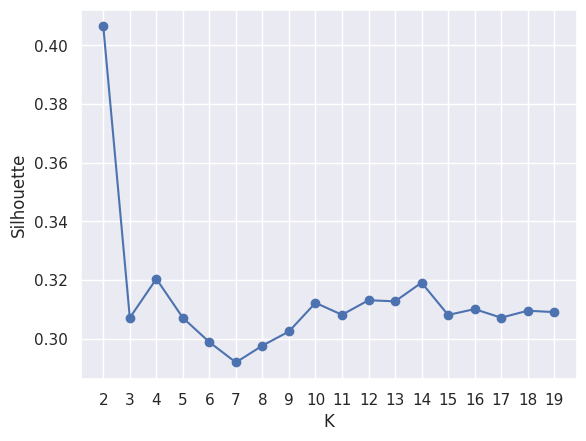

In [222]:
plt.plot(range(2,20), silhouettes , marker='o')
plt.xticks(range(2, 20))
plt.xlabel('K')
plt.ylabel('Silhouette')
plt.grid(True)
plt.show()

Con el método de la silhouette obtenemos el valor de 2 para ser empleado en el parámetro "n_clusters" en K-means.

#### K-means con k = 6

In [223]:
start_time = time.time()
kmeans = KMeans(n_clusters = 6, random_state = 0)
new_clusters = kmeans.fit_predict(train_normalization_maxabs)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  0.00973367691040039


In [224]:
score = silhouette_score(train_normalization_maxabs, new_clusters)
print("Silhouette Score: ", score)

Silhouette Score:  0.30001235063175935


In [225]:
silhouette_vals = silhouette_samples(train_normalization_maxabs, new_clusters)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  14


In [226]:
lof_outliers = encontrar_outliers_lof(train_normalization_maxabs, new_clusters)

Número de outliers identificados:  71


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


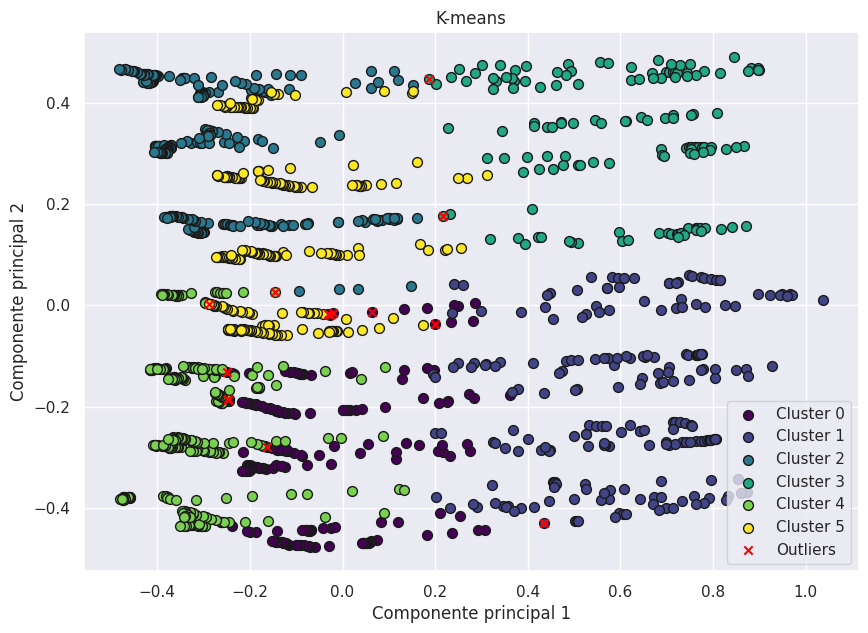

In [227]:
title = "K-means"
pca_para_visualizacion(train_normalization_maxabs, new_clusters, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


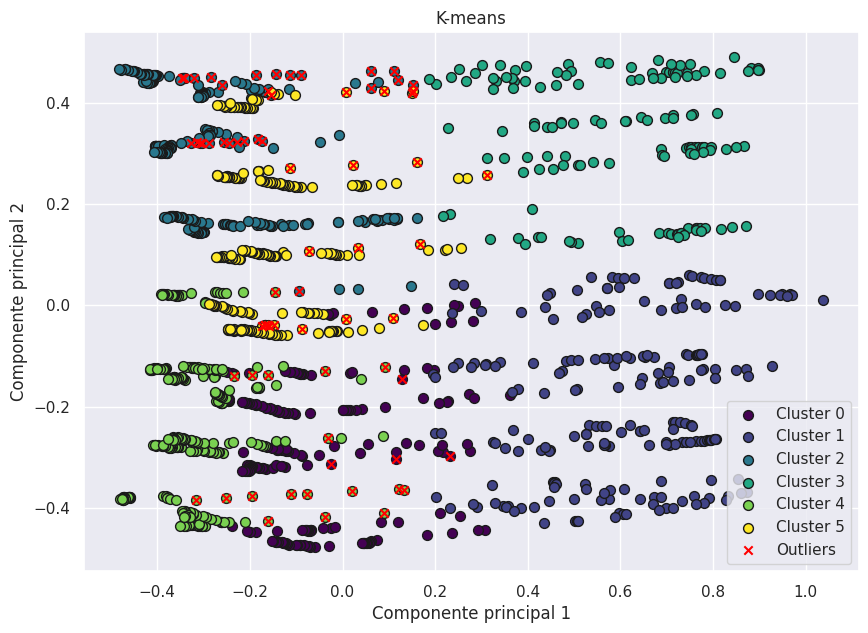

In [228]:
title = "K-means"
pca_para_visualizacion(train_normalization_maxabs, new_clusters, lof_outliers, title)

#### K-means con k = 5

In [229]:
start_time = time.time()
kmeans = KMeans(n_clusters = 5, random_state = 0)
new_clusters = kmeans.fit_predict(train_normalization_maxabs)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  0.008358478546142578


In [230]:
score = silhouette_score(train_normalization_maxabs, new_clusters)
print("Silhouette Score: ", score)

Silhouette Score:  0.3071000205557707


In [231]:
silhouette_vals = silhouette_samples(train_normalization_maxabs, new_clusters)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  29


In [232]:
lof_outliers = encontrar_outliers_lof(train_normalization_maxabs, new_clusters)

Número de outliers identificados:  78


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


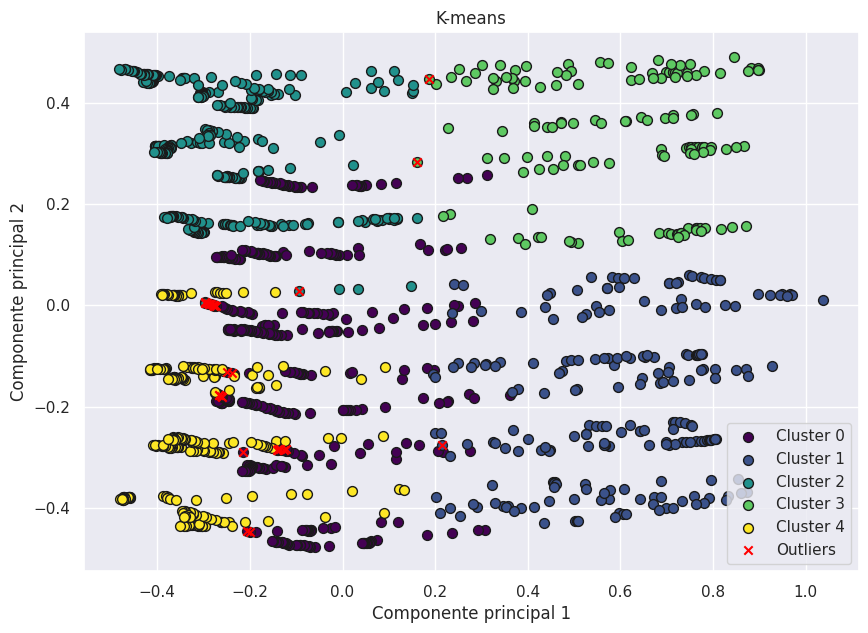

In [233]:
title = "K-means"
pca_para_visualizacion(train_normalization_maxabs, new_clusters, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


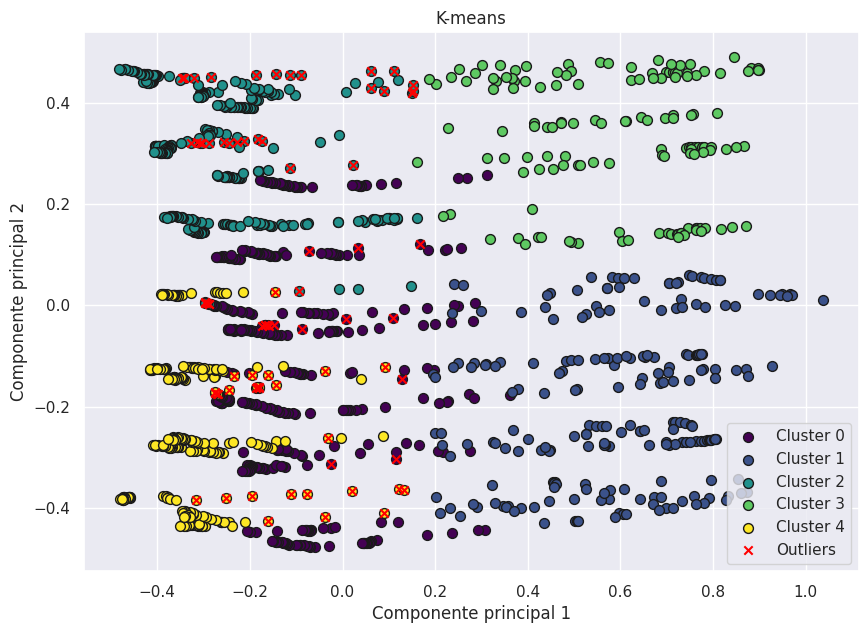

In [234]:
title = "K-means"
pca_para_visualizacion(train_normalization_maxabs, new_clusters, lof_outliers, title)

#### K-means con k = 4

In [235]:
start_time = time.time()
kmeans = KMeans(n_clusters = 4, random_state = 0)
new_clusters = kmeans.fit_predict(train_normalization_maxabs)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  0.01549839973449707


In [236]:
score = silhouette_score(train_normalization_maxabs, new_clusters)
print("Silhouette Score: ", score)

Silhouette Score:  0.28454323169590306


In [237]:
silhouette_vals = silhouette_samples(train_normalization_maxabs, new_clusters)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  24


In [238]:
lof_outliers = encontrar_outliers_lof(train_normalization_maxabs, new_clusters)

Número de outliers identificados:  64


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


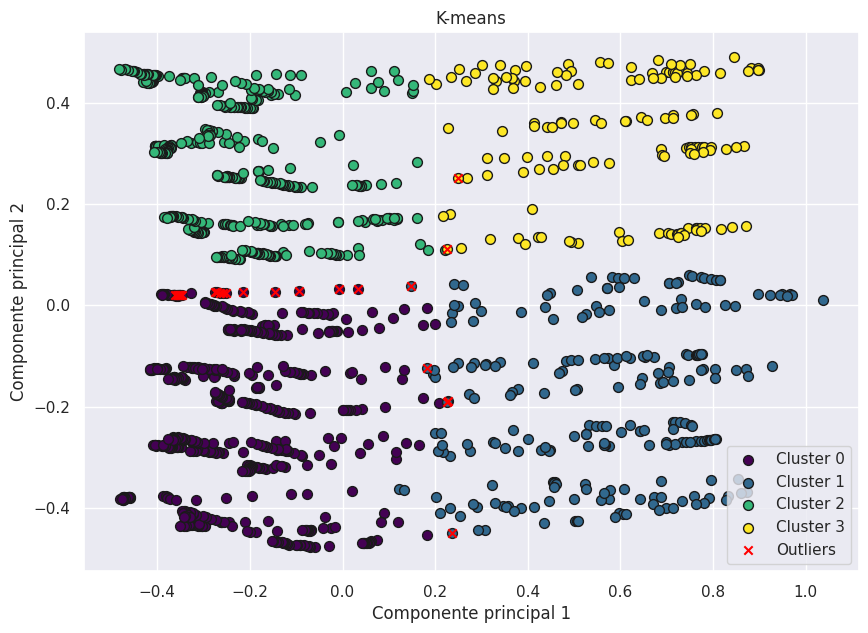

In [239]:
title = "K-means"
pca_para_visualizacion(train_normalization_maxabs, new_clusters, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


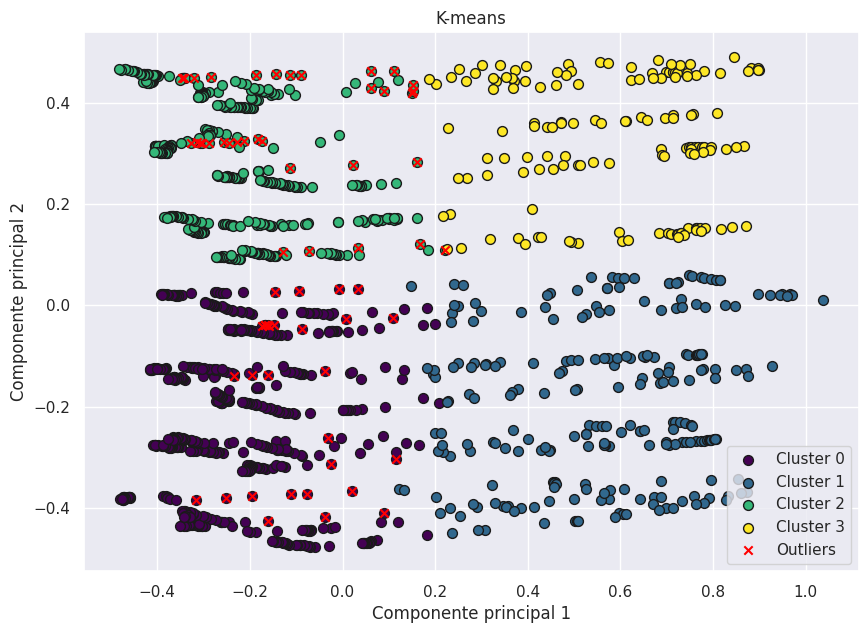

In [240]:
title = "K-means"
pca_para_visualizacion(train_normalization_maxabs, new_clusters, lof_outliers, title)

#### K-means con k = 2

In [241]:
start_time = time.time()
kmeans = KMeans(n_clusters = 2, random_state = 0)
new_clusters = kmeans.fit_predict(train_normalization_maxabs)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  0.0047037601470947266


In [242]:
score = silhouette_score(train_normalization_maxabs, new_clusters)
print("Silhouette Score: ", score)

Silhouette Score:  0.4064090074492313


In [243]:
silhouette_vals = silhouette_samples(train_normalization_maxabs, new_clusters)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  10


In [244]:
lof_outliers = encontrar_outliers_lof(train_normalization_maxabs, new_clusters)

Número de outliers identificados:  58


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


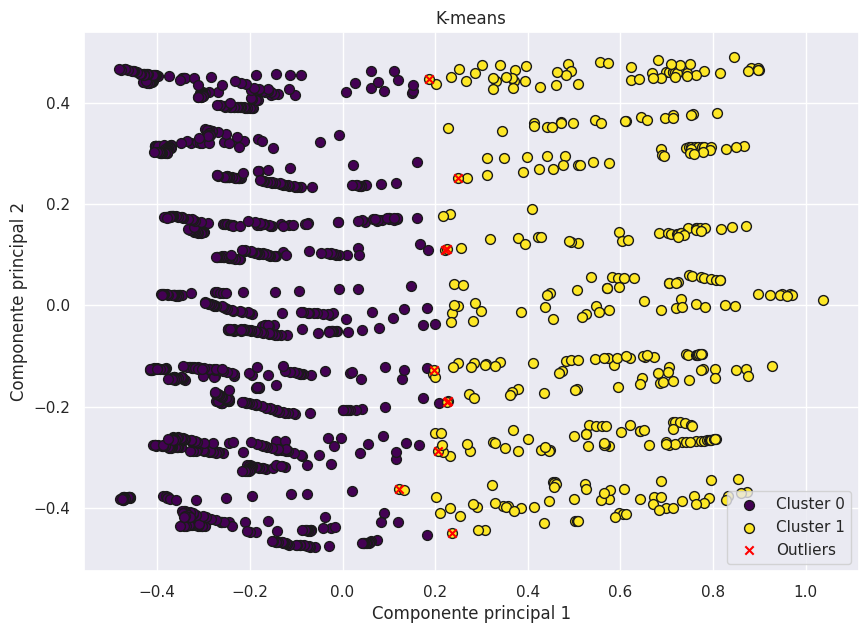

In [245]:
title = "K-means"
pca_para_visualizacion(train_normalization_maxabs, new_clusters, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


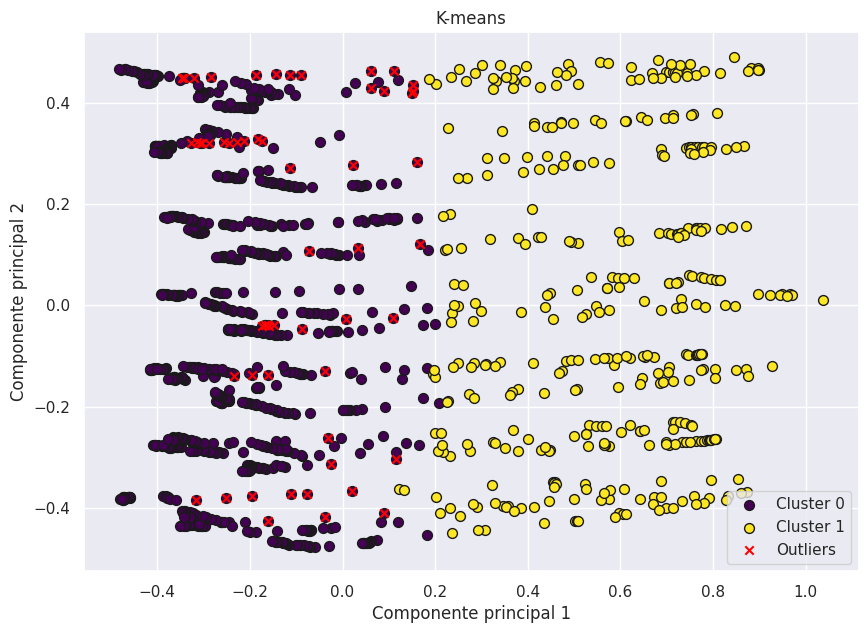

In [246]:
title = "K-means"
pca_para_visualizacion(train_normalization_maxabs, new_clusters, lof_outliers, title)

### Segunda Iteración: K-means con 9 dimensiones

Data normalizada con MaxAbsScaler y 9 dimensiones:

In [247]:
train_normalization_without_c02_hum

array([[0.69838197, 0.44827586, 0.89392825, ..., 0.53798538, 0.51495111,
        0.42857143],
       [0.69697483, 0.44827586, 0.89194184, ..., 0.53698106, 0.5134753 ,
        0.42857143],
       [0.69402572, 0.44827586, 0.89498853, ..., 0.53617759, 0.51319463,
        0.42857143],
       ...,
       [0.64949523, 0.4137931 , 0.87306444, ..., 0.50892681, 0.76025126,
        0.42857143],
       [0.65043908, 0.43218276, 0.86812221, ..., 0.52646908, 0.74925254,
        0.42857143],
       [0.65205366, 0.44827586, 0.86355217, ..., 0.54465747, 0.7364631 ,
        0.42857143]])

Métodos para encontrar el número de clusters a utilizar:

In [248]:
distortions = []
silhouettes = []

for i in range(2, 20):
    km = KMeans(i, init='random', n_init=10, max_iter=300, tol=1e-4, random_state=42)
    clustering = km.fit_predict(train_normalization_without_c02_hum)
    distortions.append(km.inertia_)
    silhouettes.append(silhouette_score(train_normalization_without_c02_hum, clustering))

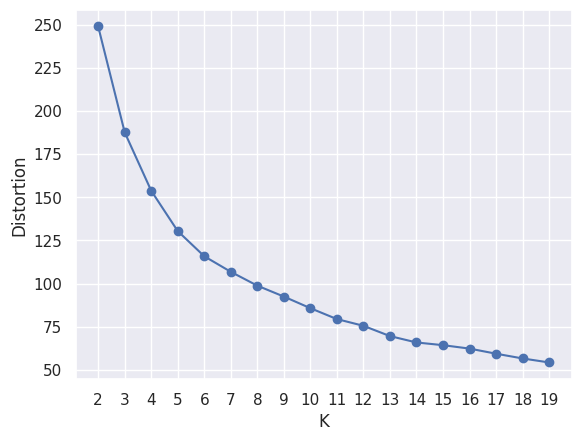

In [249]:
plt.plot(range(2,20), distortions, marker='o')
plt.xticks(range(2, 20))
plt.xlabel('K')
plt.ylabel('Distortion')
plt.grid(True)
plt.show()

Observamos que los valores de 5 y 6 para K se obtiene una ligera curva, los cuales usaremos dichos valores para el parámetro "n_clusters" en K-means.

Elbow:  6


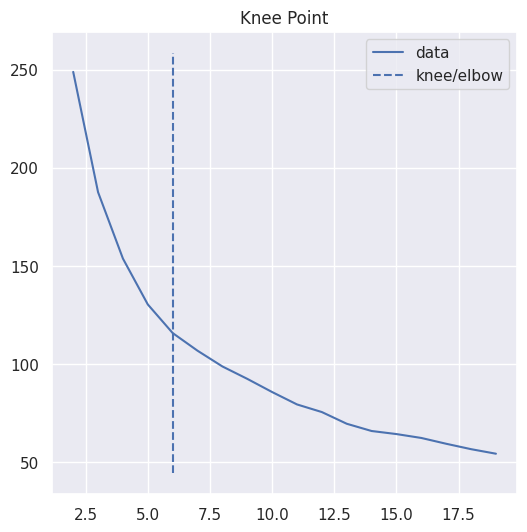

In [250]:
kneedle = kneed.KneeLocator(range(2, 20), distortions[:20], curve="convex", direction="decreasing")
elbow_point = kneedle.elbow
print('Elbow: ', elbow_point)
kneedle.plot_knee()

Identificamos que, con el método del codo tenemos el valor de 6 para ser empleado en el parámetro "n_clusters" en K-means.

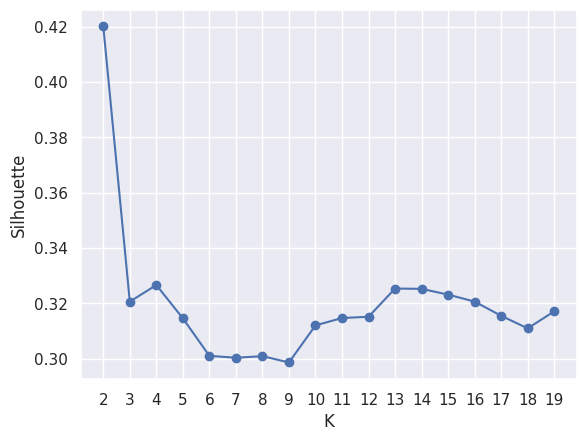

In [251]:
plt.plot(range(2,20), silhouettes , marker='o')
plt.xticks(range(2, 20))
plt.xlabel('K')
plt.ylabel('Silhouette')
plt.grid(True)
plt.show()

Con el método de la silhouette obtenemos el valor de 2 para ser empleado en el parámetro "n_clusters" en K-means.

#### K-means con k = 6

In [252]:
start_time = time.time()
kmeans = KMeans(n_clusters = 6, random_state = 0)
new_clusters = kmeans.fit_predict(train_normalization_without_c02_hum)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  0.01772284507751465


In [253]:
score = silhouette_score(train_normalization_without_c02_hum, new_clusters)
print("Silhouette Score: ", score)

Silhouette Score:  0.29216921600820583


In [254]:
silhouette_vals = silhouette_samples(train_normalization_without_c02_hum, new_clusters)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  42


In [255]:
lof_outliers = encontrar_outliers_lof(train_normalization_without_c02_hum, new_clusters)

Número de outliers identificados:  74


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


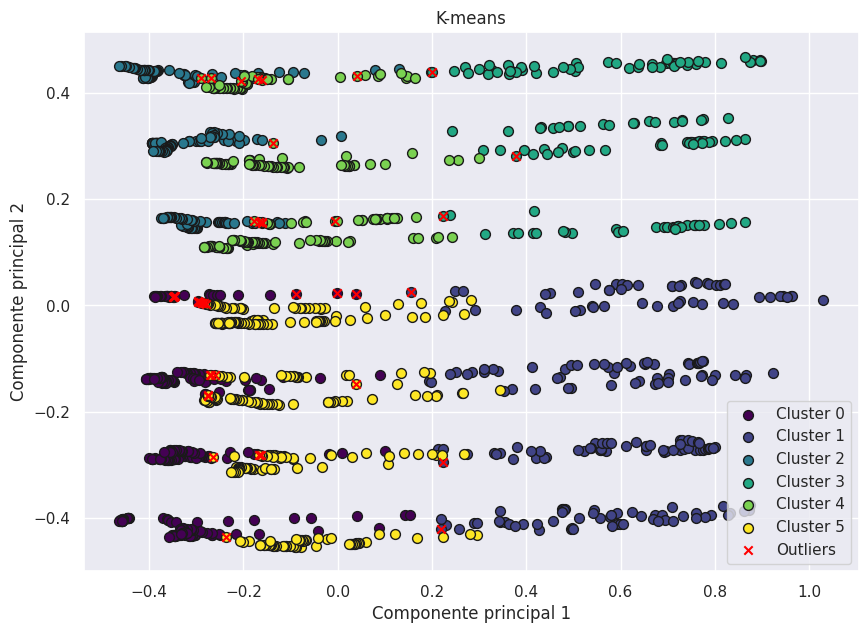

In [256]:
title = "K-means"
pca_para_visualizacion(train_normalization_without_c02_hum, new_clusters, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


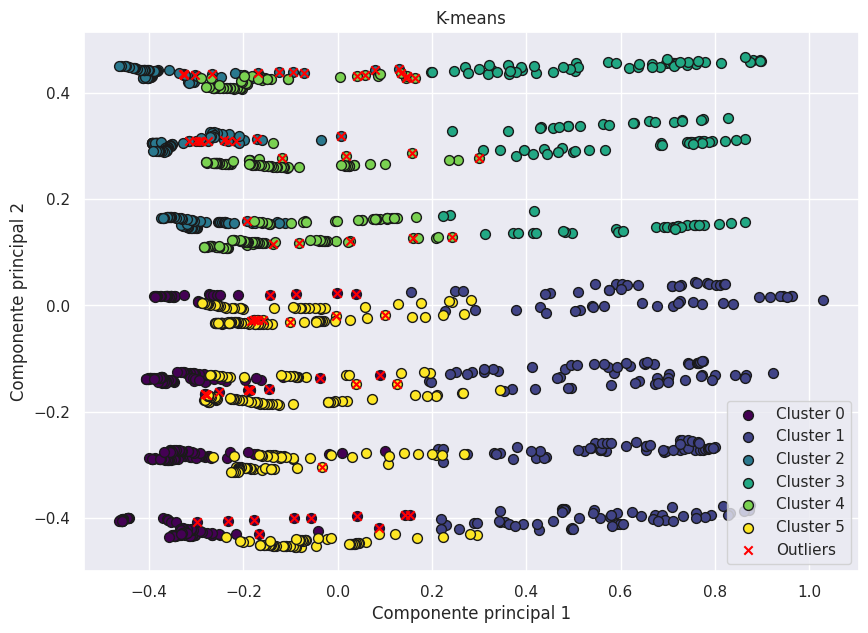

In [257]:
title = "K-means"
pca_para_visualizacion(train_normalization_without_c02_hum, new_clusters, lof_outliers, title)

#### K-means con k = 5

In [258]:
start_time = time.time()
kmeans = KMeans(n_clusters = 5, random_state = 0)
new_clusters = kmeans.fit_predict(train_normalization_without_c02_hum)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  0.009404420852661133


In [259]:
score = silhouette_score(train_normalization_without_c02_hum, new_clusters)
print("Silhouette Score: ", score)

Silhouette Score:  0.3145695097993724


In [260]:
silhouette_vals = silhouette_samples(train_normalization_without_c02_hum, new_clusters)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  26


In [261]:
lof_outliers = encontrar_outliers_lof(train_normalization_without_c02_hum, new_clusters)

Número de outliers identificados:  75


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


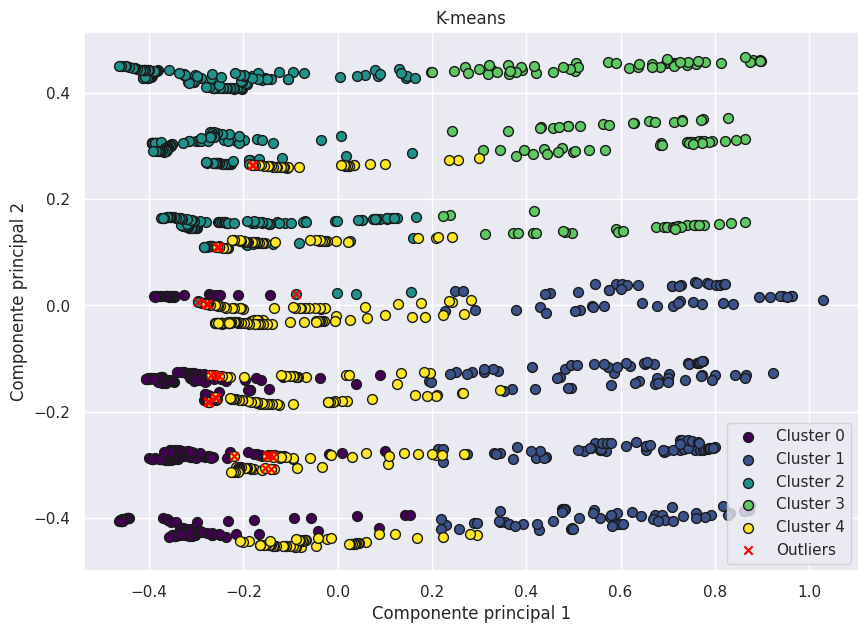

In [262]:
title = "K-means"
pca_para_visualizacion(train_normalization_without_c02_hum, new_clusters, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


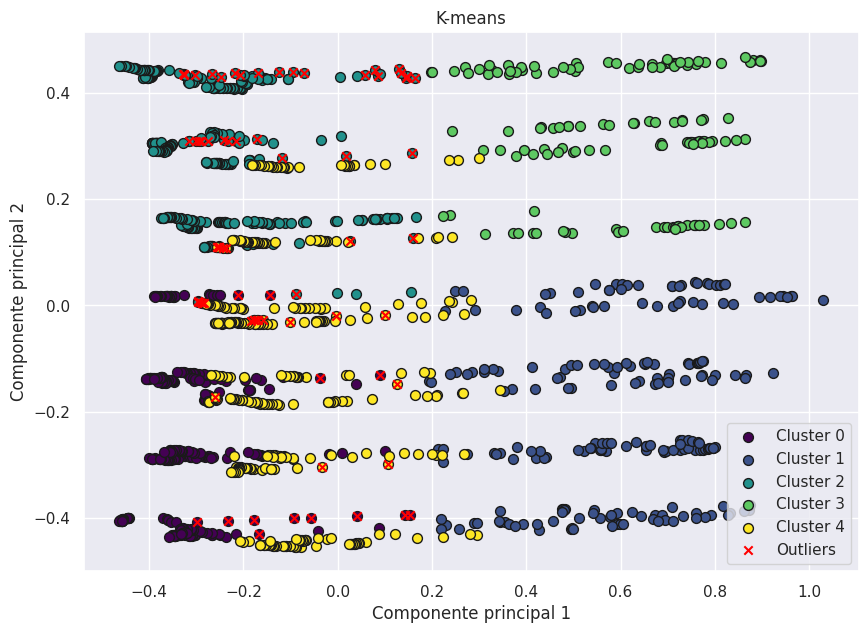

In [263]:
title = "K-means"
pca_para_visualizacion(train_normalization_without_c02_hum, new_clusters, lof_outliers, title)

#### K-means con k = 4

In [264]:
start_time = time.time()
kmeans = KMeans(n_clusters = 4, random_state = 0)
new_clusters = kmeans.fit_predict(train_normalization_without_c02_hum)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  0.012720823287963867


In [265]:
score = silhouette_score(train_normalization_without_c02_hum, new_clusters)
print("Silhouette Score: ", score)

Silhouette Score:  0.3001256753050537


In [266]:
silhouette_vals = silhouette_samples(train_normalization_without_c02_hum, new_clusters)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  16


In [267]:
lof_outliers = encontrar_outliers_lof(train_normalization_without_c02_hum, new_clusters)

Número de outliers identificados:  61


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


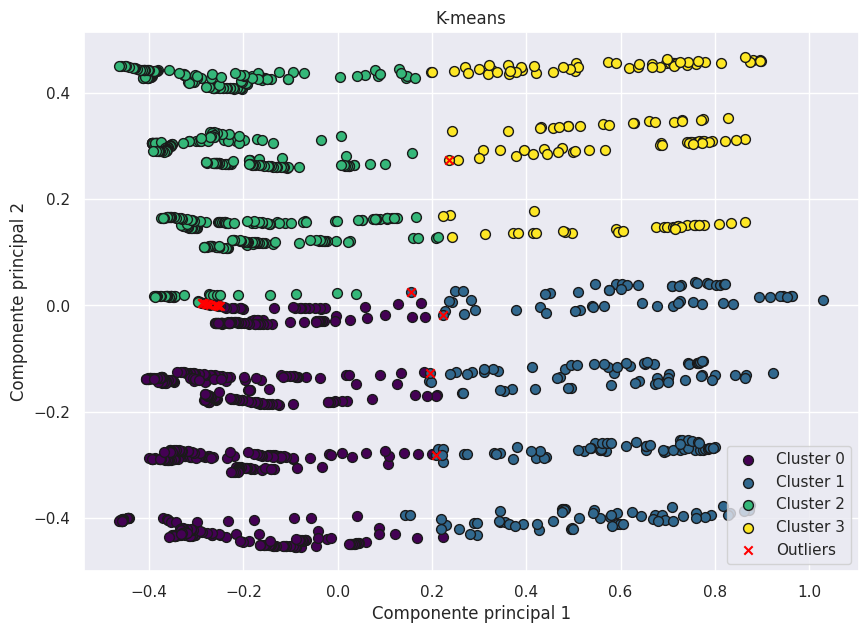

In [268]:
title = "K-means"
pca_para_visualizacion(train_normalization_without_c02_hum, new_clusters, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


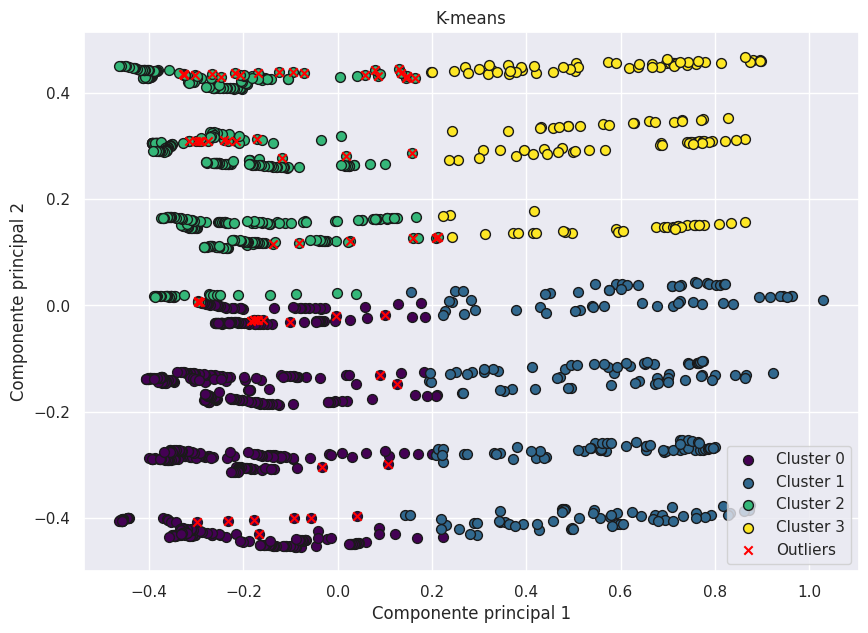

In [269]:
title = "K-means"
pca_para_visualizacion(train_normalization_without_c02_hum, new_clusters, lof_outliers, title)

#### K-means con k = 2

In [270]:
start_time = time.time()
kmeans = KMeans(n_clusters = 2, random_state = 0)
new_clusters = kmeans.fit_predict(train_normalization_without_c02_hum)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  0.018430233001708984


In [271]:
score = silhouette_score(train_normalization_without_c02_hum, new_clusters)
print("Silhouette Score: ", score)

Silhouette Score:  0.4211189522737612


In [272]:
silhouette_vals = silhouette_samples(train_normalization_without_c02_hum, new_clusters)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  3


In [273]:
lof_outliers = encontrar_outliers_lof(train_normalization_without_c02_hum, new_clusters)

Número de outliers identificados:  52


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


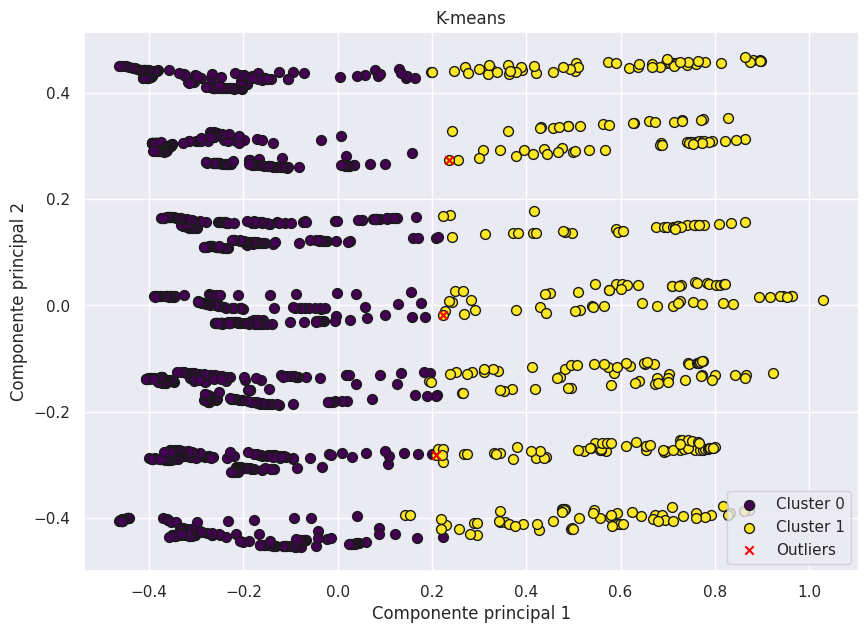

In [274]:
title = "K-means"
pca_para_visualizacion(train_normalization_without_c02_hum, new_clusters, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


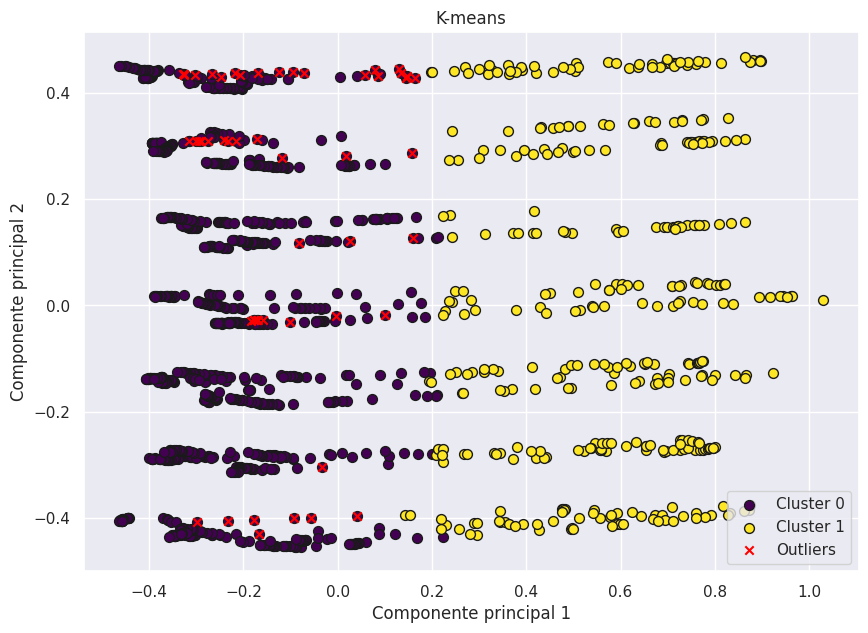

In [275]:
title = "K-means"
pca_para_visualizacion(train_normalization_without_c02_hum, new_clusters, lof_outliers, title)

### Tercera Iteración: K-means con 6 dimensiones

Data normalizada con MaxAbsScaler y 6 dimensiones:

In [276]:
train_normalization_six_dim

array([[0.69838197, 0.89392825, 0.57312253, 0.10483287, 0.09010098,
        0.51495111],
       [0.69697483, 0.89194184, 0.57124696, 0.10307969, 0.09391882,
        0.5134753 ],
       [0.69402572, 0.89498853, 0.57345128, 0.10395628, 0.09515771,
        0.51319463],
       ...,
       [0.64949523, 0.87306444, 0.85385566, 0.19020188, 0.20484802,
        0.76025126],
       [0.65043908, 0.86812221, 0.84944702, 0.25192715, 0.24402795,
        0.74925254],
       [0.65205366, 0.86355217, 0.84686265, 0.27827849, 0.28761048,
        0.7364631 ]])

Métodos para encontrar el número de clusters a utilizar:

In [277]:
distortions = []
silhouettes = []

for i in range(2, 20):
    km = KMeans(i, init='random', n_init=10, max_iter=300, tol=1e-4, random_state=42)
    clustering = km.fit_predict(train_normalization_six_dim)
    distortions.append(km.inertia_)
    silhouettes.append(silhouette_score(train_normalization_six_dim, clustering))

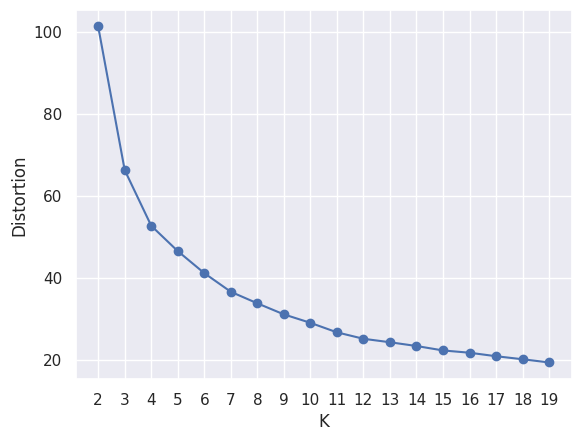

In [278]:
plt.plot(range(2,20), distortions, marker='o')
plt.xticks(range(2, 20))
plt.xlabel('K')
plt.ylabel('Distortion')
plt.grid(True)
plt.show()

Observamos que el valor de 5 para K se obtiene una ligera curva, el cual usaremos dichos valores para el parámetro "n_clusters" en K-means.

Elbow:  6


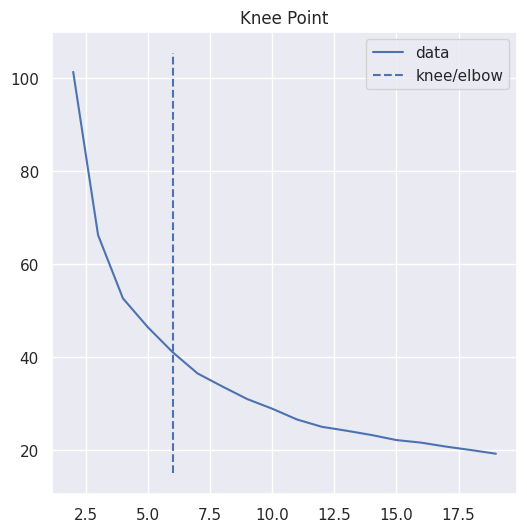

In [279]:
kneedle = kneed.KneeLocator(range(2, 20), distortions[:20], curve="convex", direction="decreasing")
elbow_point = kneedle.elbow
print('Elbow: ', elbow_point)
kneedle.plot_knee()

Identificamos que, con el método del codo tenemos el valor de 6 para ser empleado en el parámetro "n_clusters" en K-means.

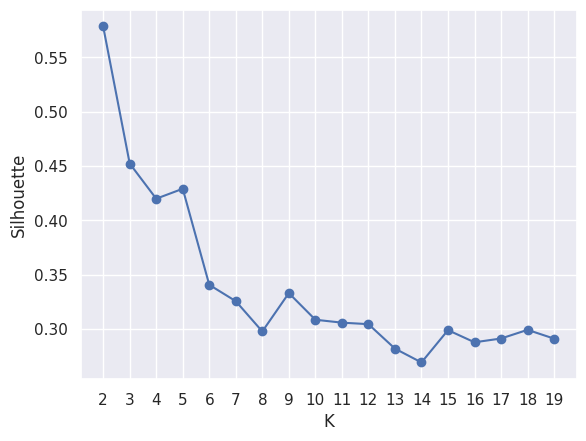

In [280]:
plt.plot(range(2,20), silhouettes , marker='o')
plt.xticks(range(2, 20))
plt.xlabel('K')
plt.ylabel('Silhouette')
plt.grid(True)
plt.show()

Con el método de la silhouette obtenemos el valor de 2 para ser empleado en el parámetro "n_clusters" en K-means.

#### K-means con k = 6

In [281]:
start_time = time.time()
kmeans = KMeans(n_clusters = 6, random_state = 0)
new_clusters = kmeans.fit_predict(train_normalization_six_dim)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  0.006968498229980469


In [282]:
score = silhouette_score(train_normalization_six_dim, new_clusters)
print("Silhouette Score: ", score)

Silhouette Score:  0.322534217838417


In [283]:
silhouette_vals = silhouette_samples(train_normalization_six_dim, new_clusters)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  16


In [284]:
lof_outliers = encontrar_outliers_lof(train_normalization_six_dim, new_clusters)

Número de outliers identificados:  39


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


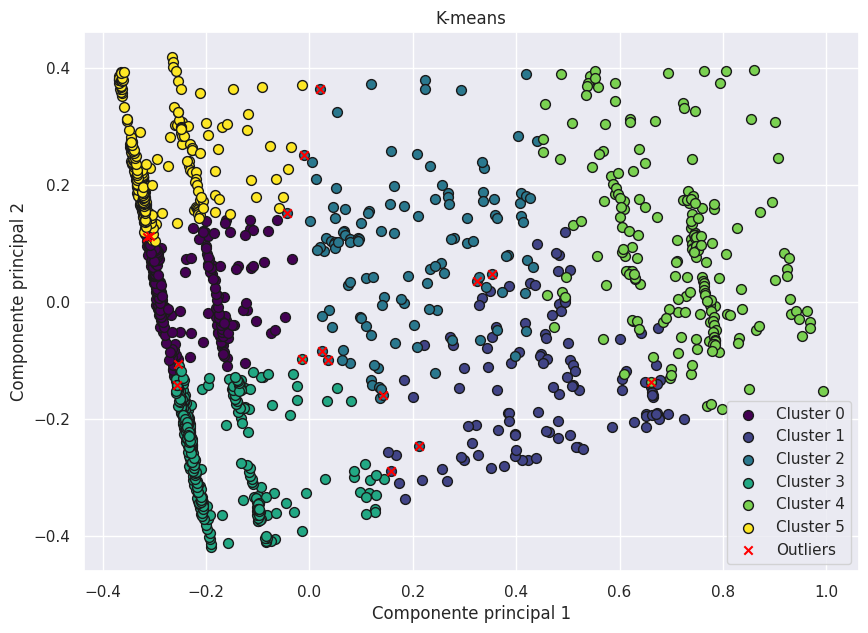

In [285]:
title = "K-means"
pca_para_visualizacion(train_normalization_six_dim, new_clusters, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


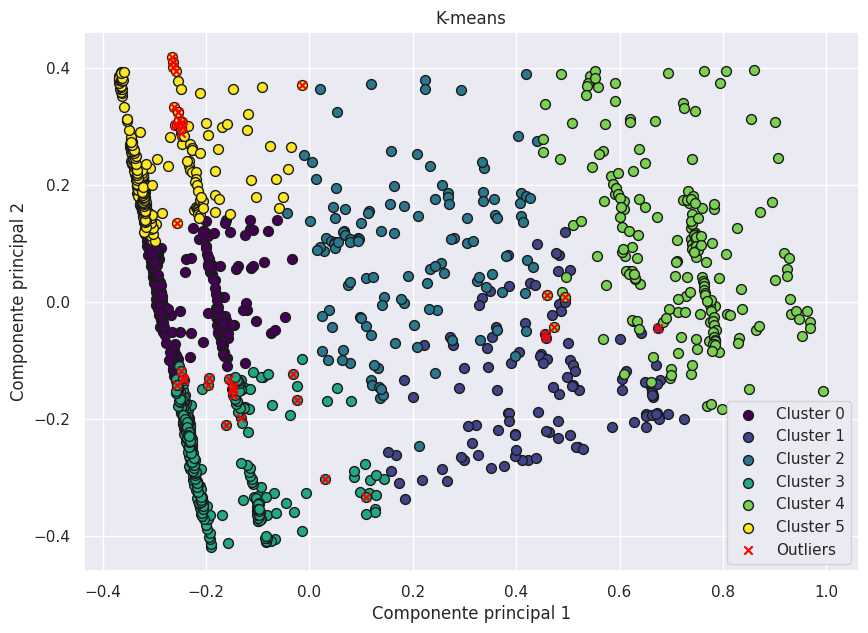

In [286]:
title = "K-means"
pca_para_visualizacion(train_normalization_six_dim, new_clusters, lof_outliers, title)

#### K-means con k = 5

In [287]:
start_time = time.time()
kmeans = KMeans(n_clusters = 5, random_state = 0)
new_clusters = kmeans.fit_predict(train_normalization_six_dim)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  0.006911516189575195


In [288]:
score = silhouette_score(train_normalization_six_dim, new_clusters)
print("Silhouette Score: ", score)

Silhouette Score:  0.4154924241494542


In [289]:
silhouette_vals = silhouette_samples(train_normalization_six_dim, new_clusters)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  19


In [290]:
lof_outliers = encontrar_outliers_lof(train_normalization_six_dim, new_clusters)

Número de outliers identificados:  36


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


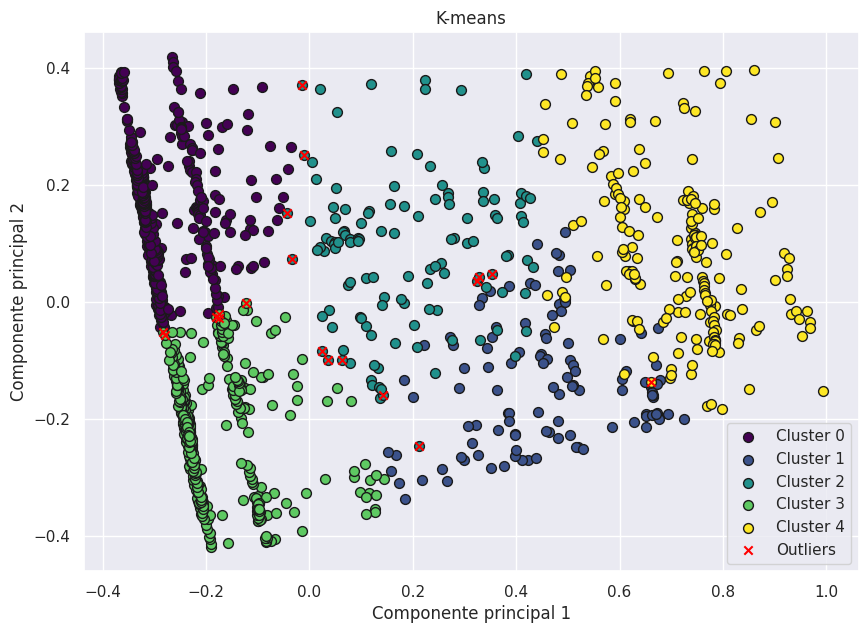

In [291]:
title = "K-means"
pca_para_visualizacion(train_normalization_six_dim, new_clusters, silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


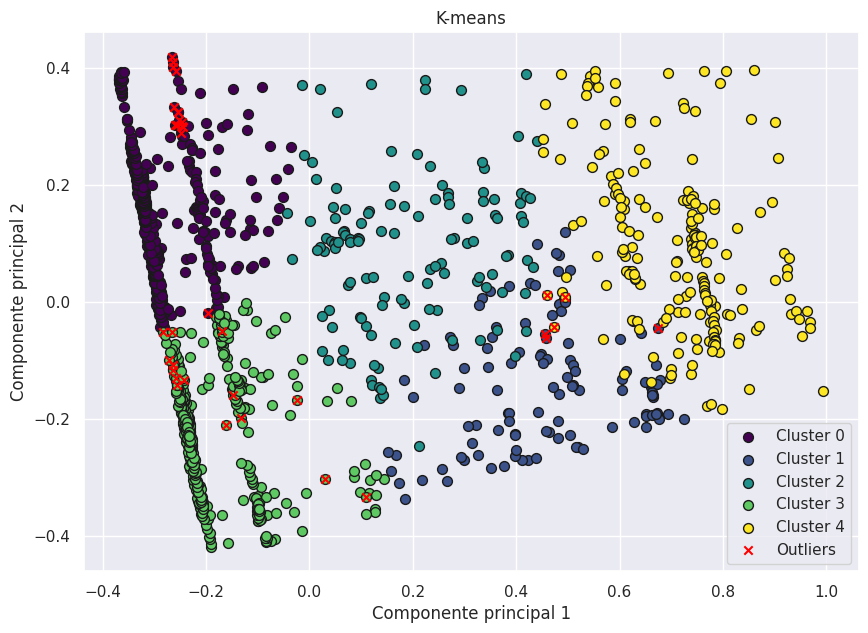

In [292]:
title = "K-means"
pca_para_visualizacion(train_normalization_six_dim, new_clusters, lof_outliers, title)

#### K-means con k = 2

In [293]:
start_time = time.time()
kmeans = KMeans(n_clusters = 2, random_state = 0)
six_dim_two_ite_new_clusters = kmeans.fit_predict(train_normalization_six_dim)
print("Tiempo de ejecución: ", time.time() - start_time)

Tiempo de ejecución:  0.004066944122314453


In [294]:
score = silhouette_score(train_normalization_six_dim, six_dim_two_ite_new_clusters)
print("Silhouette Score: ", score)

Silhouette Score:  0.5783193612271421


In [295]:
silhouette_vals = silhouette_samples(train_normalization_six_dim, six_dim_two_ite_new_clusters)

#Identificar puntos con bajo coeficiente de silhouette (posibles outliers)
sixdim_two_ite_silhouette_outliers = np.where(silhouette_vals < 0)[0]

print("Número de outliers identificados: ", len(silhouette_outliers))

Número de outliers identificados:  19


In [296]:
lof_outliers = encontrar_outliers_lof(train_normalization_six_dim, six_dim_two_ite_new_clusters)

Número de outliers identificados:  22


<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


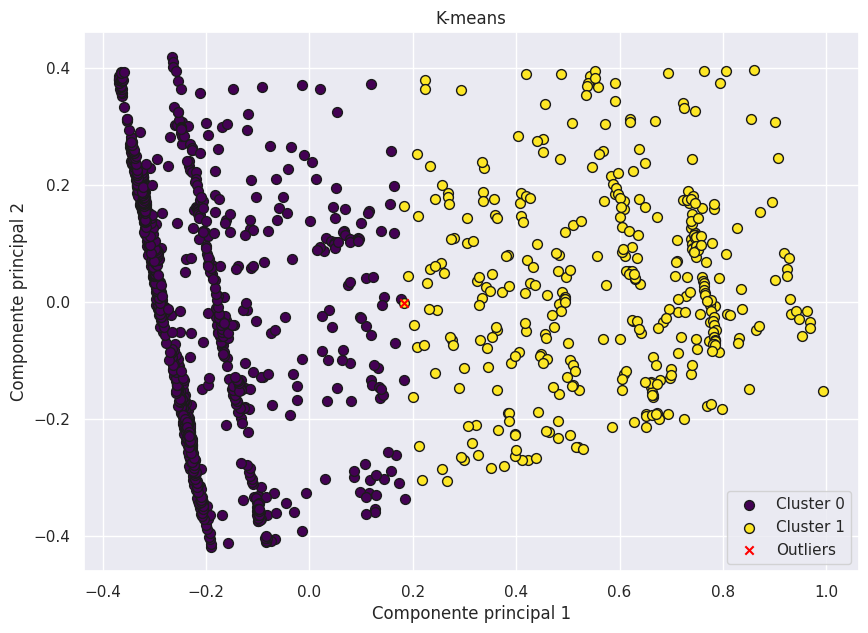

In [297]:
title = "K-means"
pca_para_visualizacion(train_normalization_six_dim, six_dim_two_ite_new_clusters, sixdim_two_ite_silhouette_outliers, title)

<ipython-input-113-5e6421d7007f>:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], c=color, label=f'Cluster {i}', edgecolor='k', s=50)


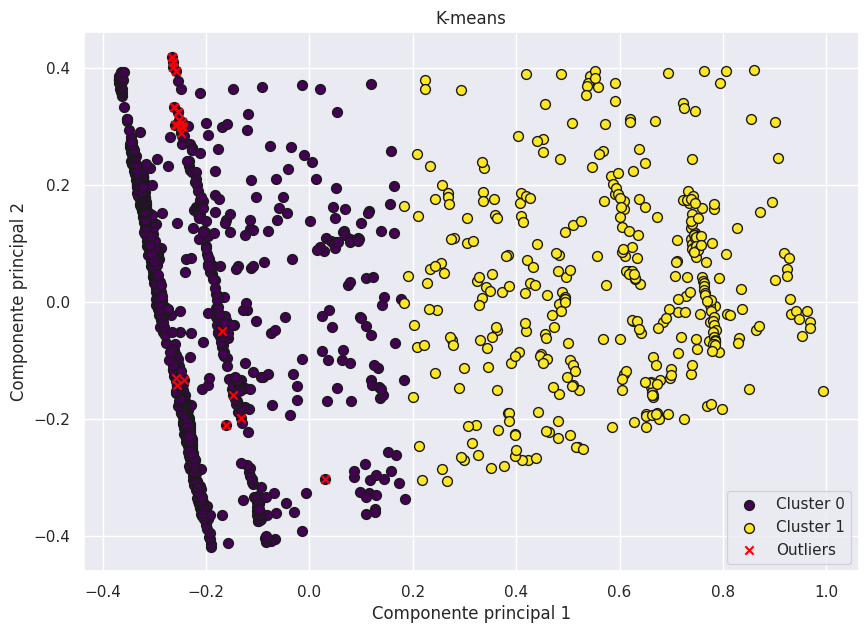

In [298]:
title = "K-means"
pca_para_visualizacion(train_normalization_six_dim, six_dim_two_ite_new_clusters, lof_outliers, title)

---
# Interpretación de los resultados
---

De acuerdo con los modelos empleados en la etapa de Minería de Datos: K-means con 2 clusters y 6 dimensiones, fue la técnica más representativa, obteniendo 1 valor atípico con un tiempo de ejecución de 5,20ms y 0,58 en su calidad de clusters según el Coeficiente de Silueta.

## Ratio de variabilidad

In [299]:
#Se realiza una copia a los datos originales de 6 dimensiones
df_original = train_selected_six_dim.copy()

In [301]:
columns = [
    'temperature_comedor_sensor',
    'co2_habitacion_sensor',
    'humedad_habitacion_sensor',
    'lighting_comedor_sensor',
    'lighting_habitacion_sensor',
    'humedad_exterior_sensor'
]

In [302]:
#Se creó un DataFrame de los datos normalizados
data_normalization_six_dim_df = pd.DataFrame(
    train_normalization_six_dim,
    columns=columns
)

In [303]:
pca = PCA(n_components=2)
pca.fit(data_normalization_six_dim_df)

#Coeficientes de cada variable en los componentes principales
componentes_df = pd.DataFrame(pca.components_.T,
                              columns=['Componente 1', 'Componente 2'],
                              index=data_normalization_six_dim_df.columns)

#Ratio de variabilidad explicado por cada componente
ratio_variabilidad = pca.explained_variance_ratio_ * 100

In [304]:
#Redondeo de los valores de los coeficientes y ratio de variabilidad
componentes_df = componentes_df.round(4)

#Fila adicional con el ratio de variabilidad
ratio_variabilidad_df = pd.DataFrame([ratio_variabilidad],
                                     columns=['Componente 1', 'Componente 2'],
                                     index=['Ratio de Variabilidad'])

tabla_final = pd.concat([componentes_df, ratio_variabilidad_df])
print(tabla_final)

                            Componente 1  Componente 2
temperature_comedor_sensor      0.022200     -0.272900
co2_habitacion_sensor           0.013300     -0.057900
humedad_habitacion_sensor      -0.089500      0.581100
lighting_comedor_sensor         0.676200      0.113600
lighting_habitacion_sensor      0.701000      0.189900
humedad_exterior_sensor        -0.206500      0.731800
Ratio de Variabilidad          73.114331     19.949852


## Resumen estadístico

*   Información del outlier encontrado


In [305]:
#Considerando que no se han realizado transformaciones con los datos normalizados
#y tienen la misma cantidad de filas e índices

#Información del Outlier en el conjunto de datos originales con 6 dimensiones
print(df_original.iloc[sixdim_two_ite_silhouette_outliers])

     temperature_comedor_sensor  co2_habitacion_sensor  \
317                      22.292                208.629   

     humedad_habitacion_sensor  lighting_comedor_sensor  \
317                    35.5027                  33.3533   

     lighting_habitacion_sensor  humedad_exterior_sensor  
317                     84.5653                   45.976  


*   Patrones en las agrupaciones resultantes



In [306]:
#Se realiza una copia de los datos sin la variable 'cluster'
df_original_copy_with_cluster = df_original.copy()

In [307]:
#Se agrega la variable 'cluster' al conjunto de datos
df_original_copy_with_cluster['cluster'] = six_dim_two_ite_new_clusters

*   Variable "temperature_comedor_sensor"

In [308]:
temperature_comedor_sensor_column = df_original_copy_with_cluster[['temperature_comedor_sensor', 'cluster']]
temperature_comedor_sensor_column.groupby('cluster').describe()

temperature_comedor_sensor                                          \
                             count       mean       std      min       25%   
cluster                                                                      
0                           1002.0  23.056081  2.625115  16.9833  21.10900   
1                            371.0  23.211612  2.343198  17.5013  21.46735   

                                       
              50%        75%      max  
cluster                                
0        23.15465  24.960325  28.9240  
1        23.28400  24.968650  28.5227

*   Variable "co2_habitacion_sensor"

In [309]:
co2_habitacion_sensor_column = df_original_copy_with_cluster[['co2_habitacion_sensor', 'cluster']]
co2_habitacion_sensor_column.groupby('cluster').describe()

co2_habitacion_sensor                                          \
                        count        mean       std      min      25%   
cluster                                                                 
0                      1002.0  205.660077  7.196163  192.107  199.397   
1                       371.0  207.386315  8.773412  192.416  200.640   

                                    
             50%       75%     max  
cluster                             
0        207.552  210.5335  231.07  
1        209.120  211.6105  231.07

*   Variable "humedad_habitacion_sensor"

In [310]:
humedad_habitacion_sensor_column = df_original_copy_with_cluster[['humedad_habitacion_sensor', 'cluster']]
humedad_habitacion_sensor_column.groupby('cluster').describe()

humedad_habitacion_sensor                                        \
                            count       mean       std      min     25%   
cluster                                                                   
0                          1002.0  39.659807  6.865079  27.2560  33.004   
1                           371.0  37.067679  6.105935  28.1413  31.566   

                                       
              50%        75%      max  
cluster                                
0        39.86065  45.011975  52.6240  
1        35.21600  42.592000  49.3307

*   Variable "lighting_comedor_sensor"

In [311]:
lighting_comedor_sensor_column = df_original_copy_with_cluster[['lighting_comedor_sensor', 'cluster']]
lighting_comedor_sensor_column.groupby('cluster').describe()

lighting_comedor_sensor                                           \
                          count       mean        std      min       25%   
cluster                                                                    
0                        1002.0  17.053287   9.334631  10.8380  11.52400   
1                         371.0  77.731232  16.713253  33.3533  69.24065   

                                     
             50%       75%      max  
cluster                              
0        11.6867  21.00200   58.664  
1        81.2427  83.35535  111.797

*   Variable "lighting_habitacion_sensor"

In [312]:
lighting_habitacion_sensor_column = df_original_copy_with_cluster[['lighting_habitacion_sensor', 'cluster']]
lighting_habitacion_sensor_column.groupby('cluster').describe()

lighting_habitacion_sensor                                            \
                             count        mean        std      min       25%   
cluster                                                                        
0                           1002.0   21.794027  11.863002  13.5093  14.67870   
1                            371.0  109.756077  28.459696  43.6160  86.30935   

                                     
              50%      75%      max  
cluster                              
0         15.1653   24.692   84.480  
1        114.4110  138.640  157.157

*   Variable "humedad_exterior_sensor"

In [313]:
humedad_exterior_sensor_column = df_original_copy_with_cluster[['humedad_exterior_sensor', 'cluster']]
humedad_exterior_sensor_column.groupby('cluster').describe()

humedad_exterior_sensor                                           \
                          count       mean        std      min       25%   
cluster                                                                    
0                        1002.0  50.522640  12.899368  23.7760  39.48830   
1                         371.0  40.280591   8.946924  22.2467  33.59665   

                                      
             50%        75%      max  
cluster                               
0        52.6387  60.531975  75.8907  
1        39.5053  45.925350  64.6560

*   Diagrama de violín

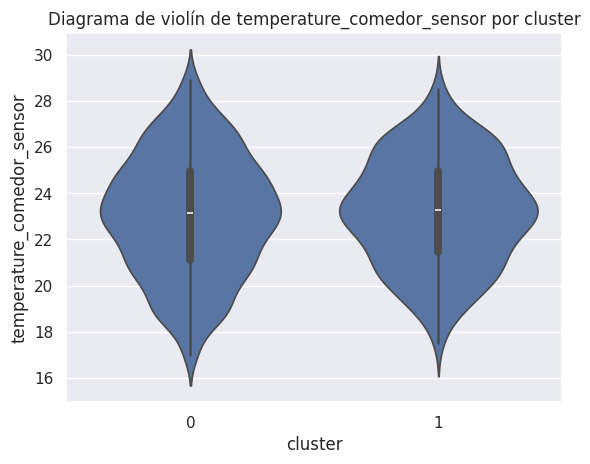

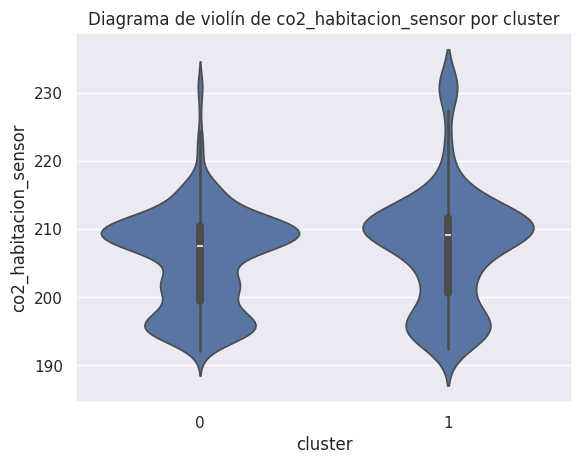

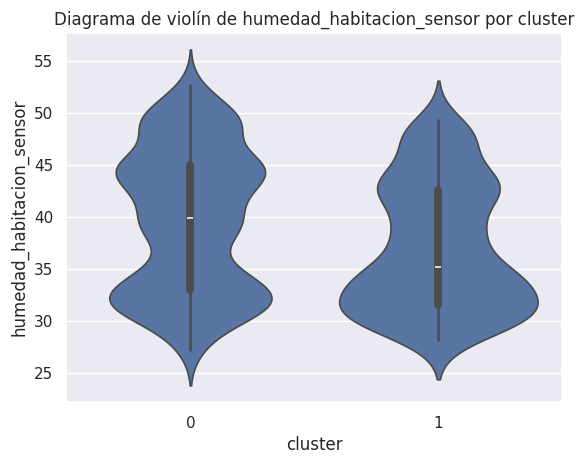

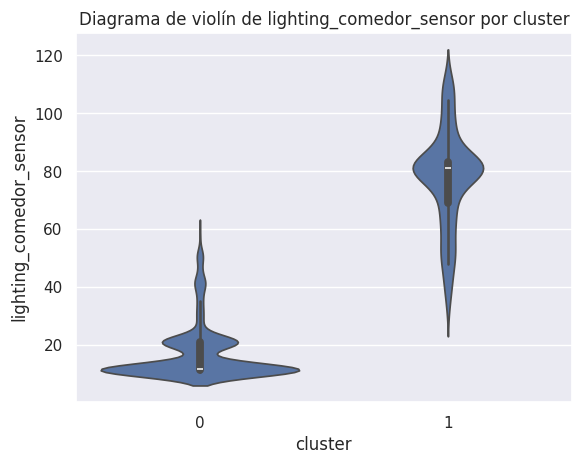

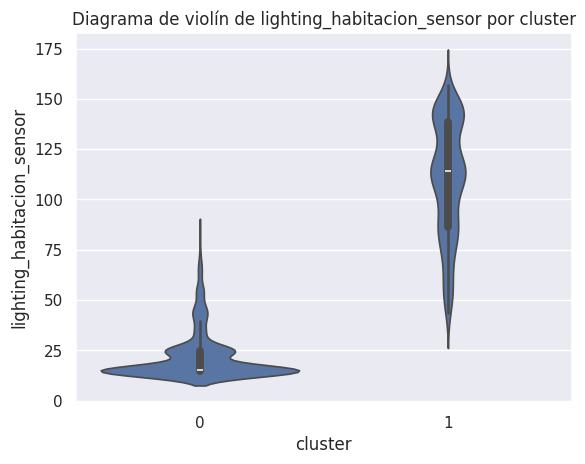

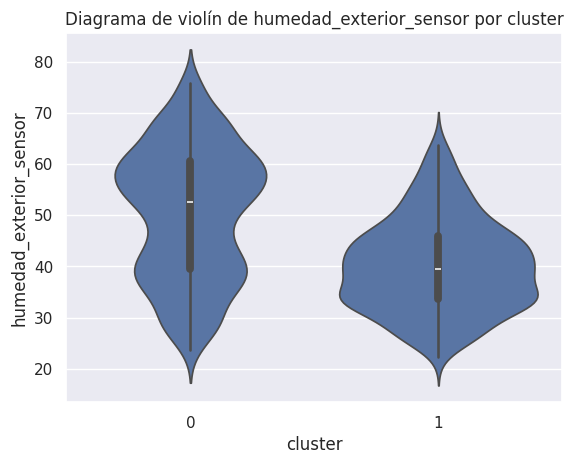

In [314]:
for col in columns:
    plt.figure()
    sns.violinplot(x='cluster', y=col, data=df_original_copy_with_cluster)
    plt.title(f'Diagrama de violín de {col} por cluster')
    plt.show()